In [1]:
# read the data
import matplotlib.pyplot as plt
import numpy as np
#import pandas as pd 
import matplotlib
import sys     
import mne     
import os
from mne.preprocessing import ICA
from scipy import stats
import seaborn as sns
import pandas as pd
#%matplotlib qt
sys.path.append(os.path.abspath('..'))
from utils import identify_bad_channels,remove_epochs_with_bad_mmn_channels, Average_in_trials_in_time_window,remove_or_interpolate_epochs_with_n_bad_chn
from stats_utils import extract_mmn_latencies,align_and_standardize_evokeds,extract_peak_amplitude,extract_mean_amplitudes
from visualization import plot_erps
#, #

In [2]:
folder = r"E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched"
sub = 'sub-sd024'

In [3]:
epochs = mne.read_epochs(f'{os.path.join(folder,sub)}-epo.fif', preload=True)

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd024-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1556 matching events found
No baseline correction applied
0 projection items activated


In [4]:
SN_devi_eps = epochs['S15'].average()
BN_sta_eps = epochs['S14'].average()

BN_devi_eps = epochs['S25'].average() 
SN_sta_eps = epochs['S24'].average() 

combining channels using "mean"
combining channels using "mean"


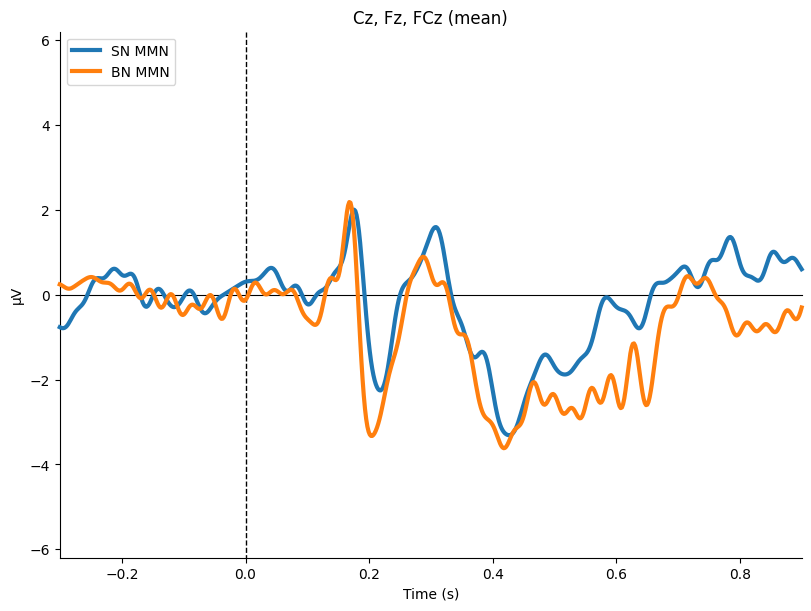

[<Figure size 800x600 with 1 Axes>]

In [5]:
evokeds = { 
    "SN MMN" : SN_sta_eps ,
    'BN MMN':BN_sta_eps,
    # "CN MMN" : mne.combine_evoked([ CN_devi_eps,CN_sta_eps], weights=[1,-1]),
           }

stylesdict ={"SN MMN": {"linewidth": 3,"linestyle":'solid'},
             "BN MMN" : {"linewidth": 3,"linestyle":'solid'},
            #  "CN MMN" : {"linewidth": 3,"linestyle":'solid'},
             }
mne.viz.plot_compare_evokeds(evokeds,styles = stylesdict,
                             truncate_xaxis=False,truncate_yaxis=False,picks=['Cz','Fz', "FCz"],combine = 'mean',
                             ylim = dict(eeg=[-6.2,6.2]))

## Read Epoch data

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd011-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1291 matching events found
No baseline correction applied
0 projection items activated
BN STD :  373 SN STD :  708
combining channels using "mean"
combining channels using "mean"


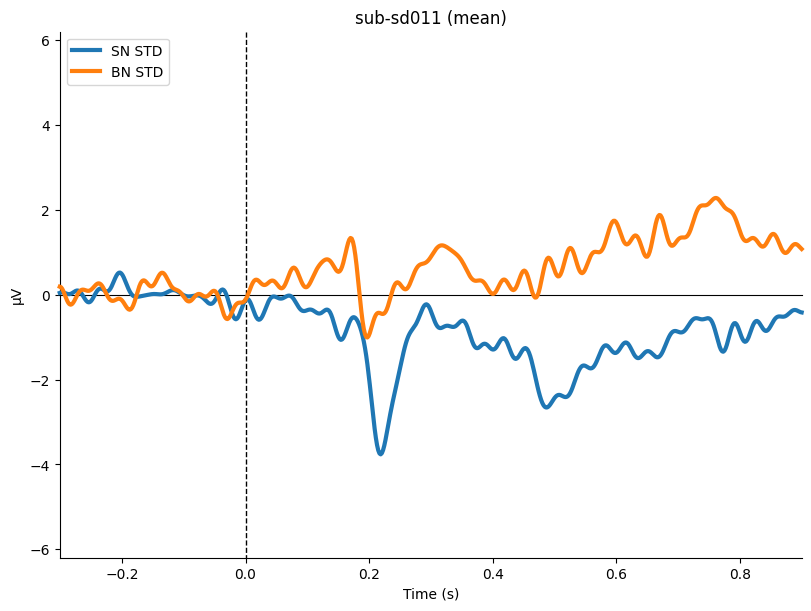

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd012-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1519 matching events found
No baseline correction applied
0 projection items activated
BN STD :  667 SN STD :  606
combining channels using "mean"
combining channels using "mean"


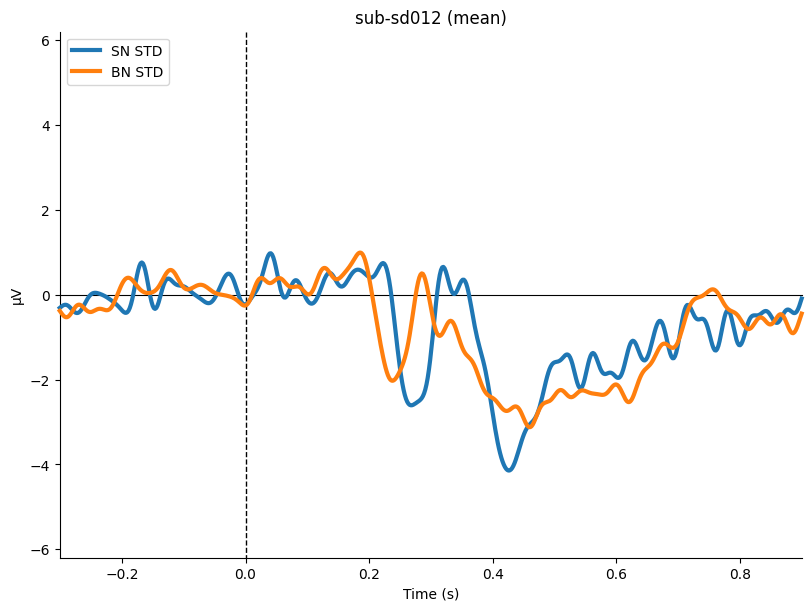

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd013-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1702 matching events found
No baseline correction applied
0 projection items activated
BN STD :  695 SN STD :  724
combining channels using "mean"
combining channels using "mean"


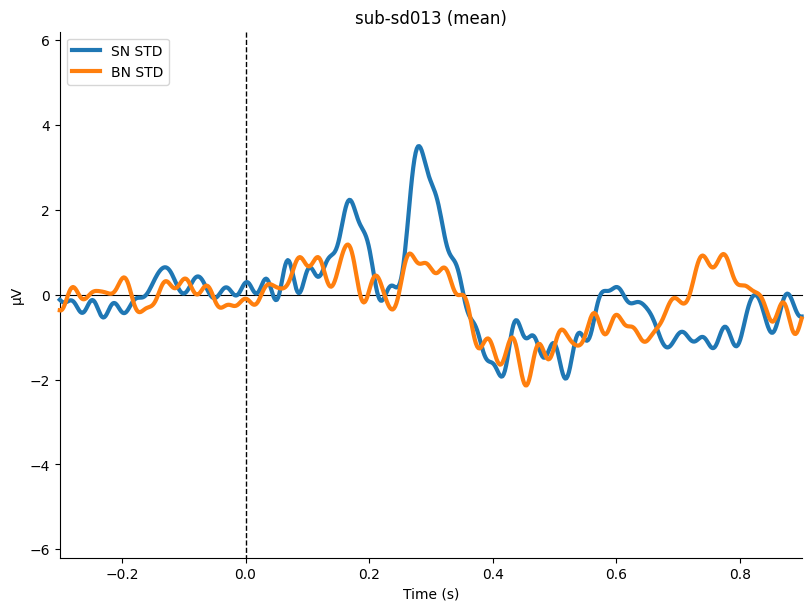

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd015-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1723 matching events found
No baseline correction applied
0 projection items activated
BN STD :  725 SN STD :  712
combining channels using "mean"
combining channels using "mean"


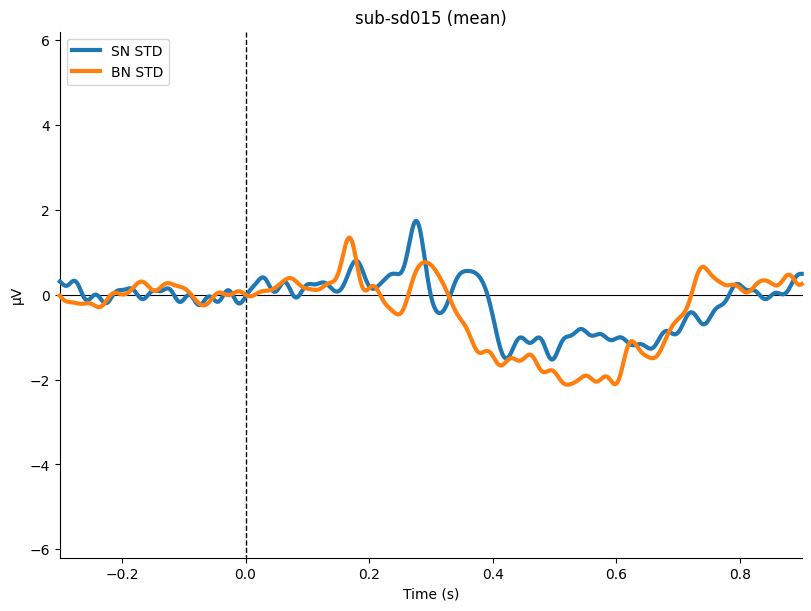

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd016-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1758 matching events found
No baseline correction applied
0 projection items activated
BN STD :  736 SN STD :  734
combining channels using "mean"
combining channels using "mean"


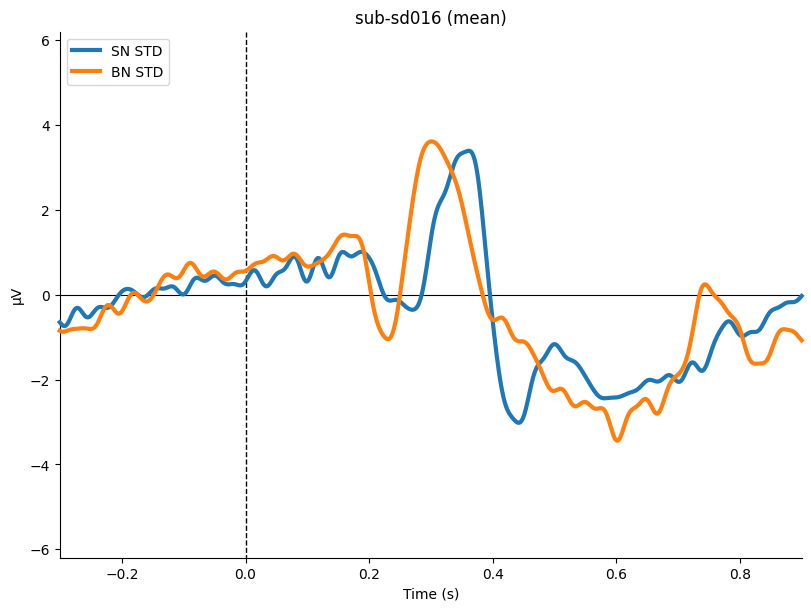

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd017-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1464 matching events found
No baseline correction applied
0 projection items activated
BN STD :  606 SN STD :  613
combining channels using "mean"
combining channels using "mean"


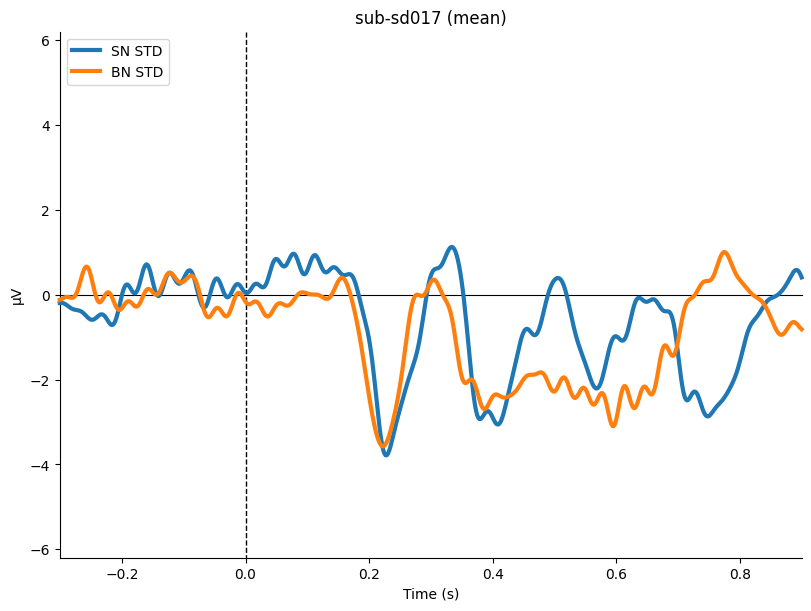

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd018-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1539 matching events found
No baseline correction applied
0 projection items activated
BN STD :  677 SN STD :  603
combining channels using "mean"
combining channels using "mean"


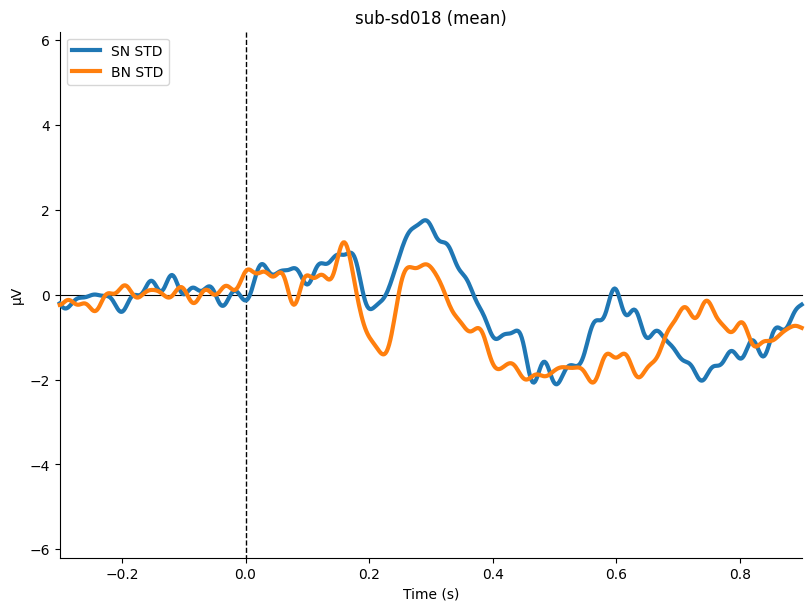

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd019-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1409 matching events found
No baseline correction applied
0 projection items activated
BN STD :  490 SN STD :  687
combining channels using "mean"
combining channels using "mean"


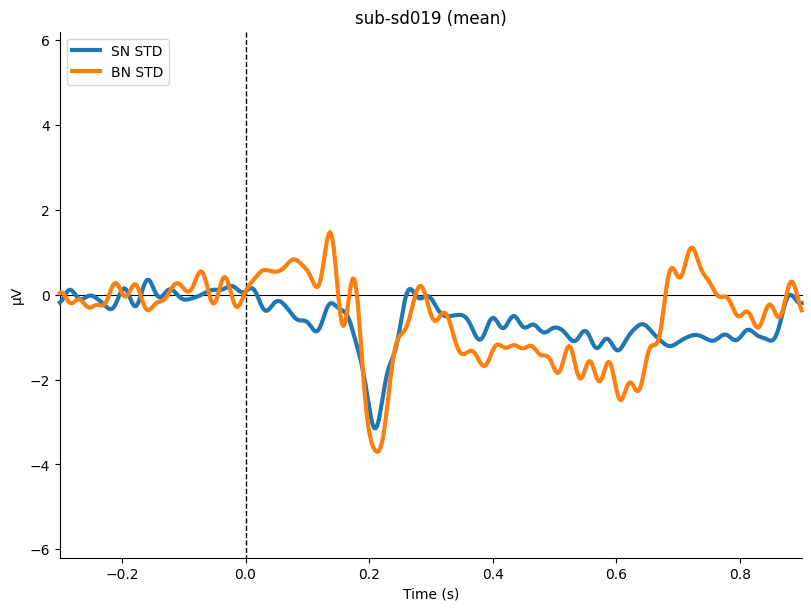

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd020-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1576 matching events found
No baseline correction applied
0 projection items activated
BN STD :  591 SN STD :  719
combining channels using "mean"
combining channels using "mean"


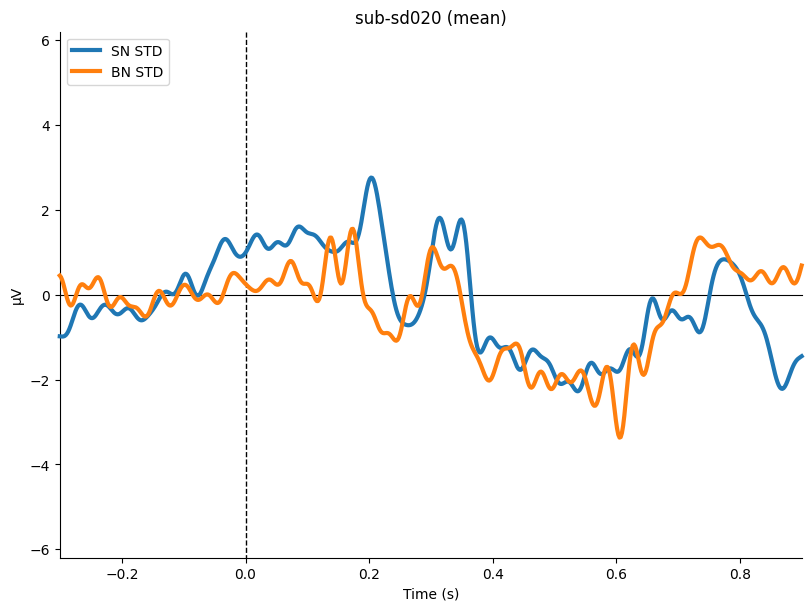

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd021-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1605 matching events found
No baseline correction applied
0 projection items activated
BN STD :  645 SN STD :  691
combining channels using "mean"
combining channels using "mean"


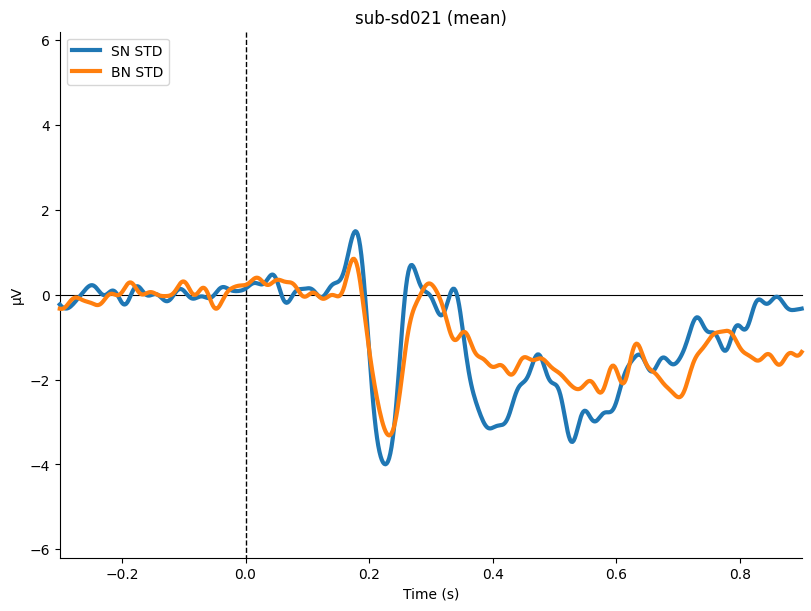

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd022-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1703 matching events found
No baseline correction applied
0 projection items activated
BN STD :  711 SN STD :  709
combining channels using "mean"
combining channels using "mean"


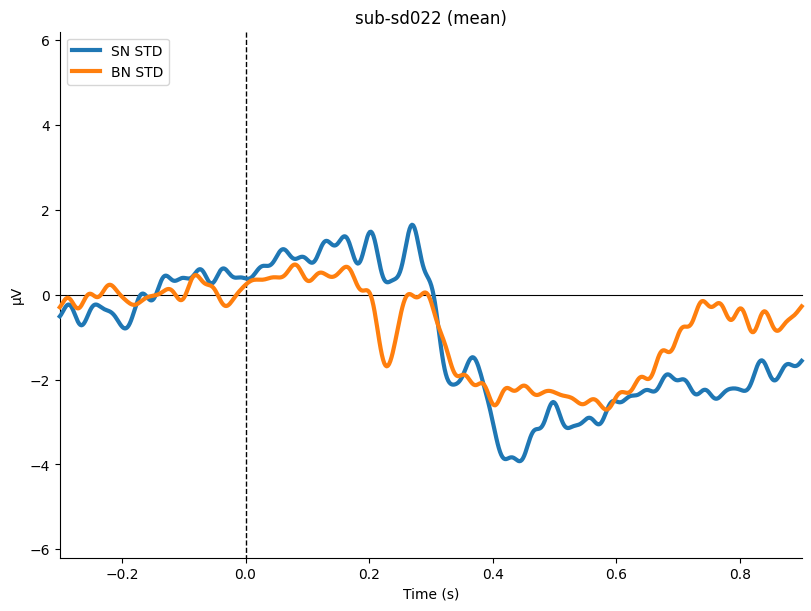

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd023-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1172 matching events found
No baseline correction applied
0 projection items activated
BN STD :  537 SN STD :  449
combining channels using "mean"
combining channels using "mean"


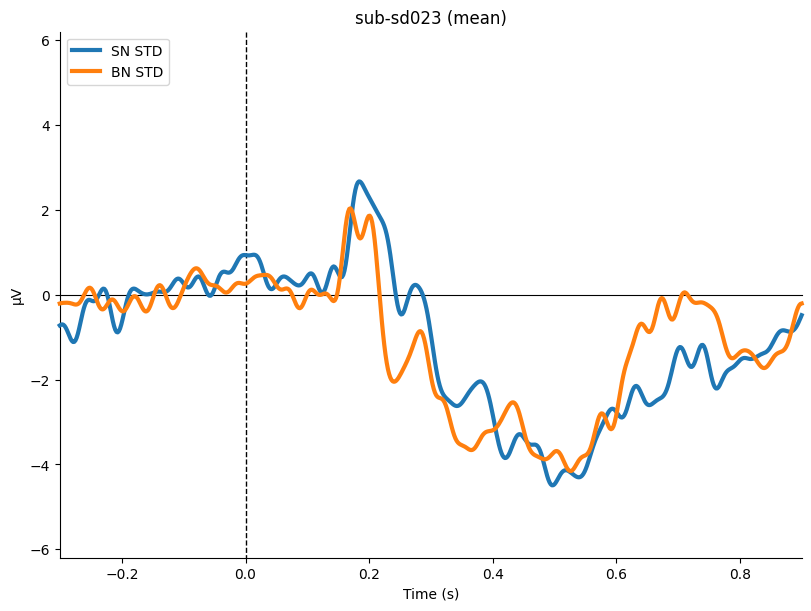

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd024-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1556 matching events found
No baseline correction applied
0 projection items activated
BN STD :  645 SN STD :  657
combining channels using "mean"
combining channels using "mean"


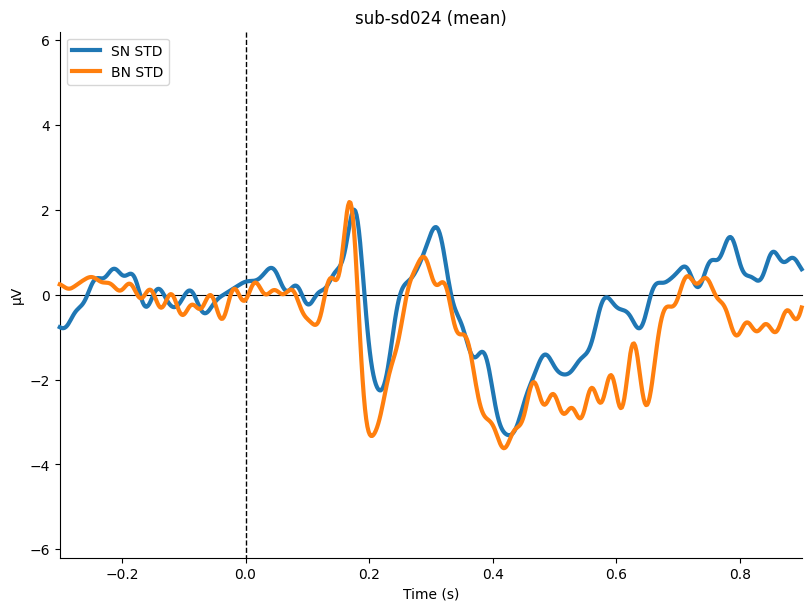

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd025-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1694 matching events found
No baseline correction applied
0 projection items activated
BN STD :  706 SN STD :  702
combining channels using "mean"
combining channels using "mean"


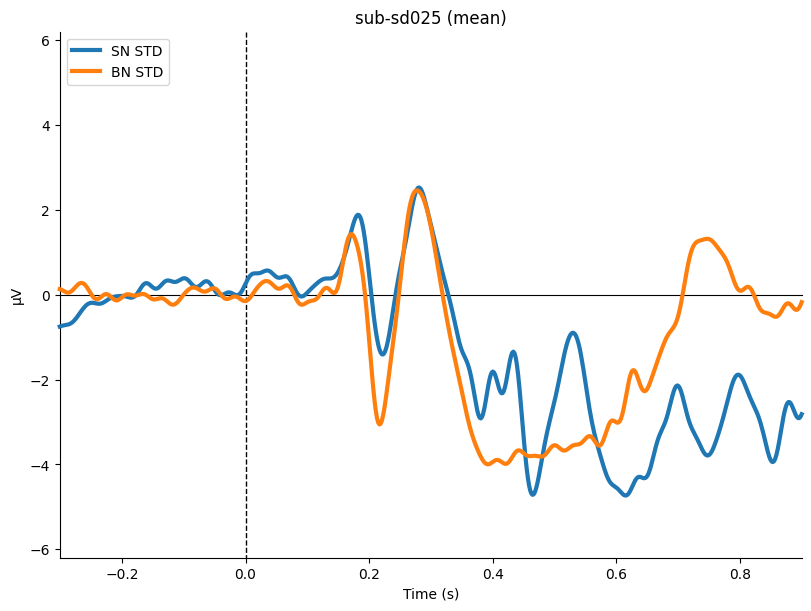

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd026-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1467 matching events found
No baseline correction applied
0 projection items activated
BN STD :  561 SN STD :  650
combining channels using "mean"
combining channels using "mean"


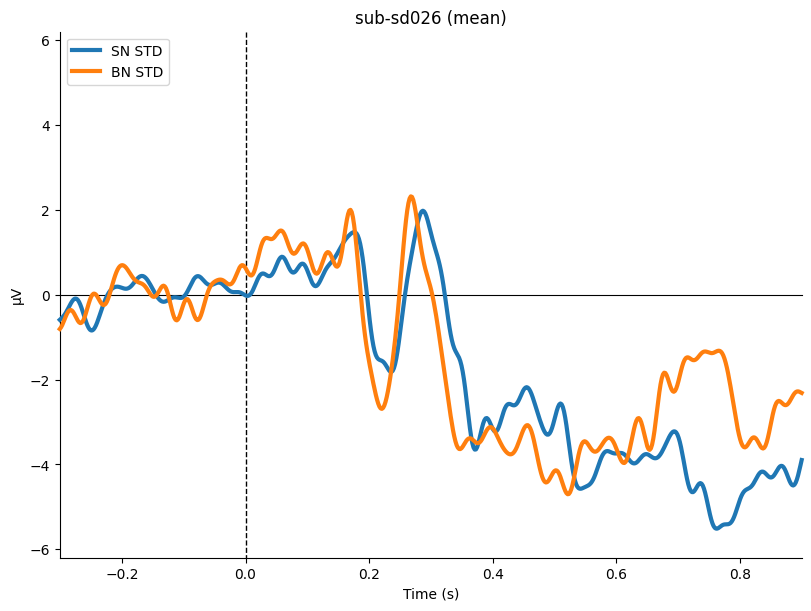

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd027-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1752 matching events found
No baseline correction applied
0 projection items activated
BN STD :  729 SN STD :  729
combining channels using "mean"
combining channels using "mean"


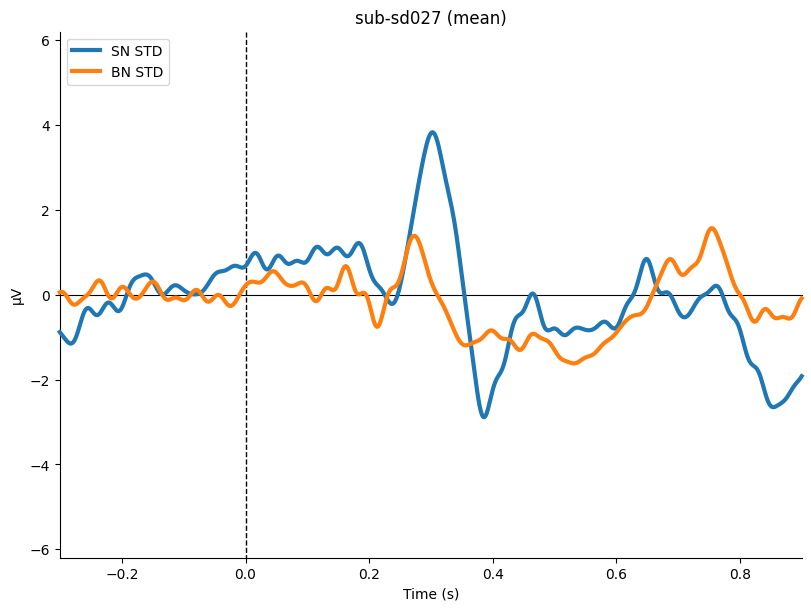

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd028-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1664 matching events found
No baseline correction applied
0 projection items activated
BN STD :  677 SN STD :  711
combining channels using "mean"
combining channels using "mean"


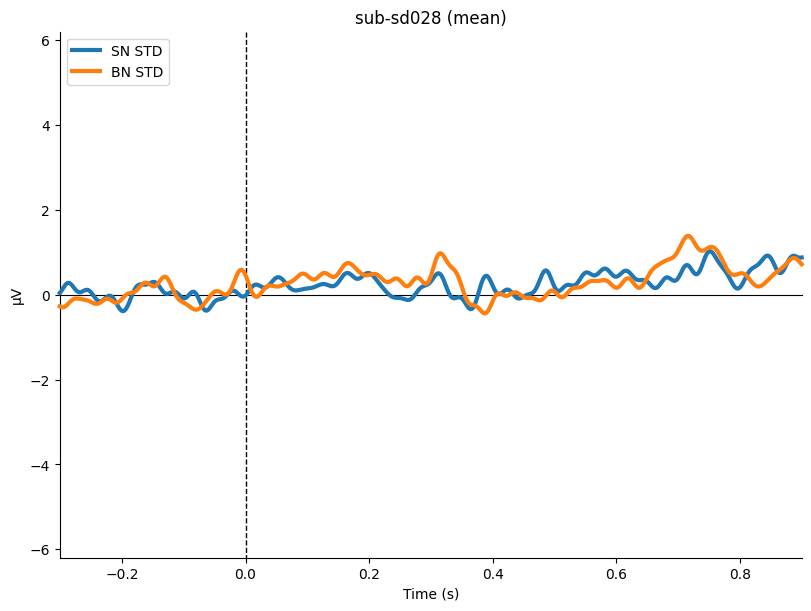

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd029-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1716 matching events found
No baseline correction applied
0 projection items activated
BN STD :  716 SN STD :  716
combining channels using "mean"
combining channels using "mean"


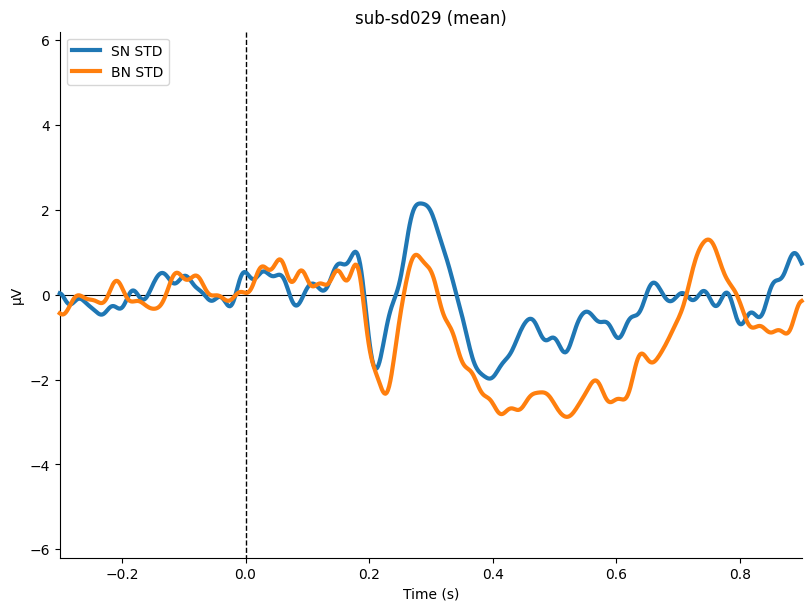

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd030-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1781 matching events found
No baseline correction applied
0 projection items activated
BN STD :  740 SN STD :  747
combining channels using "mean"
combining channels using "mean"


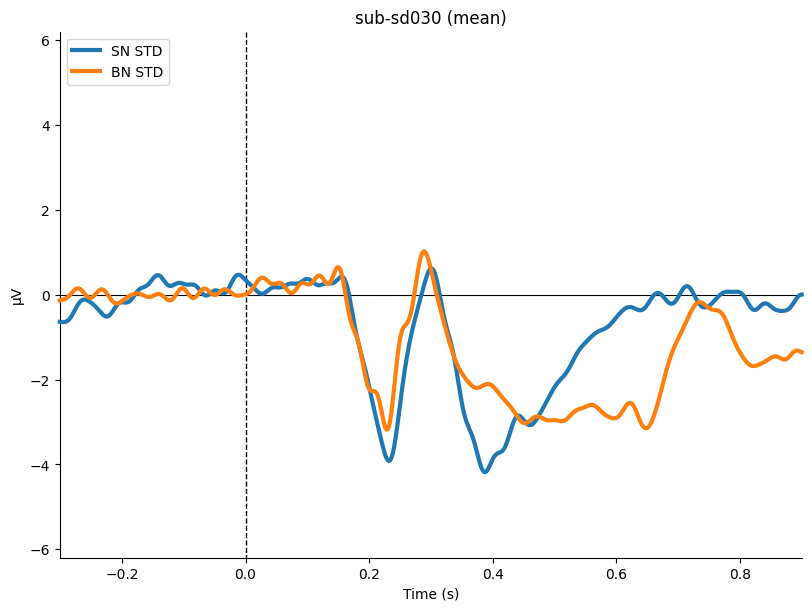

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd031-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1519 matching events found
No baseline correction applied
0 projection items activated
BN STD :  605 SN STD :  659
combining channels using "mean"
combining channels using "mean"


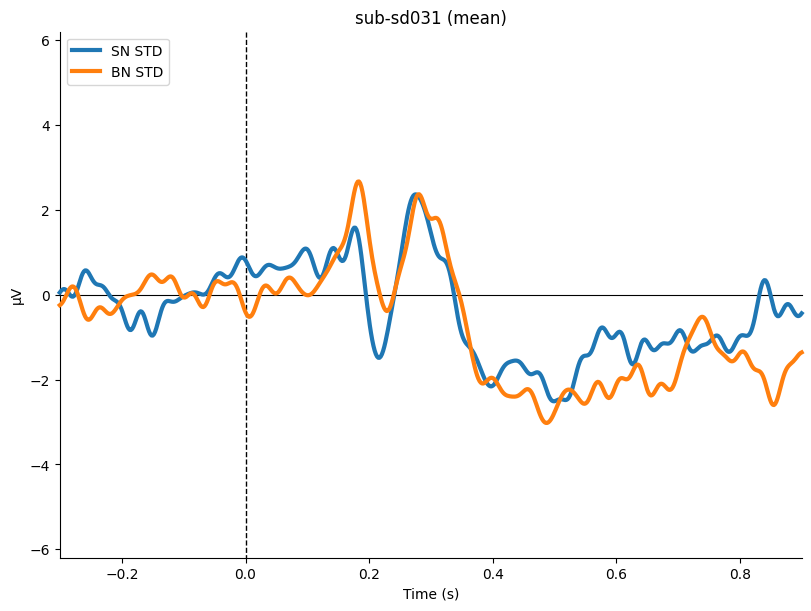

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd032-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1558 matching events found
No baseline correction applied
0 projection items activated
BN STD :  658 SN STD :  664
combining channels using "mean"
combining channels using "mean"


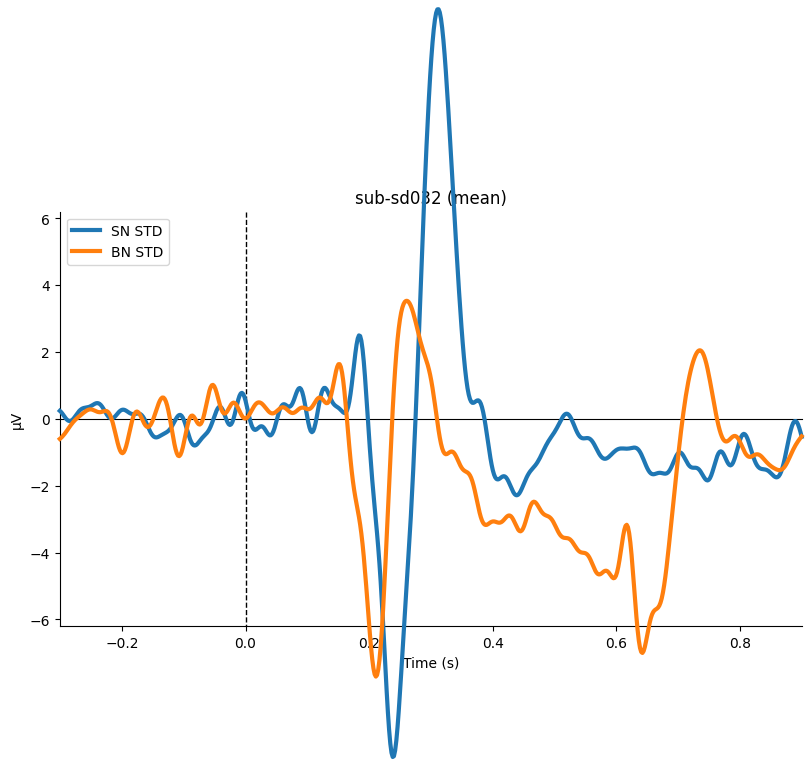

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd033-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1689 matching events found
No baseline correction applied
0 projection items activated
BN STD :  663 SN STD :  742
combining channels using "mean"
combining channels using "mean"


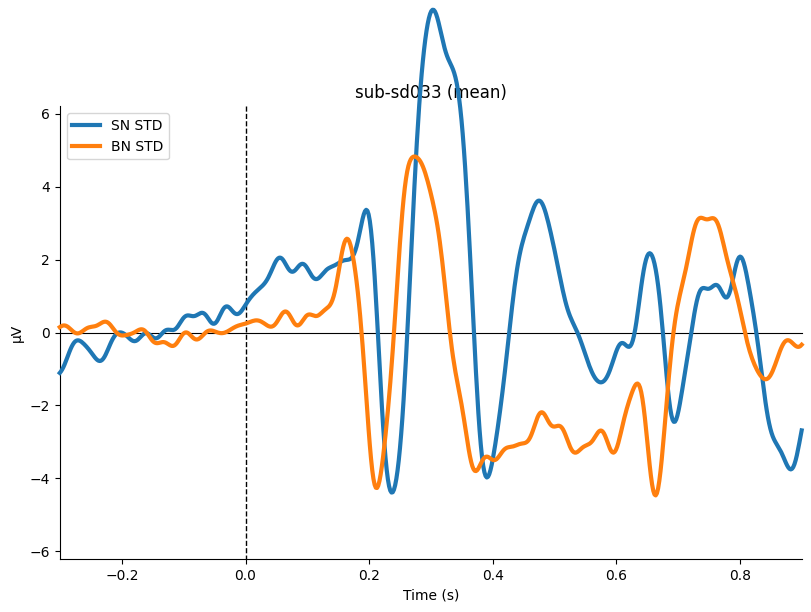

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd034-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1584 matching events found
No baseline correction applied
0 projection items activated
BN STD :  634 SN STD :  680
combining channels using "mean"
combining channels using "mean"


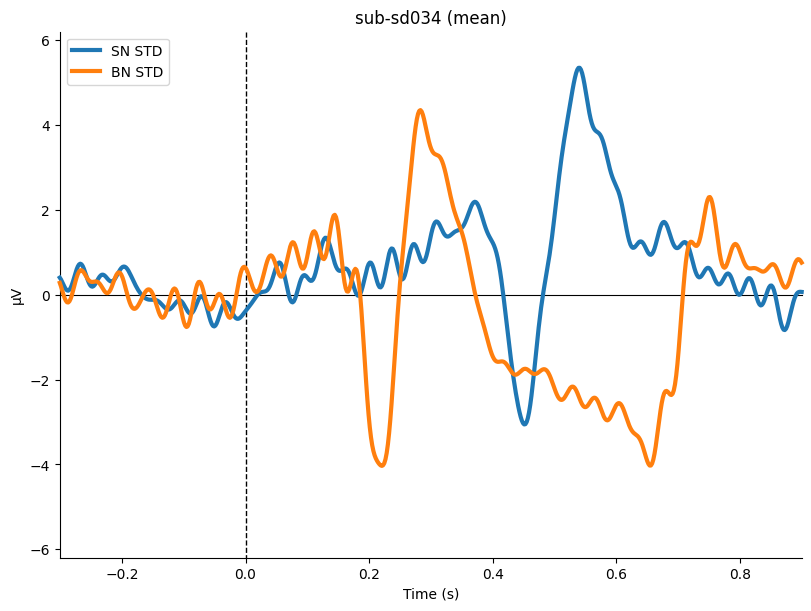

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd035-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2241 matching events found
No baseline correction applied
0 projection items activated
BN STD :  547 SN STD :  689
combining channels using "mean"
combining channels using "mean"


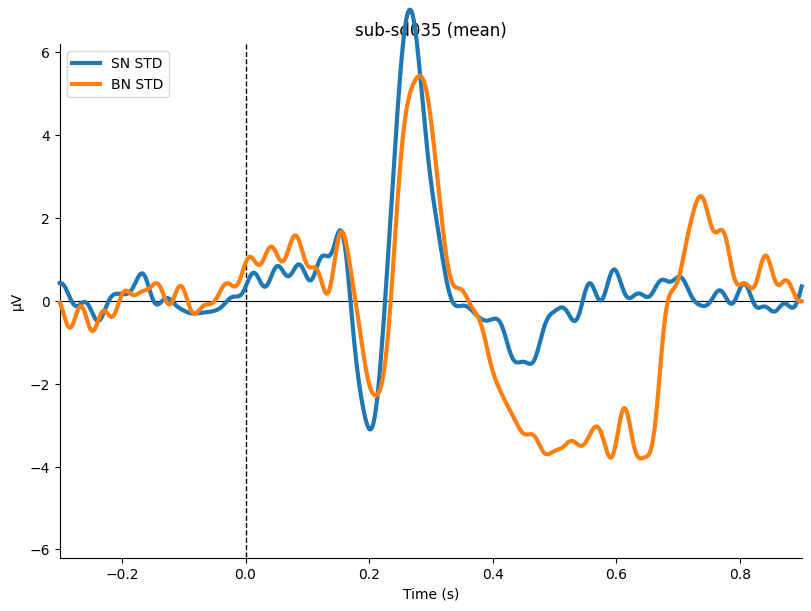

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd036-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2379 matching events found
No baseline correction applied
0 projection items activated
BN STD :  565 SN STD :  697
combining channels using "mean"
combining channels using "mean"


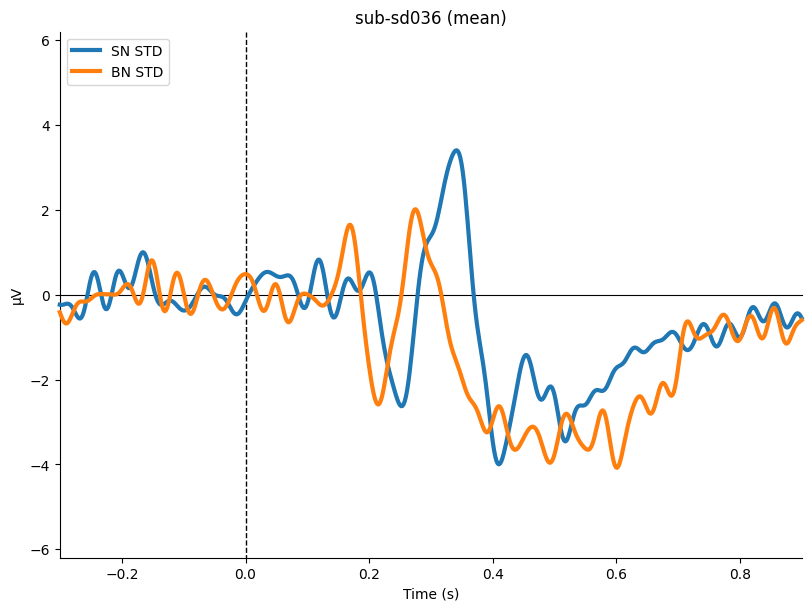

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd037-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2558 matching events found
No baseline correction applied
0 projection items activated
BN STD :  709 SN STD :  719
combining channels using "mean"
combining channels using "mean"


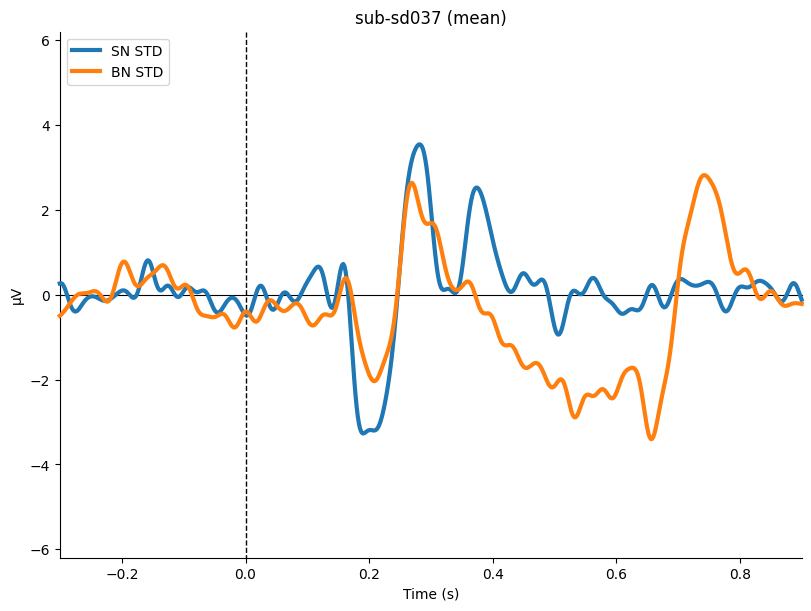

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd038-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1941 matching events found
No baseline correction applied
0 projection items activated
BN STD :  665 SN STD :  580
combining channels using "mean"
combining channels using "mean"


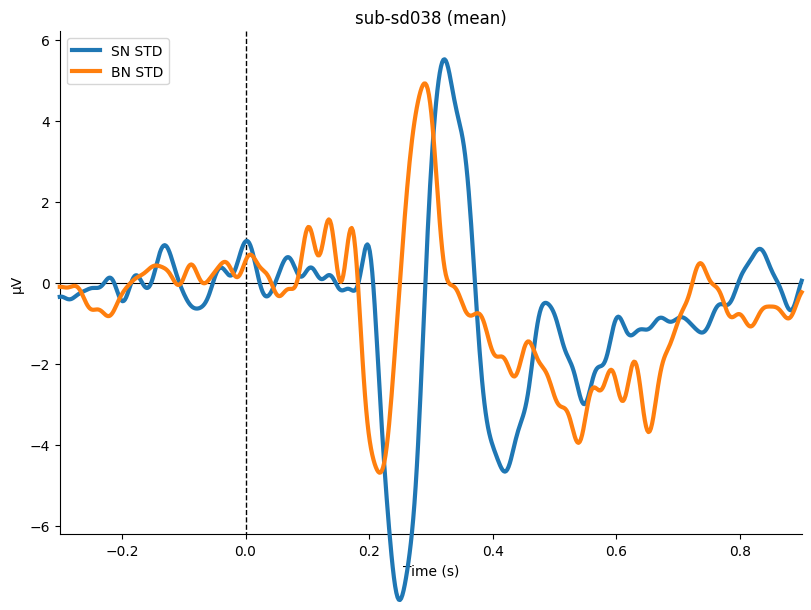

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd039-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2558 matching events found
No baseline correction applied
0 projection items activated
BN STD :  674 SN STD :  730
combining channels using "mean"
combining channels using "mean"


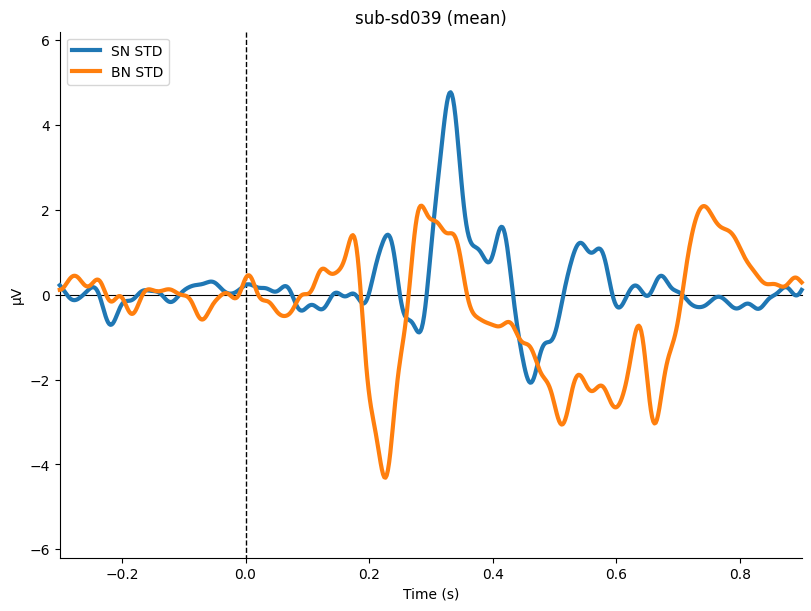

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd040-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2158 matching events found
No baseline correction applied
0 projection items activated
BN STD :  548 SN STD :  677
combining channels using "mean"
combining channels using "mean"


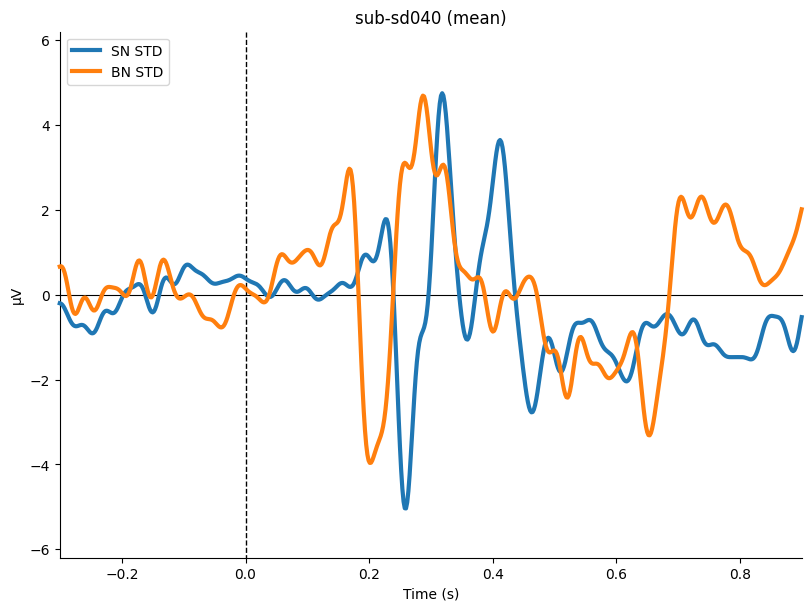

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd041-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2668 matching events found
No baseline correction applied
0 projection items activated
BN STD :  1455 SN STD :  729
combining channels using "mean"
combining channels using "mean"


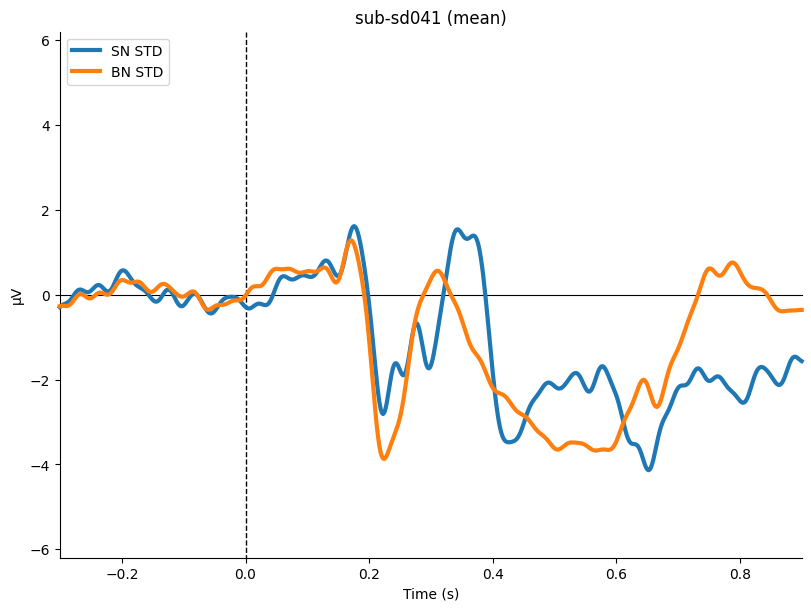

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd042-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2402 matching events found
No baseline correction applied
0 projection items activated
BN STD :  693 SN STD :  650
combining channels using "mean"
combining channels using "mean"


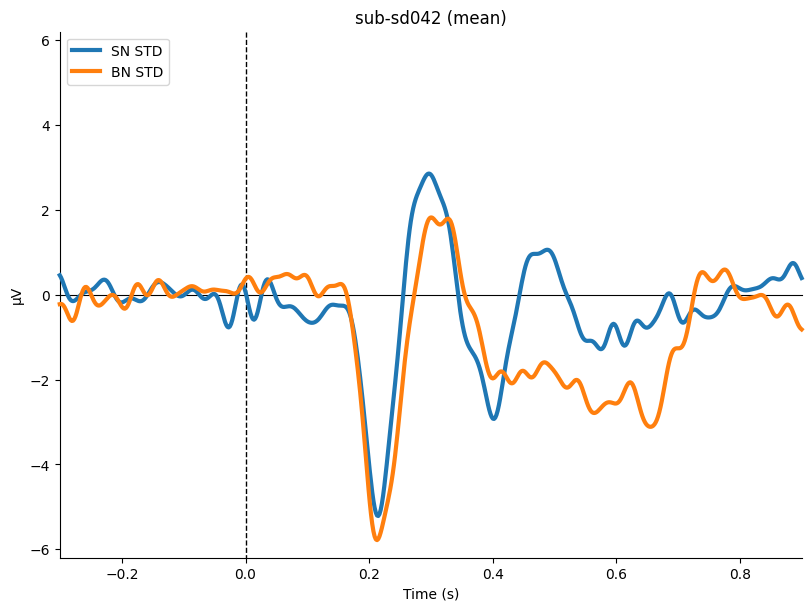

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd044-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2067 matching events found
No baseline correction applied
0 projection items activated
BN STD :  556 SN STD :  679
combining channels using "mean"
combining channels using "mean"


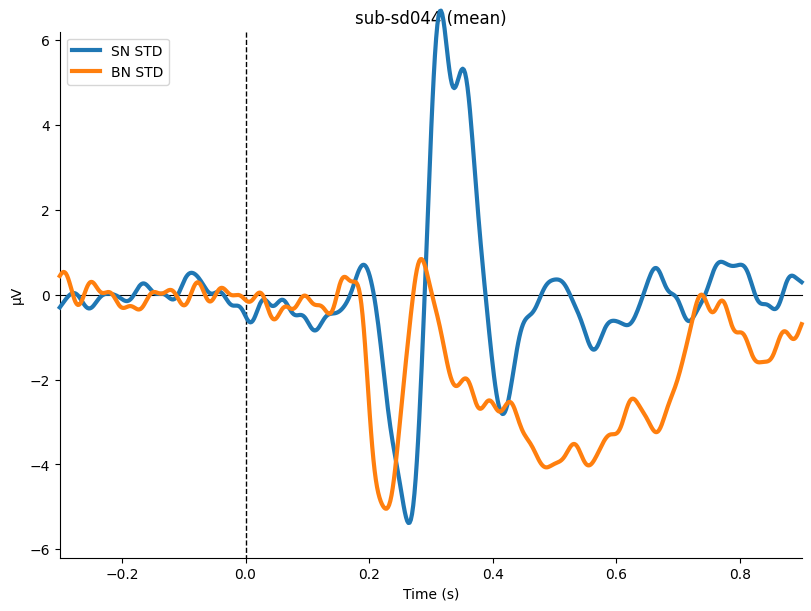

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd045-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2161 matching events found
No baseline correction applied
0 projection items activated
BN STD :  610 SN STD :  617
combining channels using "mean"
combining channels using "mean"


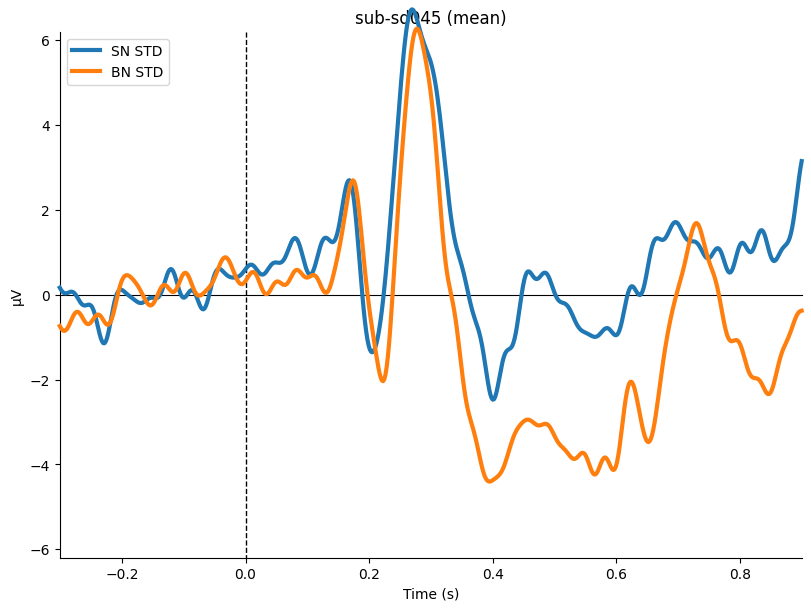

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd046-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1716 matching events found
No baseline correction applied
0 projection items activated
BN STD :  436 SN STD :  488
combining channels using "mean"
combining channels using "mean"


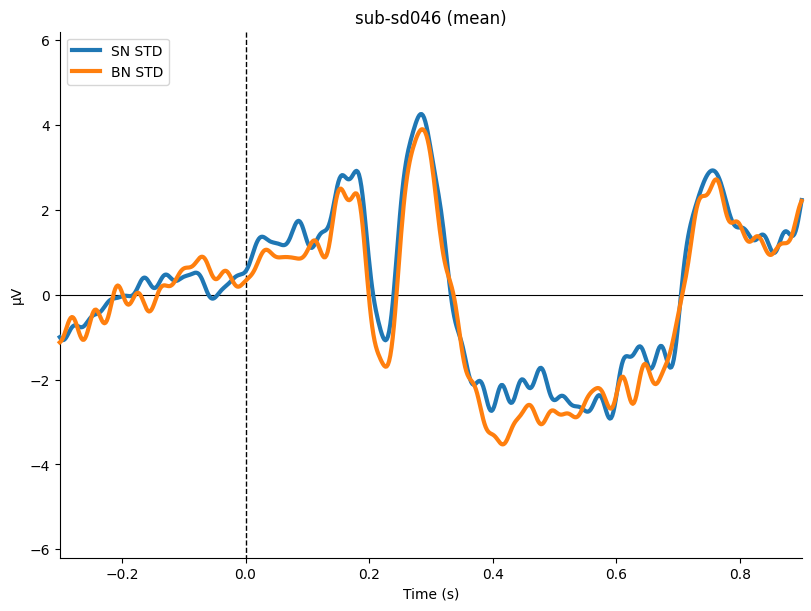

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd047-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1863 matching events found
No baseline correction applied
0 projection items activated
BN STD :  573 SN STD :  479
combining channels using "mean"
combining channels using "mean"


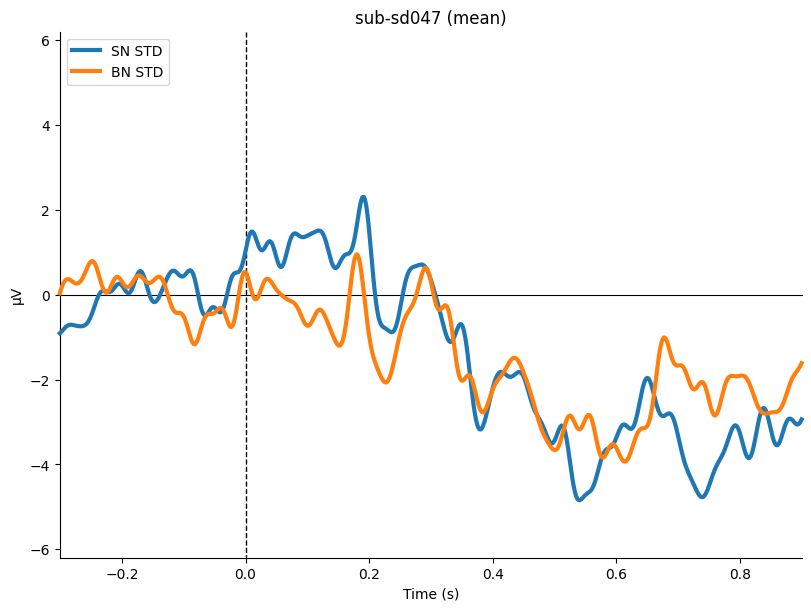

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd048-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2379 matching events found
No baseline correction applied
0 projection items activated
BN STD :  607 SN STD :  713
combining channels using "mean"
combining channels using "mean"


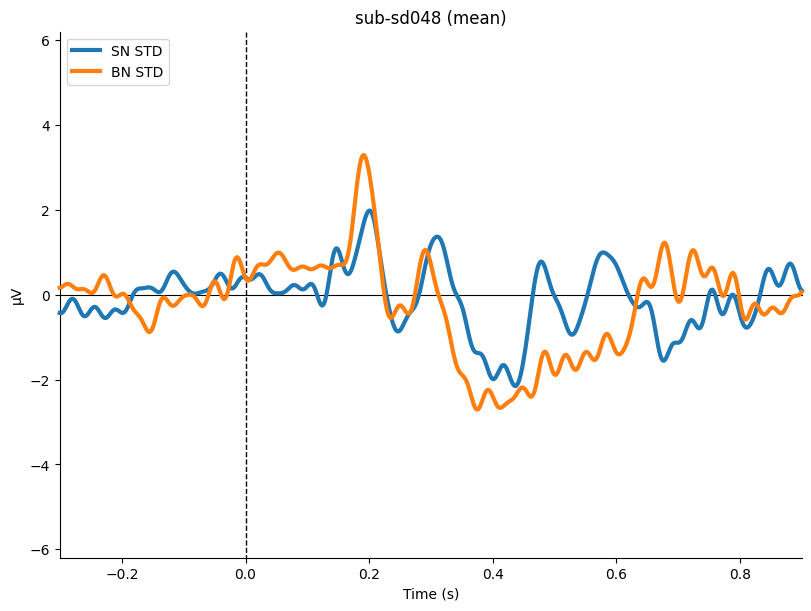

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd049-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2391 matching events found
No baseline correction applied
0 projection items activated
BN STD :  661 SN STD :  693
combining channels using "mean"
combining channels using "mean"


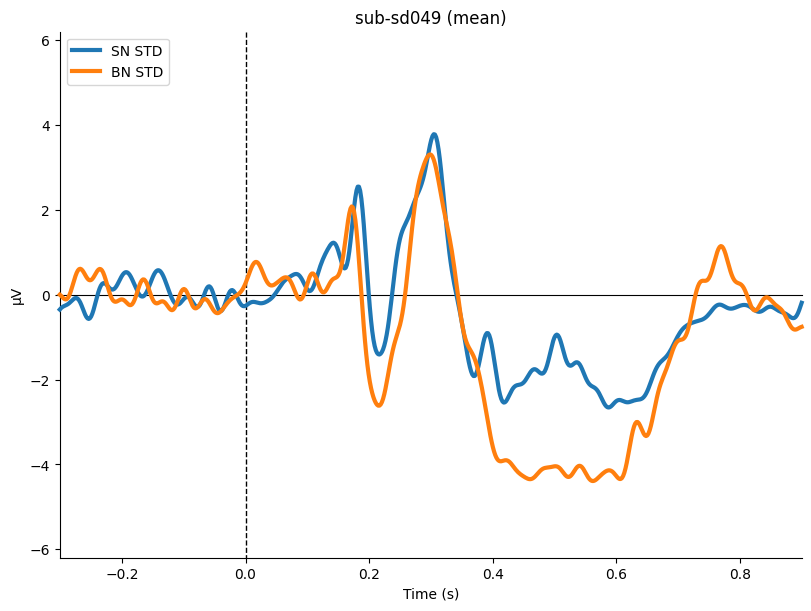

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd050-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2253 matching events found
No baseline correction applied
0 projection items activated
BN STD :  654 SN STD :  642
combining channels using "mean"
combining channels using "mean"


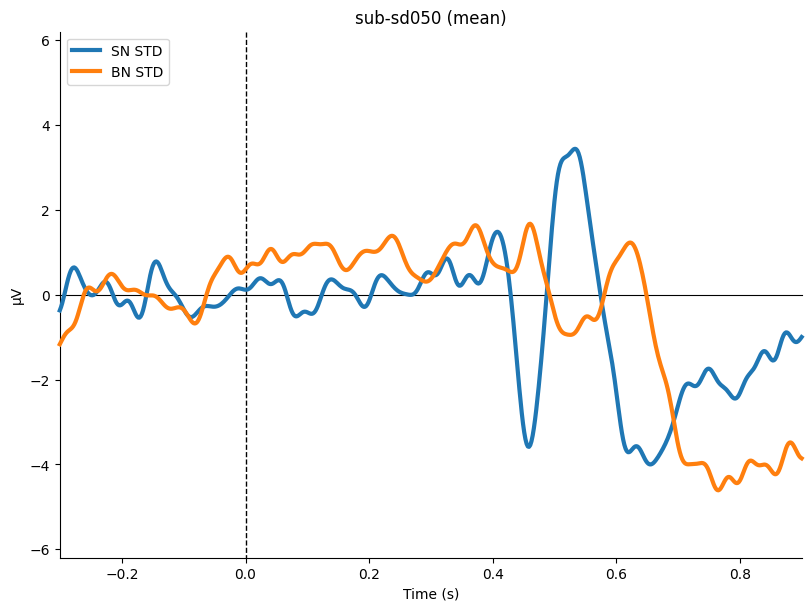

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd051-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1552 matching events found
No baseline correction applied
0 projection items activated
BN STD :  353 SN STD :  498
combining channels using "mean"
combining channels using "mean"


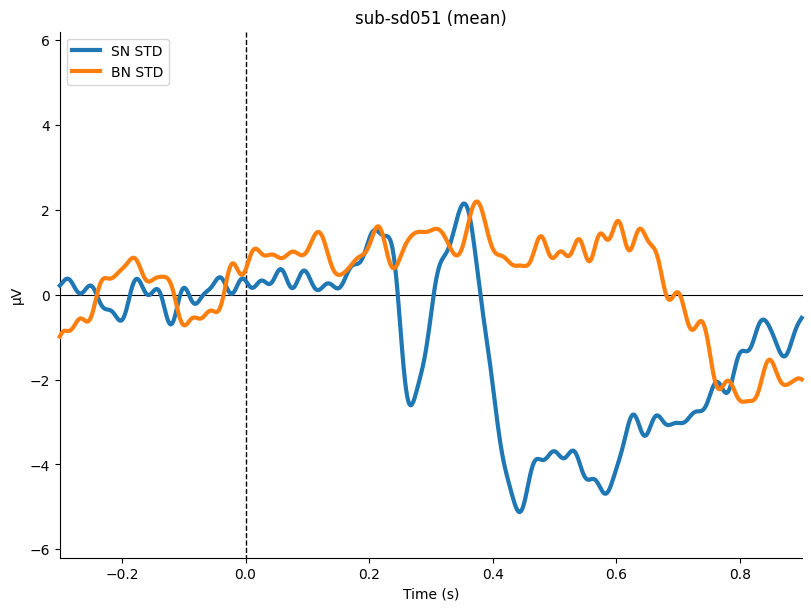

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd052-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1888 matching events found
No baseline correction applied
0 projection items activated
BN STD :  555 SN STD :  472
combining channels using "mean"
combining channels using "mean"


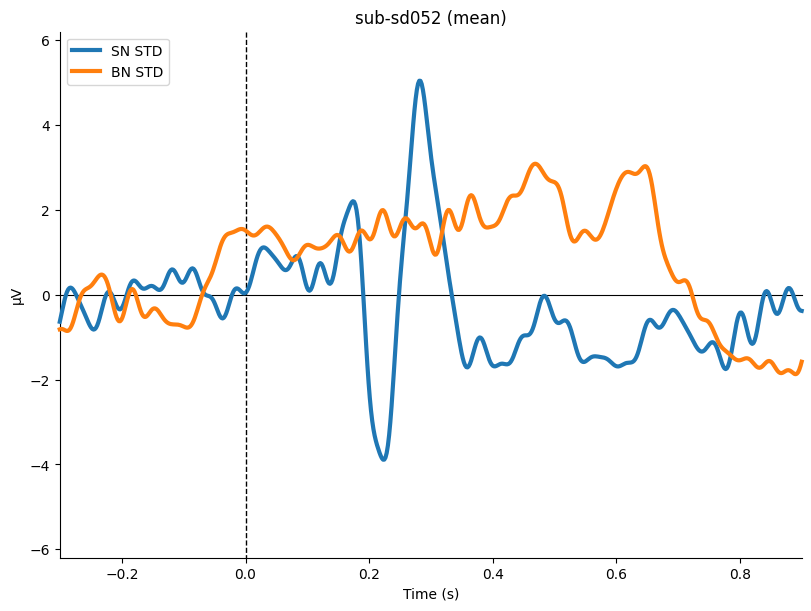

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd053-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2320 matching events found
No baseline correction applied
0 projection items activated
BN STD :  635 SN STD :  633
combining channels using "mean"
combining channels using "mean"


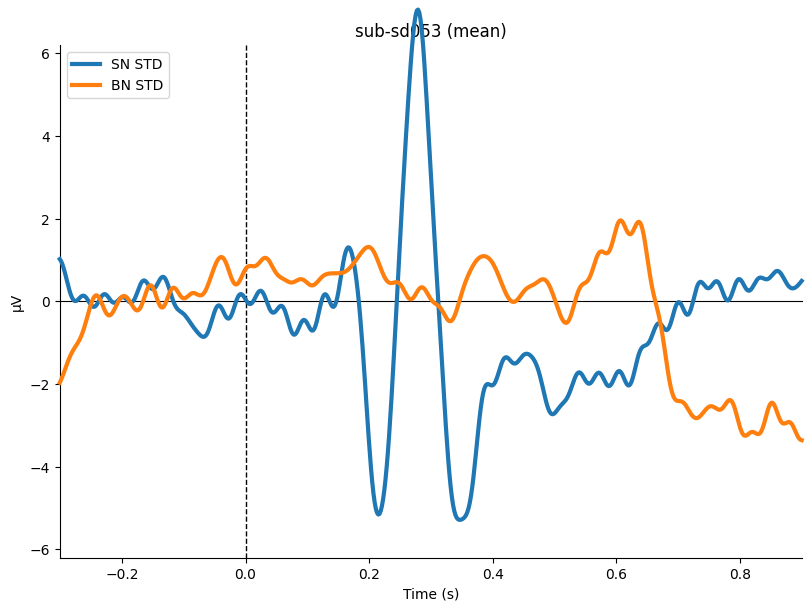

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd054-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1948 matching events found
No baseline correction applied
0 projection items activated
BN STD :  527 SN STD :  505
combining channels using "mean"
combining channels using "mean"


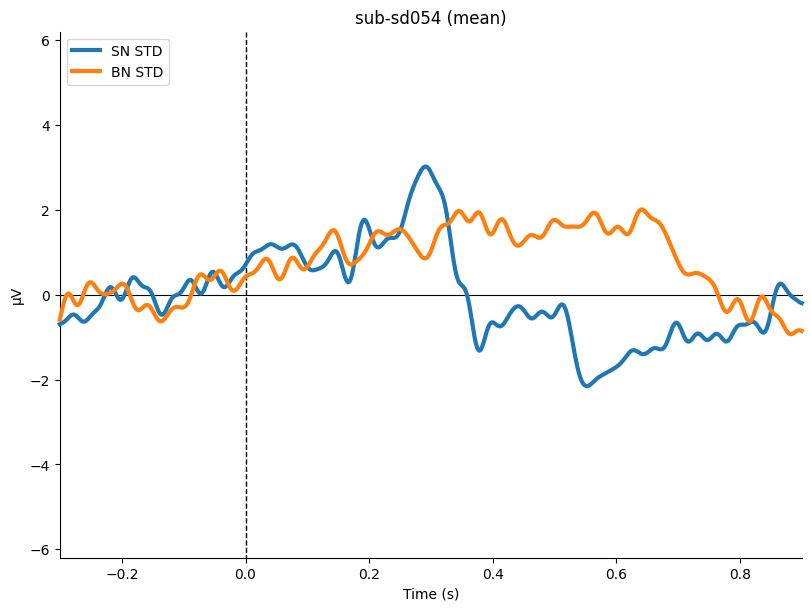

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd055-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1152 matching events found
No baseline correction applied
0 projection items activated
BN STD :  287 SN STD :  426
combining channels using "mean"
combining channels using "mean"


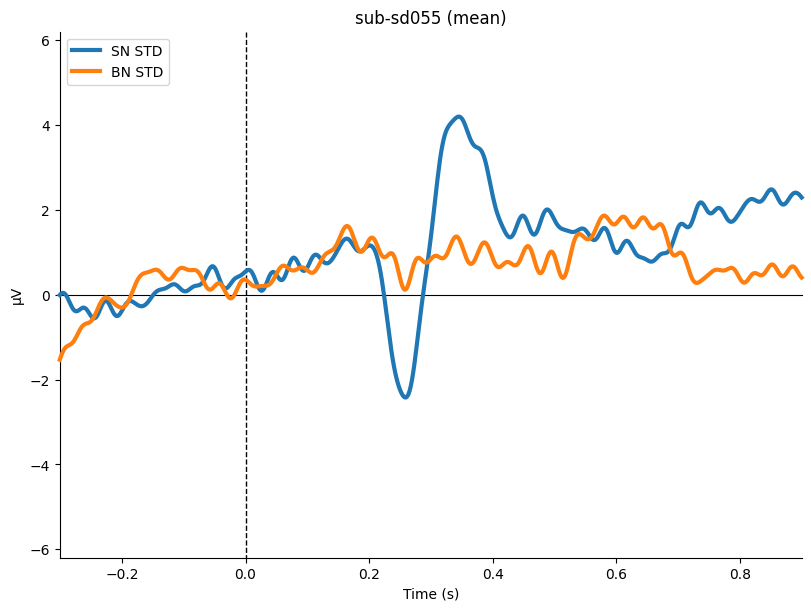

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd056-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1872 matching events found
No baseline correction applied
0 projection items activated
BN STD :  616 SN STD :  542
combining channels using "mean"
combining channels using "mean"


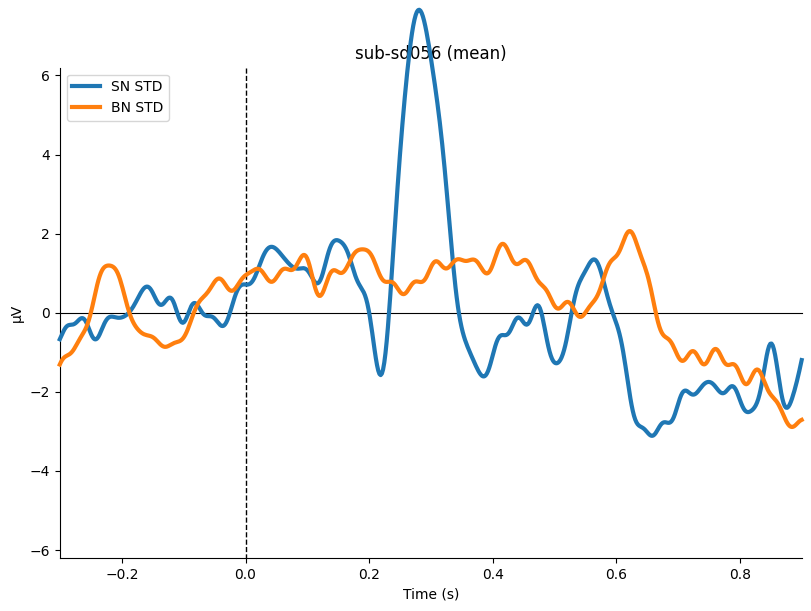

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd057-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1359 matching events found
No baseline correction applied
0 projection items activated
BN STD :  472 SN STD :  383
combining channels using "mean"
combining channels using "mean"


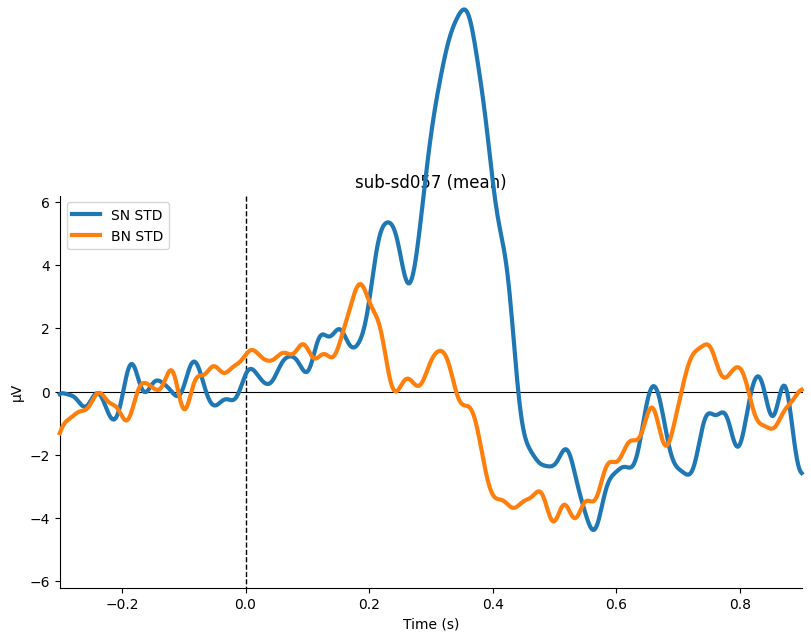

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd059-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2586 matching events found
No baseline correction applied
0 projection items activated
BN STD :  717 SN STD :  721
combining channels using "mean"
combining channels using "mean"


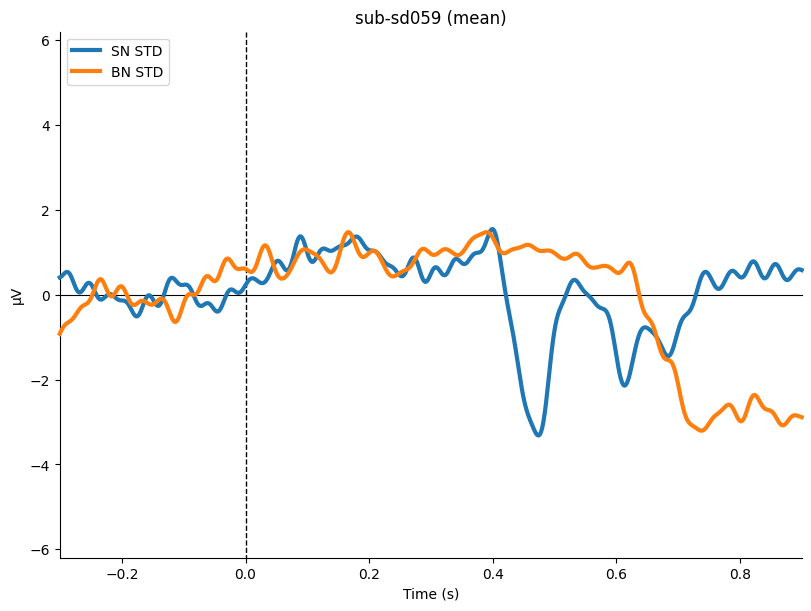

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd060-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2604 matching events found
No baseline correction applied
0 projection items activated
BN STD :  730 SN STD :  726
combining channels using "mean"
combining channels using "mean"


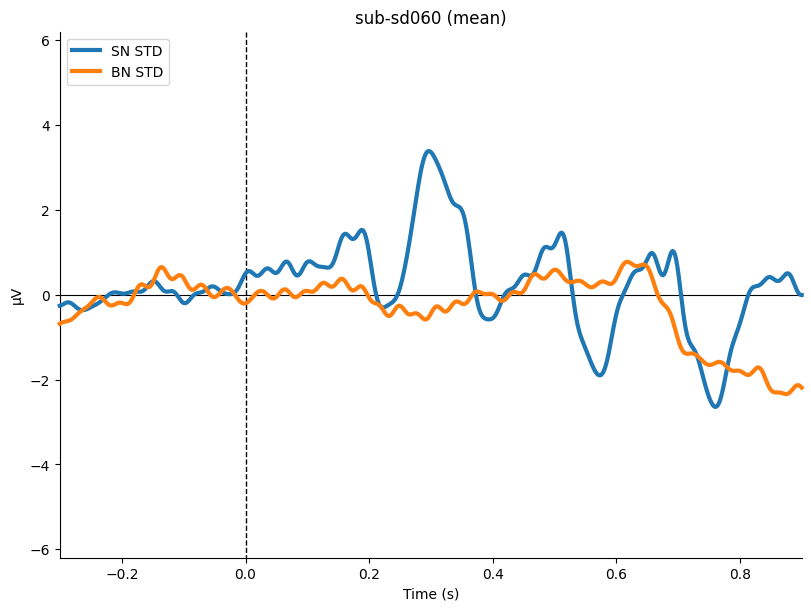

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd061-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2361 matching events found
No baseline correction applied
0 projection items activated
BN STD :  684 SN STD :  641
combining channels using "mean"
combining channels using "mean"


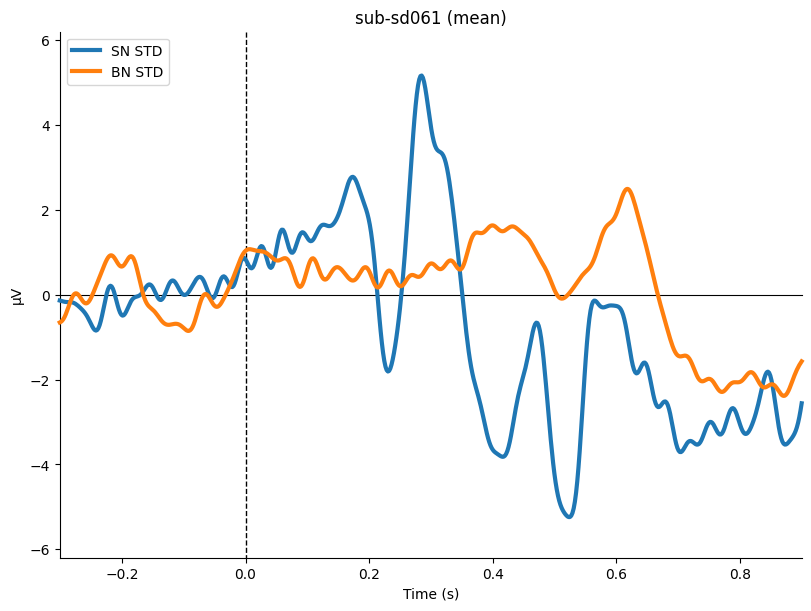

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd062-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2599 matching events found
No baseline correction applied
0 projection items activated
BN STD :  718 SN STD :  731
combining channels using "mean"
combining channels using "mean"


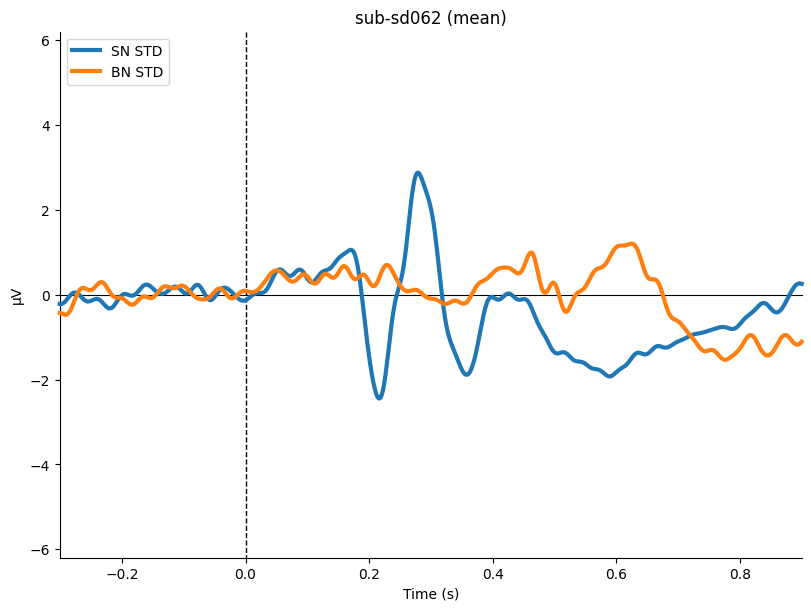

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd063-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2338 matching events found
No baseline correction applied
0 projection items activated
BN STD :  684 SN STD :  694
combining channels using "mean"
combining channels using "mean"


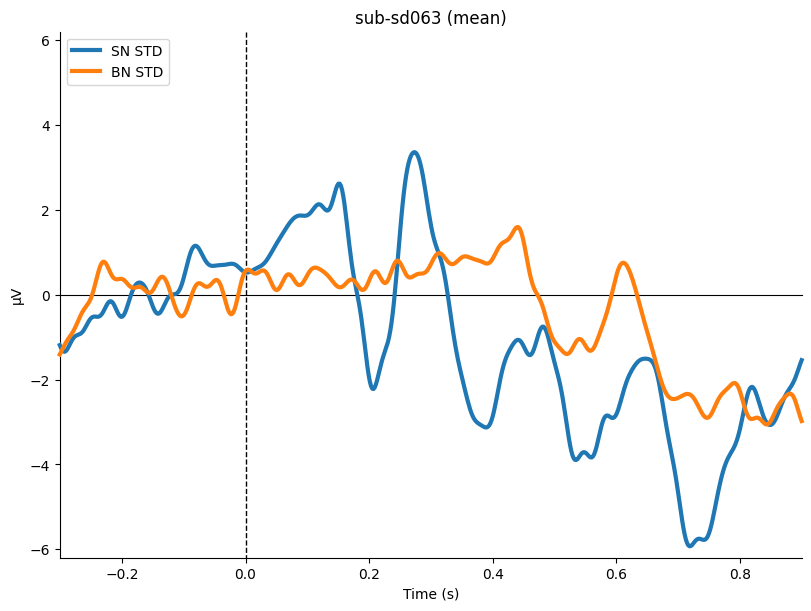

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd064-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2581 matching events found
No baseline correction applied
0 projection items activated
BN STD :  732 SN STD :  736
combining channels using "mean"
combining channels using "mean"


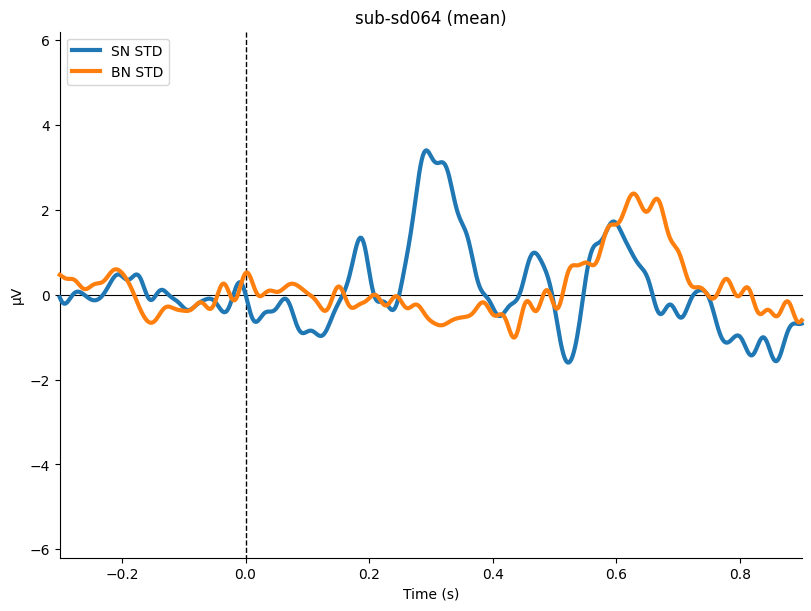

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd065-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2415 matching events found
No baseline correction applied
0 projection items activated
BN STD :  720 SN STD :  710
combining channels using "mean"
combining channels using "mean"


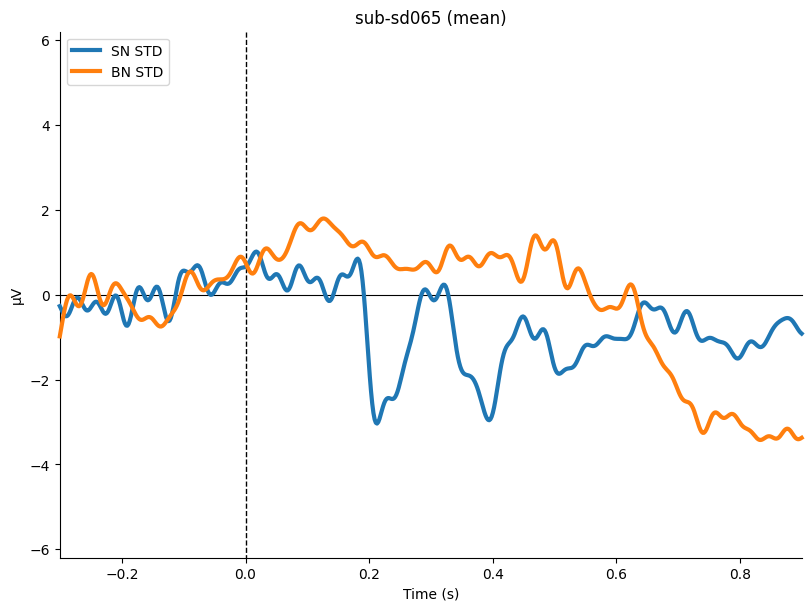

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd066-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2357 matching events found
No baseline correction applied
0 projection items activated
BN STD :  669 SN STD :  699
combining channels using "mean"
combining channels using "mean"


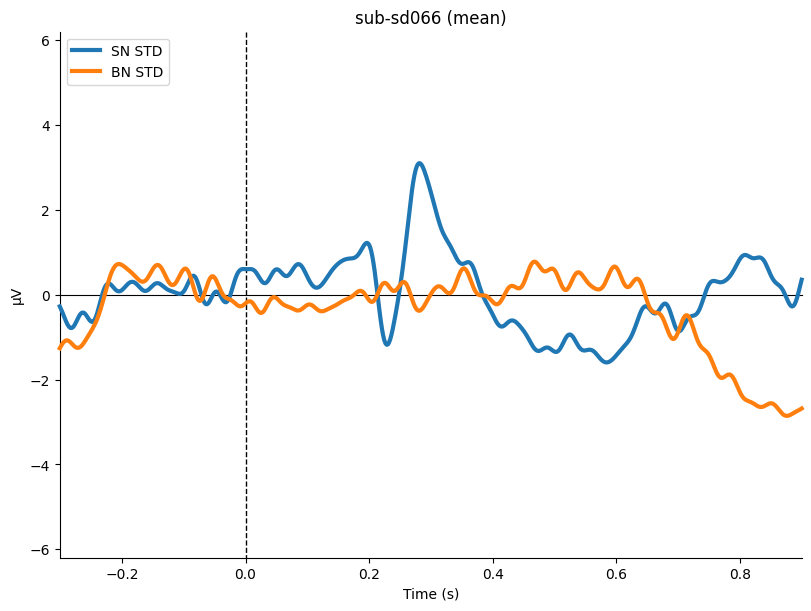

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd067-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
2236 matching events found
No baseline correction applied
0 projection items activated
BN STD :  623 SN STD :  581
combining channels using "mean"
combining channels using "mean"


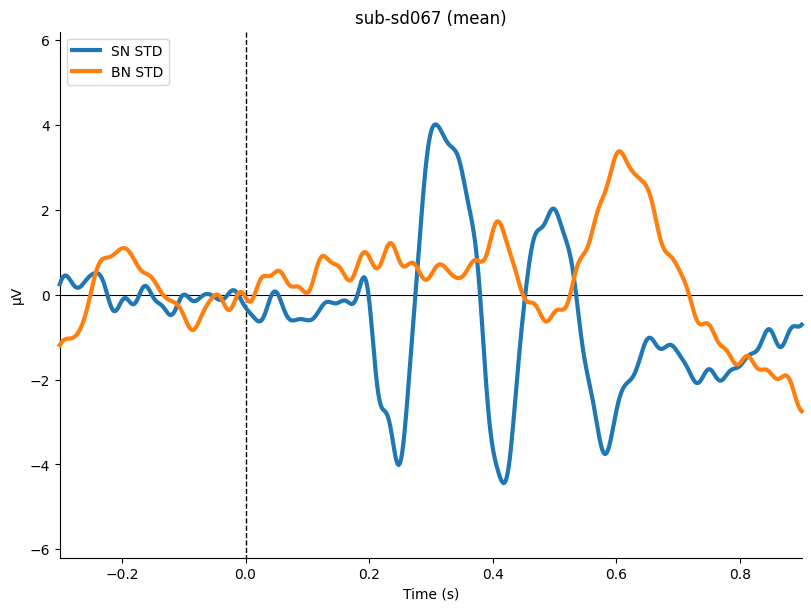

In [6]:

SN_devi_eps_evoked_dict  = {}
BN_std_eps_evoked_dict  = {}
BN_devi_eps_evoked_dict = {}
SN_std_eps_evoked_dict = {}


for sub in os.listdir(folder):
    epochs = mne.read_epochs(os.path.join(folder,sub), preload=True)
    print("BN STD : ", len(epochs['S14']),"SN STD : ", len(epochs['S24']) )
    SN_devi_eps = epochs['S15'].average()
    BN_std_eps = epochs['S14'].average()
    BN_devi_eps = epochs['S25'].average()
    SN_std_eps = epochs['S24'].average() 
    SN_devi_eps_evoked_dict[sub[:-8]] = SN_devi_eps
    BN_devi_eps_evoked_dict[sub[:-8]] = BN_devi_eps
    SN_std_eps_evoked_dict[sub[:-8]] = SN_std_eps
    BN_std_eps_evoked_dict[sub[:-8]] = BN_std_eps
    evokeds = { 
    "SN STD" : SN_std_eps ,
    'BN STD':BN_std_eps,
    # "CN MMN" : mne.combine_evoked([ CN_devi_eps,CN_sta_eps], weights=[1,-1]),
           }
    stylesdict ={"SN STD": {"linewidth": 3,"linestyle":'solid'},
             "BN STD" : {"linewidth": 3,"linestyle":'solid'},
            #  "CN MMN" : {"linewidth": 3,"linestyle":'solid'},
             }
    mne.viz.plot_compare_evokeds(evokeds,styles = stylesdict,
                             truncate_xaxis=False,truncate_yaxis=False,picks=['Cz','Fz', "FCz"],combine = 'mean',title= f'{ sub[:-8]}',
                             ylim = dict(eeg=[-6.2,6.2]))

In [7]:
len(os.listdir(folder))

54

In [8]:
sub[:-8]

'sub-sd067'

## N1 in both conditions:  11, 12,16 (check ) , 17, 18,19, 20 (check) , 21,24, 25, 26,29,30 ,31 (possible!) , 32, 33 ,35,34 (delayed), 35, 36 ,37, 38,39,40,41,42,44,  45, 46, 47 ,49 

In [9]:
N1_STD_peak_sub = [11, 12, 17, 18,19, 20, 21, 24, 25, 26, 29, 30 , 31, 32, 33 , 35,  35, 36 ,37, 38,39,40,41,42,44,  45, 46, 47 ,49]
len(N1_STD_peak_sub)


29

In [10]:
N1_STD_peak_SN_std_eps_evoked_dict  = {sub: key for sub,key in SN_std_eps_evoked_dict.items() if int(sub[-2:] ) in N1_STD_peak_sub }
    
N1_STD_peak_BN_std_eps_evoked_dict  = {sub: key for sub,key in BN_std_eps_evoked_dict.items() if int(sub[-2:] ) in N1_STD_peak_sub }

In [11]:
time_window = (145, 300)  # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

# 1. Peak latency analysis
Sn_peak_latn1, BN_peak_latn1, subjects = extract_mmn_latencies(  
    N1_STD_peak_SN_std_eps_evoked_dict ,N1_STD_peak_BN_std_eps_evoked_dict , time_window=time_window, 
    channels=channels, method='peak')

In [12]:
len(Sn_peak_latn1)


28

0 sub-sd011
combining channels using "mean"
combining channels using "mean"
1 sub-sd012
combining channels using "mean"
combining channels using "mean"
2 sub-sd017
combining channels using "mean"
combining channels using "mean"
3 sub-sd018
combining channels using "mean"
combining channels using "mean"
4 sub-sd019
combining channels using "mean"
combining channels using "mean"
5 sub-sd020
combining channels using "mean"
combining channels using "mean"
6 sub-sd021
combining channels using "mean"
combining channels using "mean"
7 sub-sd024
combining channels using "mean"
combining channels using "mean"
8 sub-sd025
combining channels using "mean"
combining channels using "mean"
9 sub-sd026
combining channels using "mean"
combining channels using "mean"
10 sub-sd029
combining channels using "mean"
combining channels using "mean"
11 sub-sd030
combining channels using "mean"
combining channels using "mean"
12 sub-sd031
combining channels using "mean"
combining channels using "mean"
13 sub-sd

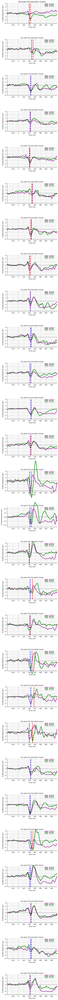

In [13]:
fig, axs = plt.subplots(28,1, figsize=( 6,100), dpi=100)
text_labels = [
    (0.90, "BN STD",'purple'),
    (0.83, f"SN STD",'green'),
] 
for i, sub in enumerate(N1_STD_peak_SN_std_eps_evoked_dict):
    print(i,sub)
    evokeds = { 
        "SN STD" : [N1_STD_peak_SN_std_eps_evoked_dict [sub] ],
        'BN STD':[N1_STD_peak_BN_std_eps_evoked_dict [sub]],
    # "CN MMN" : mne.combine_evoked([ CN_devi_eps,CN_sta_eps], weights=[1,-1]),
           }
    stylesdict ={"SN STD": {"linewidth": 3,"linestyle":'solid','color': 'green'},
             "BN STD" : {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
            #  "CN MMN" : {"linewidth": 3,"linestyle":'solid'},
             }
    
    #fig = evoked.plot(spatial_colors=True, show=False, titles=f"{sub}")
    plot_erps(evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs[i],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"(N1 peak STD ){sub}",time_range=(-.200,.70))
    if sub in Sn_peak_latn1:
        sn_latency_sec = Sn_peak_latn1[sub]   # convert ms → seconds
        bn_latency_sec = BN_peak_latn1[sub]
        axs[i].axvline(x=sn_latency_sec, color="red", linestyle="--", linewidth=3)
        axs[i].axvline(x=bn_latency_sec, color="blue", linestyle="--", linewidth=3)
    plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
plt.tight_layout()
plt.show()

## N1 Peak latency to align SN and BN 

In [14]:
BN_peak_latn1

{'sub-sd011': 197.265625,
 'sub-sd012': 240.234375,
 'sub-sd017': 222.65625,
 'sub-sd018': 220.703125,
 'sub-sd019': 201.171875,
 'sub-sd020': 246.09375,
 'sub-sd021': 234.375,
 'sub-sd024': 203.125,
 'sub-sd025': 216.796875,
 'sub-sd026': 222.65625,
 'sub-sd029': 226.5625,
 'sub-sd030': 228.515625,
 'sub-sd031': 230.46875,
 'sub-sd032': 208.984375,
 'sub-sd033': 212.890625,
 'sub-sd035': 201.171875,
 'sub-sd036': 214.84375,
 'sub-sd037': 210.9375,
 'sub-sd038': 216.796875,
 'sub-sd039': 226.5625,
 'sub-sd040': 199.21875,
 'sub-sd041': 224.609375,
 'sub-sd042': 214.84375,
 'sub-sd044': 232.421875,
 'sub-sd045': 220.703125,
 'sub-sd046': 230.46875,
 'sub-sd047': 222.65625,
 'sub-sd049': 212.890625}

In [15]:
Sn_peak_latn1, BN_peak_latn1
N1_STD_combined_result = {}
for subj in Sn_peak_latn1.keys():
    N1_STD_combined_result[subj] = {
        'beep': {'time': BN_peak_latn1[subj]/1000},
        'sn': {'time': Sn_peak_latn1[subj]/1000}
    }

N1_STD_combined_result

{'sub-sd011': {'beep': {'time': 0.197265625}, 'sn': {'time': 0.220703125}},
 'sub-sd012': {'beep': {'time': 0.240234375}, 'sn': {'time': 0.267578125}},
 'sub-sd017': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.2265625}},
 'sub-sd018': {'beep': {'time': 0.220703125}, 'sn': {'time': 0.212890625}},
 'sub-sd019': {'beep': {'time': 0.201171875}, 'sn': {'time': 0.2109375}},
 'sub-sd020': {'beep': {'time': 0.24609375}, 'sn': {'time': 0.2578125}},
 'sub-sd021': {'beep': {'time': 0.234375}, 'sn': {'time': 0.2265625}},
 'sub-sd024': {'beep': {'time': 0.203125}, 'sn': {'time': 0.220703125}},
 'sub-sd025': {'beep': {'time': 0.216796875}, 'sn': {'time': 0.220703125}},
 'sub-sd026': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.234375}},
 'sub-sd029': {'beep': {'time': 0.2265625}, 'sn': {'time': 0.208984375}},
 'sub-sd030': {'beep': {'time': 0.228515625}, 'sn': {'time': 0.232421875}},
 'sub-sd031': {'beep': {'time': 0.23046875}, 'sn': {'time': 0.216796875}},
 'sub-sd032': {'beep': {'time': 0.2

In [68]:
N1_STD_combined_result.keys()

dict_keys(['sub-sd011', 'sub-sd012', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd020', 'sub-sd021', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd039', 'sub-sd040', 'sub-sd041', 'sub-sd042', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd049'])

In [16]:

# Step 1: Align evoked data to threshold times
beep_N1_aligned_STD = align_and_standardize_evokeds(
    N1_STD_peak_BN_std_eps_evoked_dict, 
    N1_STD_combined_result, 
    condition_key='beep'
)

sn_N1_aligned_STD = align_and_standardize_evokeds(
    N1_STD_peak_SN_std_eps_evoked_dict, 
    N1_STD_combined_result, 
    condition_key='sn'
)

beep_N1_aligned_devi = align_and_standardize_evokeds(
    BN_devi_eps_evoked_dict, 
    N1_STD_combined_result, 
    condition_key='beep'
)

sn_N1_aligned_devi = align_and_standardize_evokeds(
    SN_devi_eps_evoked_dict, 
    N1_STD_combined_result, 
    condition_key='sn'
)

Successfully aligned 28 subjects: ['sub-sd032', 'sub-sd011', 'sub-sd037', 'sub-sd025', 'sub-sd041', 'sub-sd036', 'sub-sd026', 'sub-sd047', 'sub-sd029', 'sub-sd038', 'sub-sd024', 'sub-sd012', 'sub-sd030', 'sub-sd020', 'sub-sd031', 'sub-sd021', 'sub-sd033', 'sub-sd044', 'sub-sd046', 'sub-sd045', 'sub-sd049', 'sub-sd017', 'sub-sd018', 'sub-sd035', 'sub-sd019', 'sub-sd039', 'sub-sd040', 'sub-sd042']
Successfully aligned 28 subjects: ['sub-sd032', 'sub-sd011', 'sub-sd037', 'sub-sd025', 'sub-sd041', 'sub-sd036', 'sub-sd026', 'sub-sd047', 'sub-sd029', 'sub-sd038', 'sub-sd024', 'sub-sd012', 'sub-sd030', 'sub-sd020', 'sub-sd031', 'sub-sd021', 'sub-sd033', 'sub-sd044', 'sub-sd046', 'sub-sd045', 'sub-sd049', 'sub-sd017', 'sub-sd018', 'sub-sd035', 'sub-sd019', 'sub-sd039', 'sub-sd040', 'sub-sd042']
Successfully aligned 28 subjects: ['sub-sd032', 'sub-sd011', 'sub-sd037', 'sub-sd025', 'sub-sd041', 'sub-sd036', 'sub-sd026', 'sub-sd047', 'sub-sd029', 'sub-sd038', 'sub-sd024', 'sub-sd012', 'sub-sd030'

### MMN P1 peak align

combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:40: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


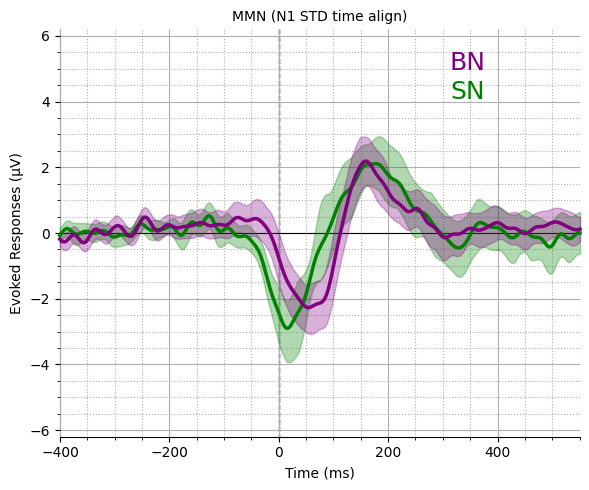

In [17]:
sn_STD_N1_aligned_SN_MMN_evokeds_dict = {sub1:mne.combine_evoked([sn_N1_aligned_devi[sub1], sn_N1_aligned_STD[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(sn_N1_aligned_devi,sn_N1_aligned_STD)}  
beep_STD_N1_aligned_BN_MMN_evokeds_dict = {sub1:mne.combine_evoked([beep_N1_aligned_devi[sub1], beep_N1_aligned_STD[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(beep_N1_aligned_devi ,beep_N1_aligned_STD)} 



time_range=(-.200,.350)  
MMN_evokeds = {
           'PN': sn_STD_N1_aligned_SN_MMN_evokeds_dict.values() ,
           'BN':beep_STD_N1_aligned_BN_MMN_evokeds_dict.values()  ,
                      }

stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN (N1 STD time align)",time_range=(-.400,.550))
plt.tight_layout()
plt.show()


### Statstics : amplitude 

In [18]:
def df_convert(case1_amps, case2_amps, label=("Case1", "Case2"), title='', df_type = "Amplitude"):
    n_subjects, n_channels = case1_amps.shape
    data = pd.DataFrame({
        df_type: np.concatenate([case1_amps.flatten(), case2_amps.flatten()]),
        'Case': np.repeat([label[0], label[1]], n_subjects * n_channels),

    })
    
    return data

 Mean  Amplitude : t_stat [-0.63098342] with , p_value [0.53335682]
 Peak Amplitude : t_stat -0.8294292636373546 with , p_value 0.41413476671812544


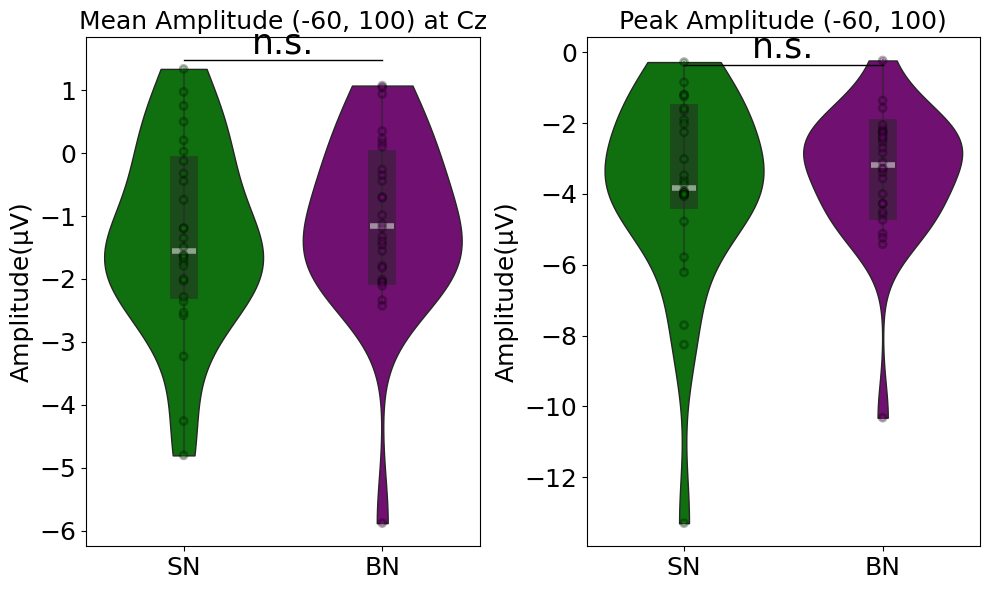

In [19]:
from scipy import stats
import seaborn as sns
df_type = "Amplitude"
label=("SN", "BN")
time_window = (-60,100)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels


# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mean_amplitudes(
    sn_STD_N1_aligned_SN_MMN_evokeds_dict ,beep_STD_N1_aligned_BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)



#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df = df_convert(PN_amps*1e+6, BN_amps*1e+6,label=("SN", "BN") ,df_type = df_type)
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)

sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(PN_amps, BN_amps)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])
 
PN_amps_peak = np.array(list(extract_peak_amplitude(sn_STD_N1_aligned_SN_MMN_evokeds_dict,time_window = (-.060, .100),channels=["Cz"]).values()))*1e+6
BN_amps_peak =np.array(list(extract_peak_amplitude(beep_STD_N1_aligned_BN_MMN_evokeds_dict ,time_window = (-.060, .100),channels=["Cz"]).values()))*1e+6


# Fraction area plot 
df=df_convert(PN_amps_peak.reshape(-1, 1), BN_amps_peak.reshape(-1, 1),label=("SN", "BN") ,df_type = df_type)

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_rel(PN_amps_peak, BN_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '*' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### Statstics : Latency

Peak latency ;- t_stat [-2.26094791] with , p_value [0.03203008]
Fractional area (50 %) latency ;- t_stat [-3.33678328] with , p_value [0.00153906]


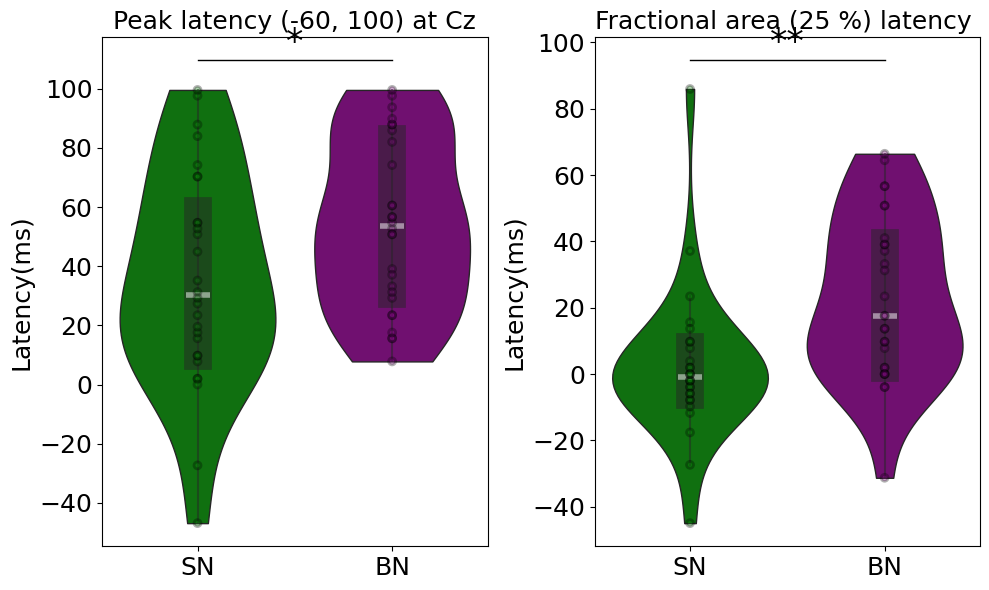

In [20]:
# Extract Latency
df_type = "Latency"
label=("SN", "BN")
time_window = (-60, 100)  # ms - typical MMN window
channels =["Cz"]
# Set up the plot
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
     sn_STD_N1_aligned_SN_MMN_evokeds_dict ,beep_STD_N1_aligned_BN_MMN_evokeds_dict , time_window=time_window, 
    channels=channels, method='peak')
df = df_convert(np.array(list(peak_lat1.values())).reshape(-1,1), np.array(list(peak_lat2.values()) ).reshape(-1,1),label=("SN", "BN"),df_type = df_type)


df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(np.array(list(peak_lat1.values())).reshape(-1,1), np.array(list(peak_lat2.values()) ).reshape(-1,1))
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


area_lat1, area_lat2, subjects = extract_mmn_latencies(
    sn_STD_N1_aligned_SN_MMN_evokeds_dict ,beep_STD_N1_aligned_BN_MMN_evokeds_dict , time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.25)

# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df = df_convert(np.array(list(area_lat1.values())).reshape(-1,1), np.array(list(area_lat2.values()) ).reshape(-1,1),label=("SN", "BN"),df_type = df_type)
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind( np.array(list(area_lat1.values())).reshape(-1,1), np.array(list(area_lat2.values()) ).reshape(-1,1))
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label =  '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (25 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"


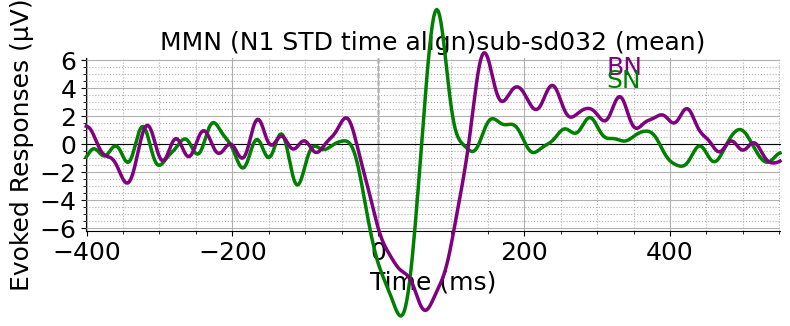

combining channels using "mean"
combining channels using "mean"


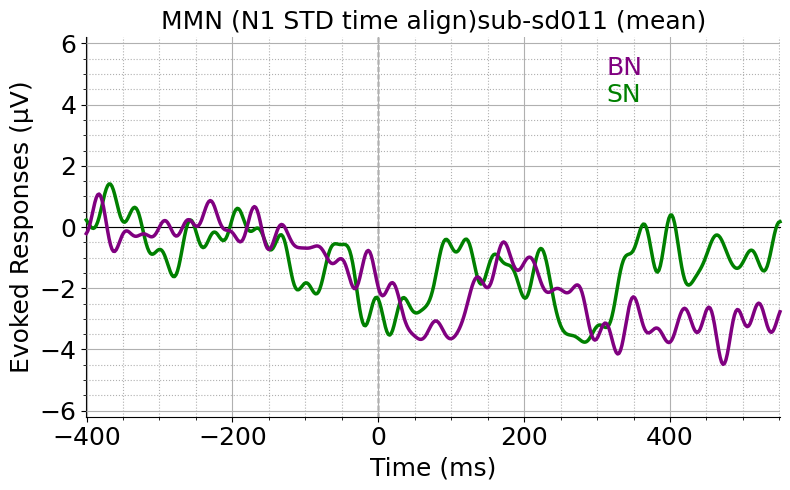

combining channels using "mean"
combining channels using "mean"


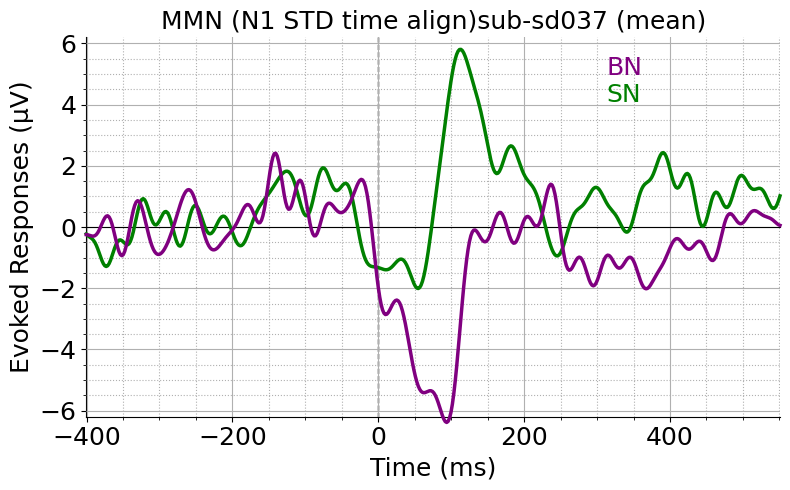

combining channels using "mean"
combining channels using "mean"


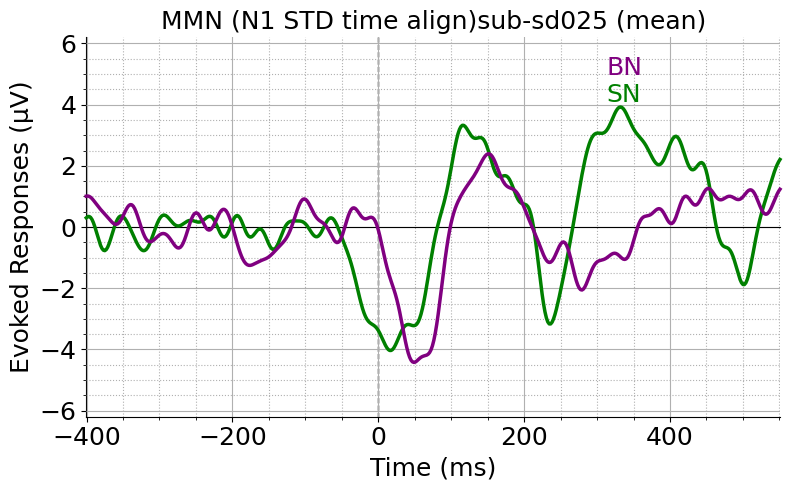

combining channels using "mean"
combining channels using "mean"


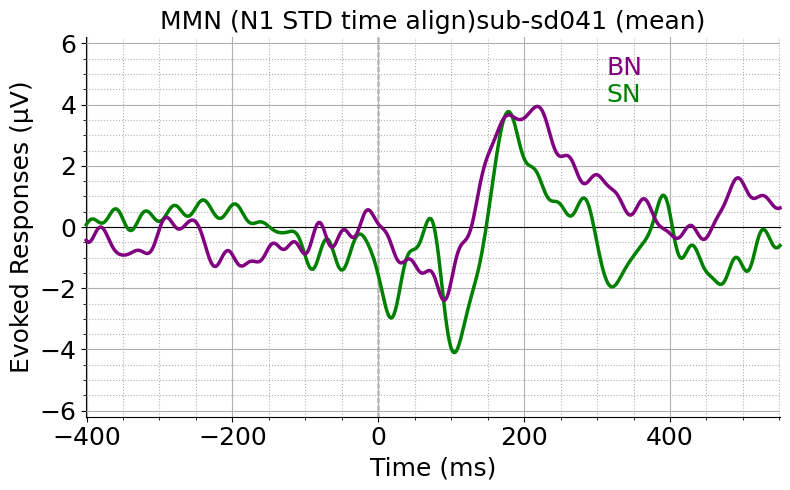

combining channels using "mean"
combining channels using "mean"


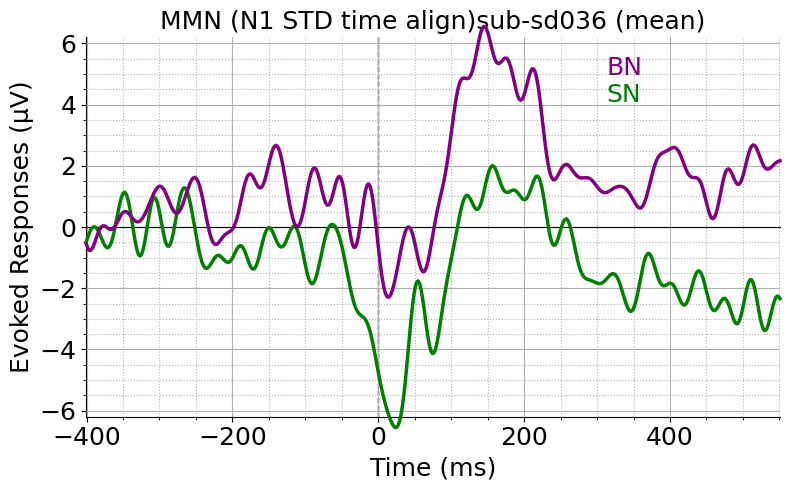

combining channels using "mean"
combining channels using "mean"


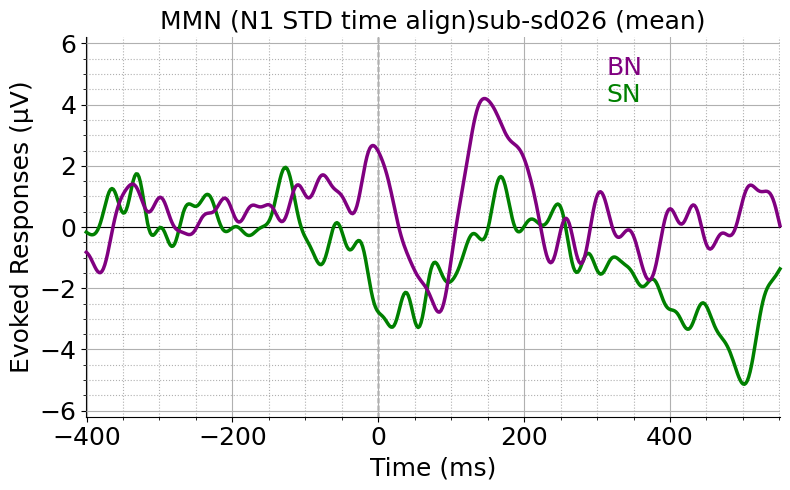

combining channels using "mean"
combining channels using "mean"


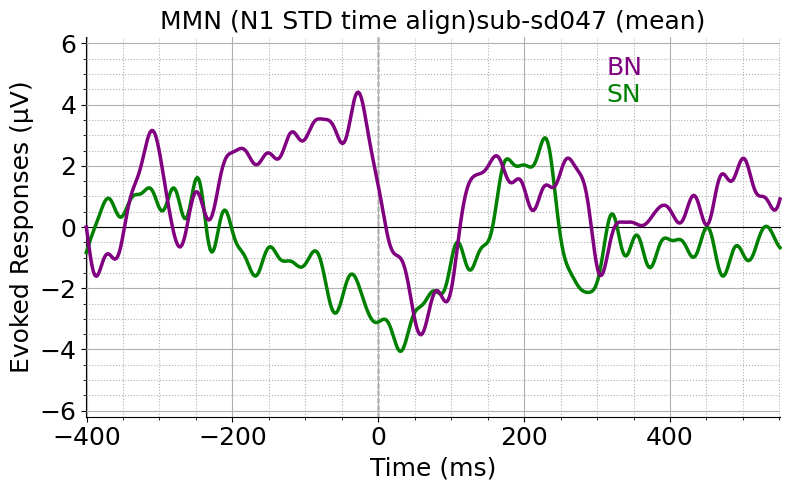

combining channels using "mean"
combining channels using "mean"


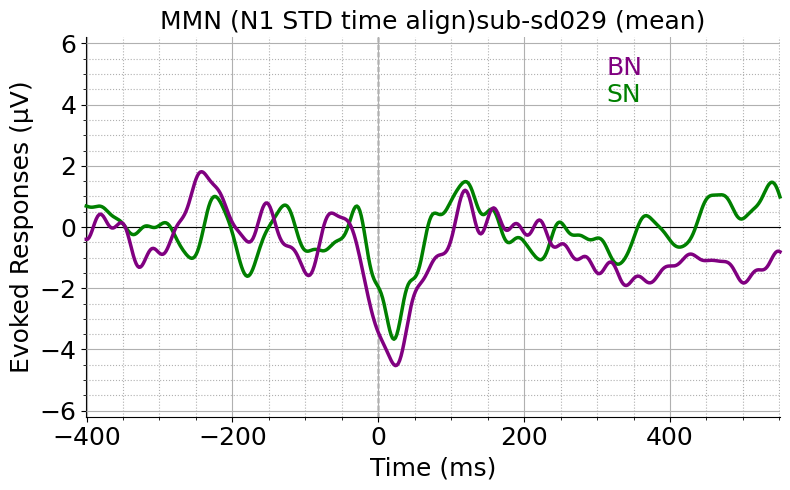

combining channels using "mean"
combining channels using "mean"


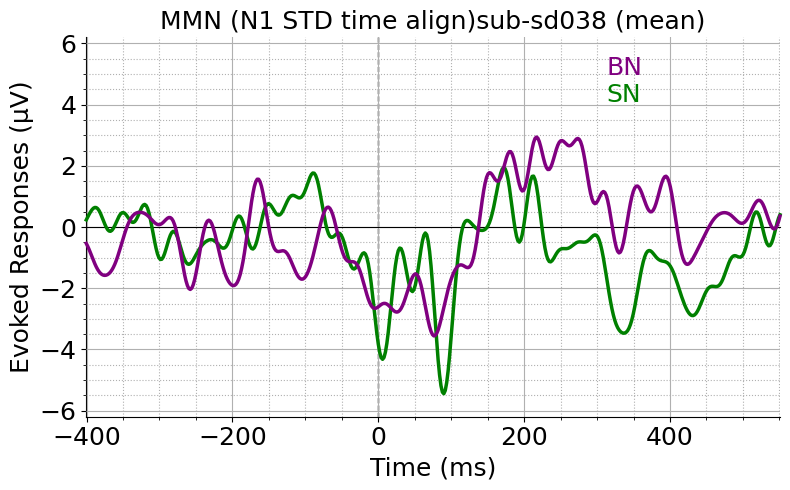

combining channels using "mean"
combining channels using "mean"


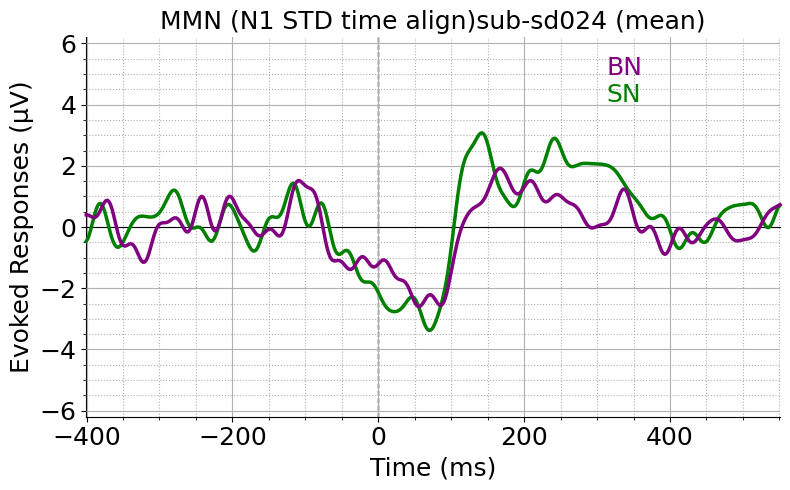

combining channels using "mean"
combining channels using "mean"


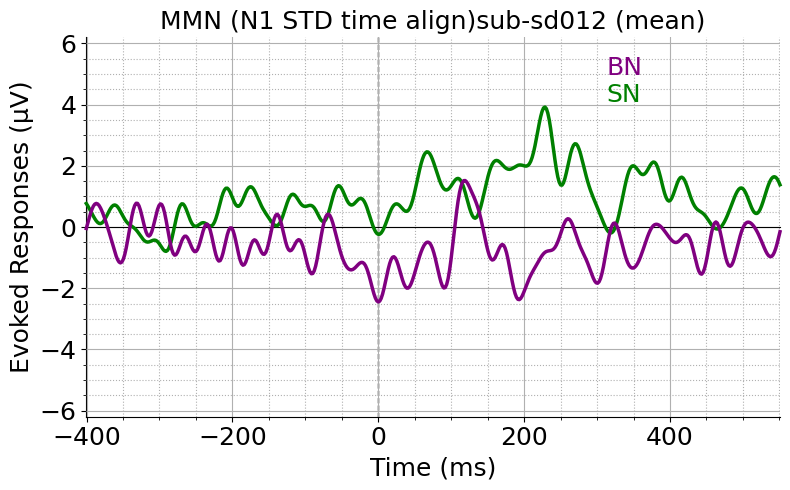

combining channels using "mean"
combining channels using "mean"


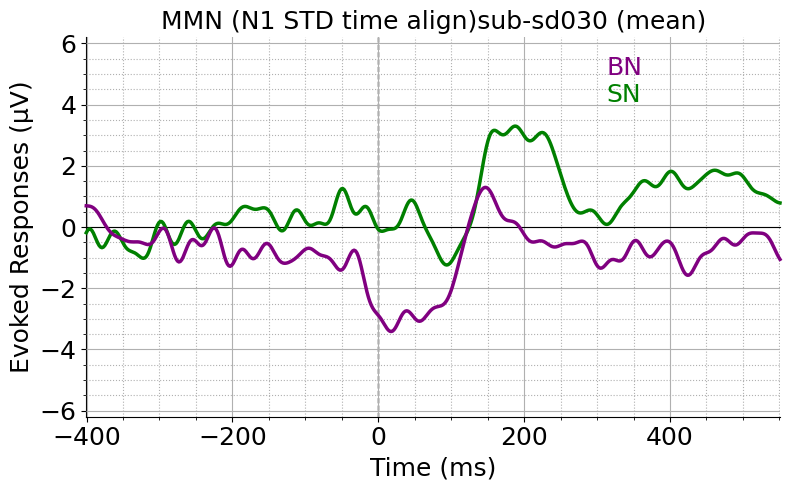

combining channels using "mean"
combining channels using "mean"


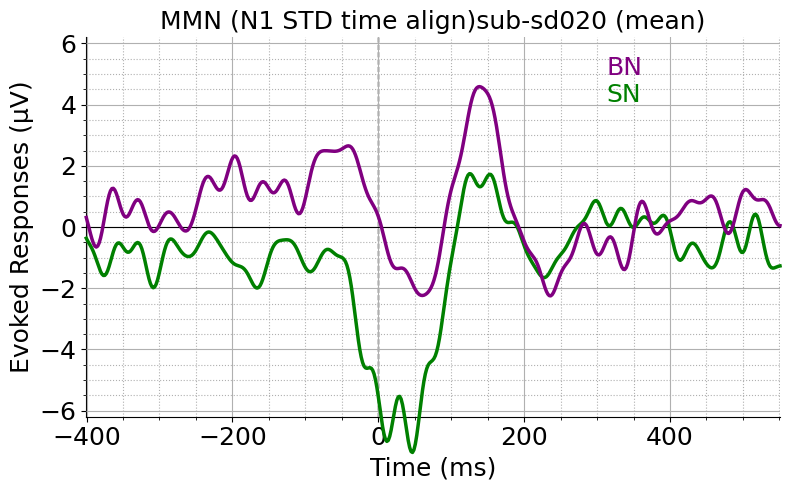

combining channels using "mean"
combining channels using "mean"


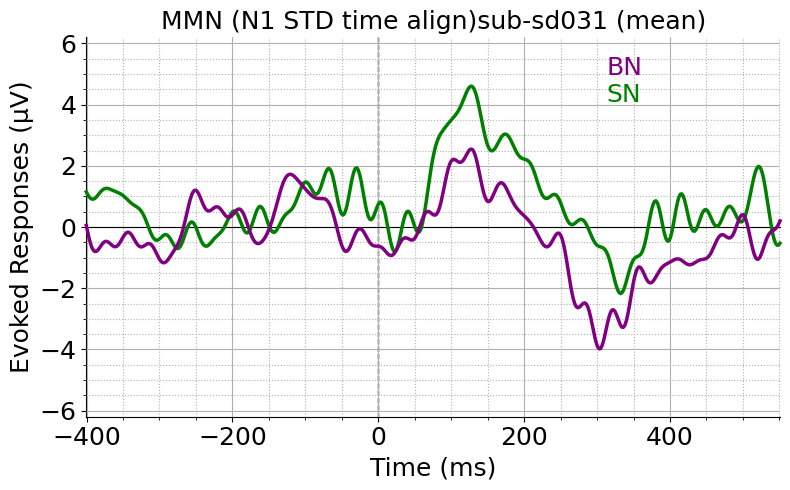

combining channels using "mean"
combining channels using "mean"


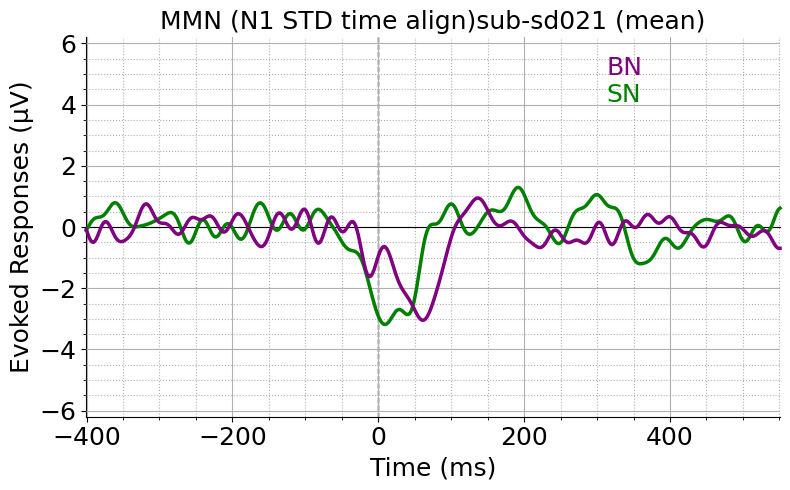

combining channels using "mean"
combining channels using "mean"


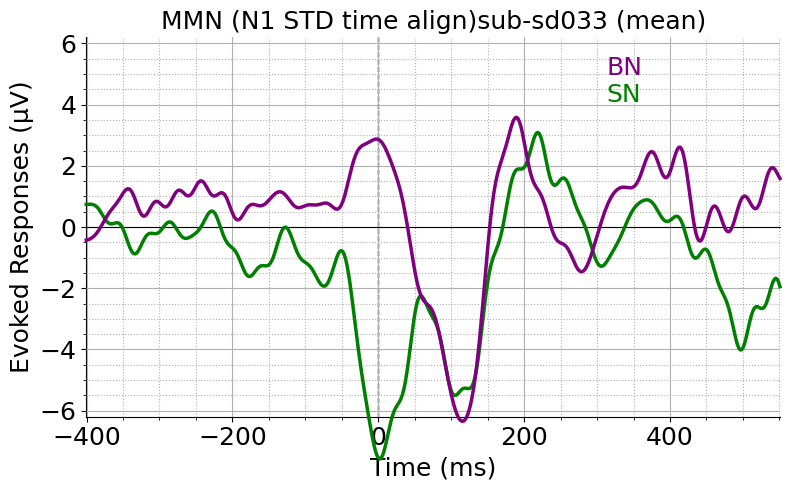

combining channels using "mean"
combining channels using "mean"


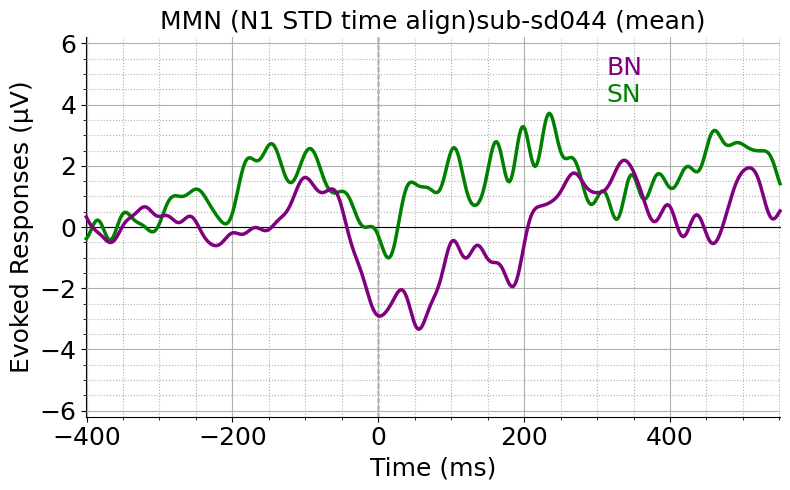

combining channels using "mean"
combining channels using "mean"


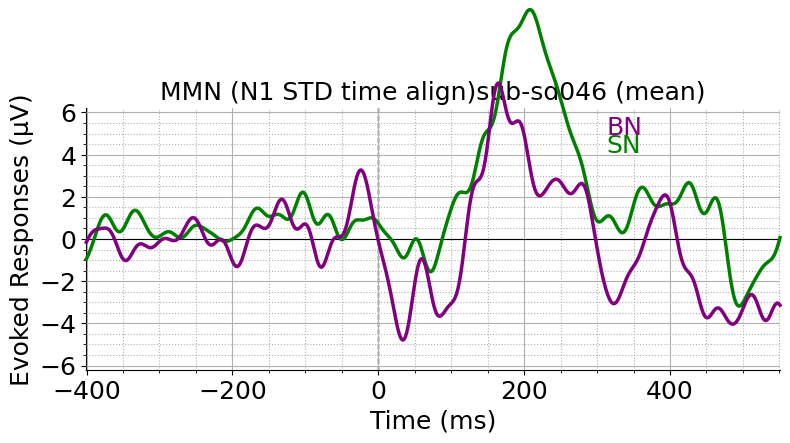

combining channels using "mean"
combining channels using "mean"


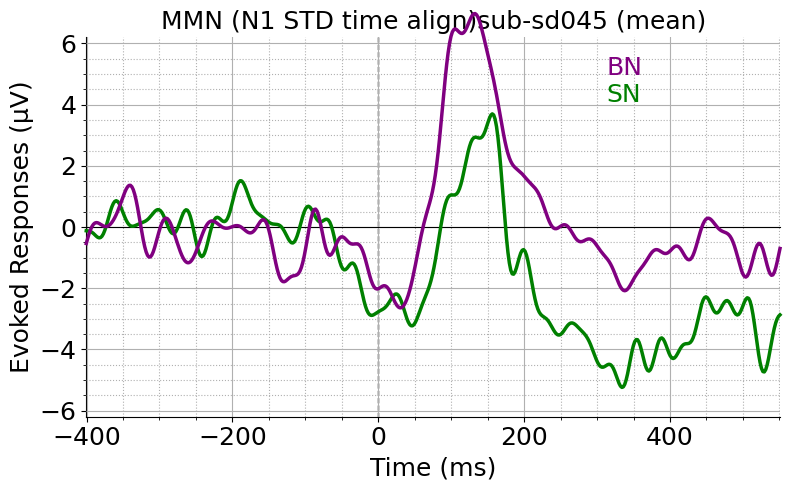

combining channels using "mean"
combining channels using "mean"


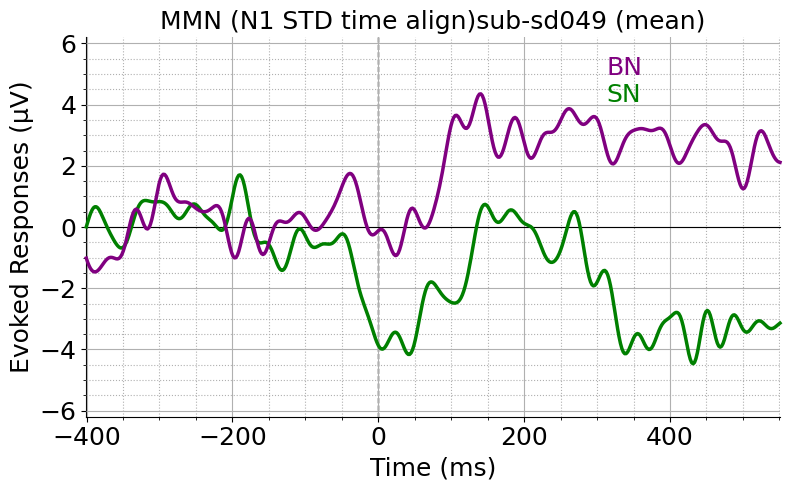

combining channels using "mean"
combining channels using "mean"


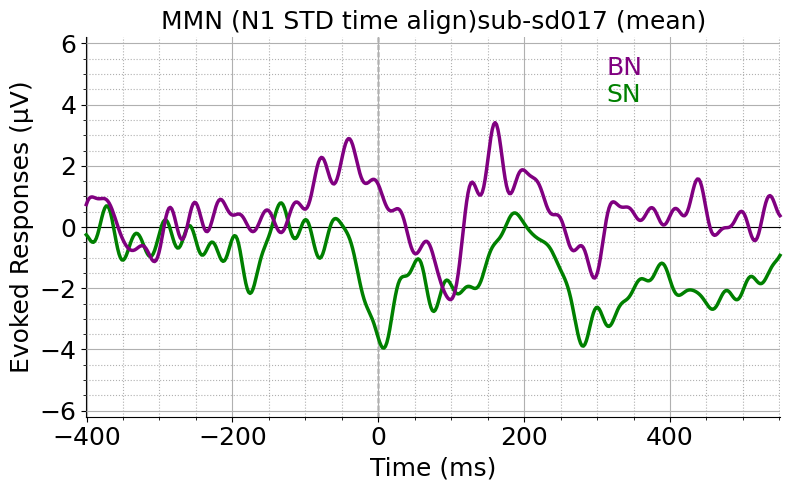

combining channels using "mean"
combining channels using "mean"


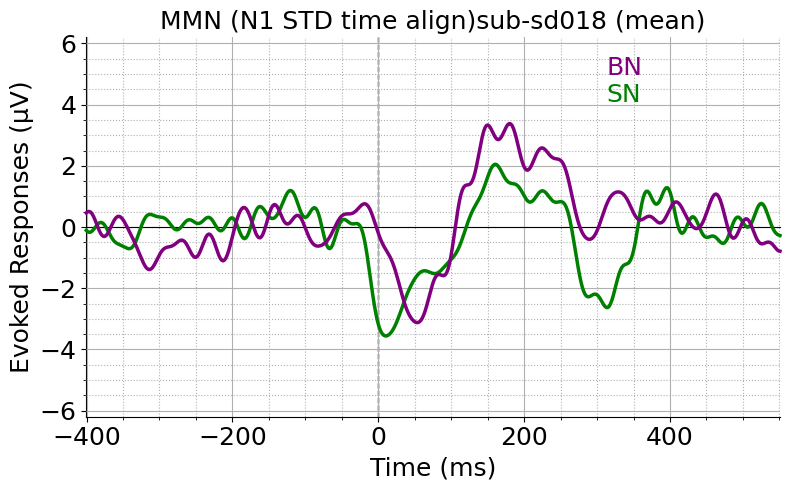

combining channels using "mean"
combining channels using "mean"


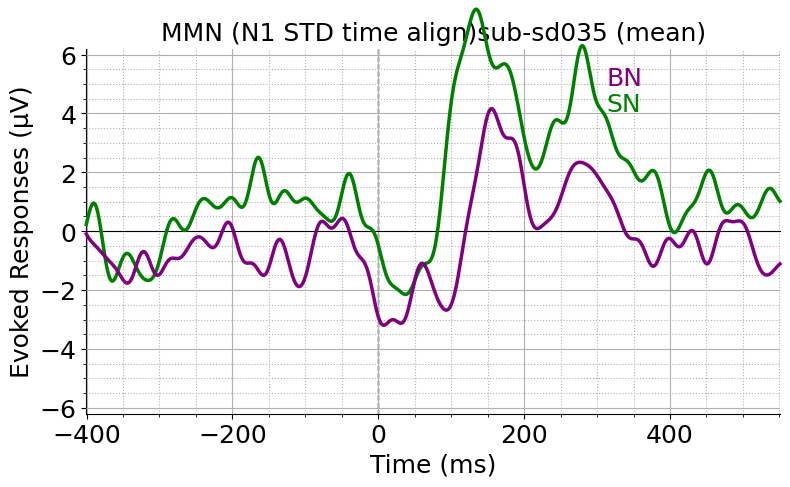

combining channels using "mean"
combining channels using "mean"


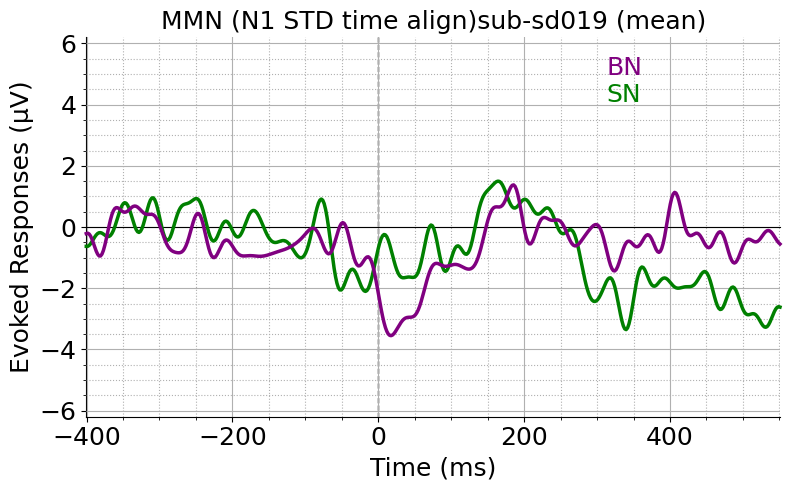

combining channels using "mean"
combining channels using "mean"


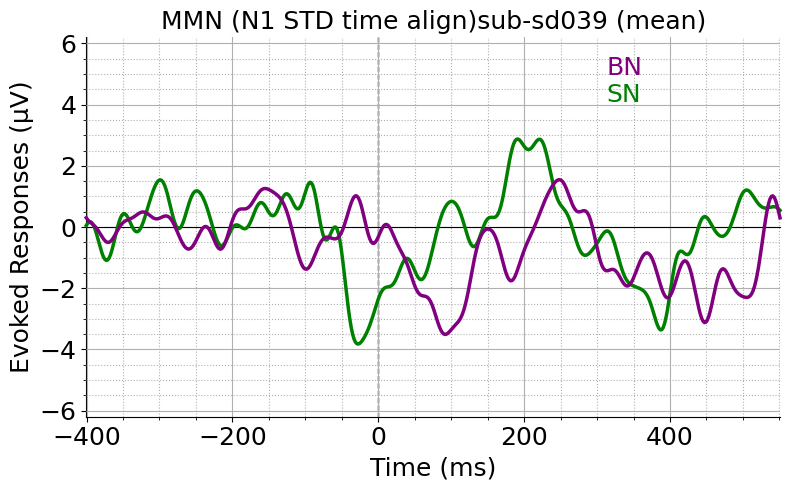

combining channels using "mean"
combining channels using "mean"


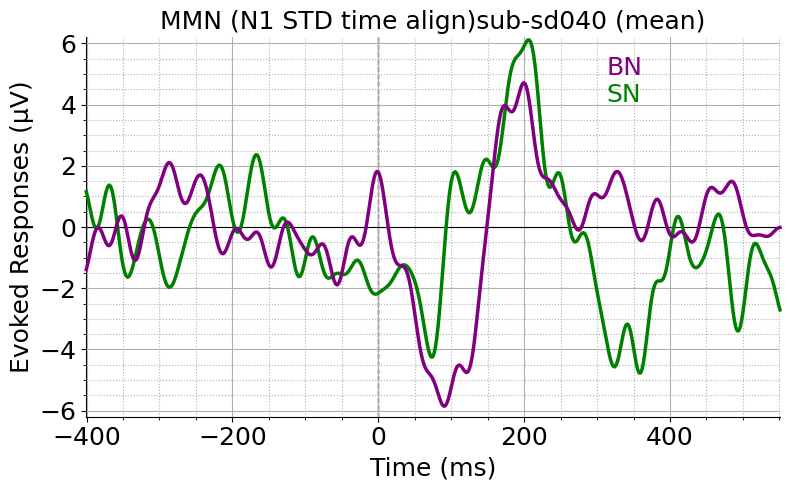

combining channels using "mean"
combining channels using "mean"


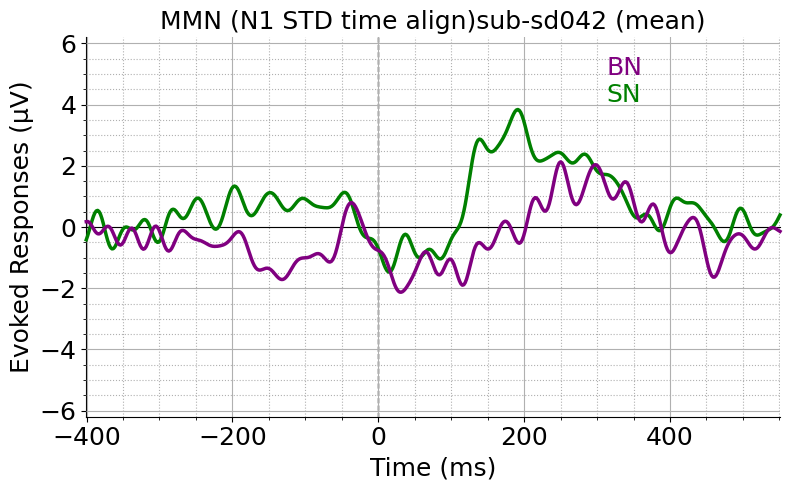

In [21]:
for sub in sn_STD_N1_aligned_SN_MMN_evokeds_dict:
    MMN_evokeds = {
           'PN': [sn_STD_N1_aligned_SN_MMN_evokeds_dict[sub] ],
           'BN':[beep_STD_N1_aligned_BN_MMN_evokeds_dict[sub]]  ,
                      }
    stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
    text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ] 
    fig, axs = plt.subplots(figsize=(8, 5), dpi=100)
    plot_erps(MMN_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align){sub}",time_range=(-.400,.550))
    plt.show()


combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:40: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


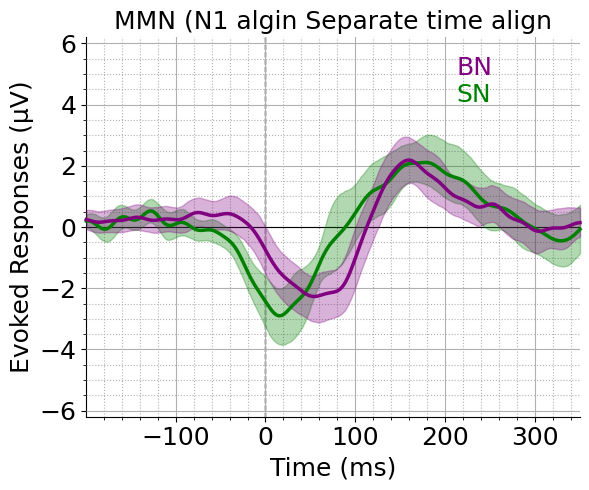

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


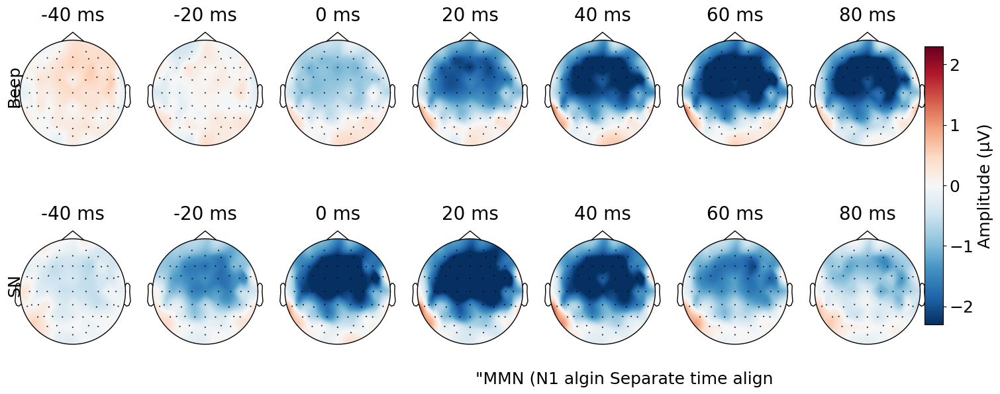

In [22]:
import matplotlib as mpl


# Visualize the results
time_range=(-.200,.550)
MMN_evokeds = {
           'SN': sn_STD_N1_aligned_SN_MMN_evokeds_dict.values() ,
           'BN':beep_STD_N1_aligned_BN_MMN_evokeds_dict.values()  ,
                      }

stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'SN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN (N1 algin Separate time align",time_range=(-.200,.350))
plt.tight_layout()
plt.show()


evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 

# Define time points
time_points = [-.04,-0.02,.0,.020,.04,0.06, 0.08]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["BN"]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(evokeds_subset["SN"]).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'Beep', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'SN', fontsize=18   , rotation=90, va='center')

fig.text(0.5, 0.00001, ' "MMN (N1 algin Separate time align', fontsize=18   )
plt.show()

## Tone delay vs N1 latency

In [23]:
import pandas as pd
df_info = pd.read_excel(f'E:/ecf-exp2-notif-mmn/data/Processed/Participant_details.xlsx')
df_info.head() 

,participant_id,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,sd011,30.0,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,NaN,NaN
1,sd012,25.0,N,M,PG_acd,SN,BT,NaN,No bad channel,Whoop_doop,0.036576,NaN,NaN,NaN,NaN
2,sd013,25.0,N,M,PG_acd,SN,BT,NaN,TP10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,NaN,NaN
3,sd014,28.0,N,M,PG_acd,SN,BT,NaN,bad electrode = None Bad subject only very few...,droplet,0.034830,NaN,NaN,NaN,NaN
4,sd015,31.0,N,M,PG_acd,SN,BT,NaN,bad electrode = None,realme_fun,0.006780,NaN,NaN,NaN,NaN


In [24]:
 
[N1_STD_combined_result[sub]['sn']['time'] for sub in N1_STD_combined_result.keys()]

[0.220703125,
 0.267578125,
 0.2265625,
 0.212890625,
 0.2109375,
 0.2578125,
 0.2265625,
 0.220703125,
 0.220703125,
 0.234375,
 0.208984375,
 0.232421875,
 0.216796875,
 0.240234375,
 0.23828125,
 0.1953125,
 0.25390625,
 0.21484375,
 0.248046875,
 0.283203125,
 0.2578125,
 0.22265625,
 0.212890625,
 0.263671875,
 0.203125,
 0.2265625,
 0.23828125,
 0.21484375]

In [25]:
N1_STD_df = df_info[df_info["participant_id"].isin([sub[4:] for sub in N1_STD_combined_result.keys()])]
N1_STD_df = N1_STD_df.dropna(axis=1, how="all")
N1_STD_df['sn_N1_latency']  = [N1_STD_combined_result[sub]['sn']['time'] for sub in N1_STD_combined_result.keys()]
N1_STD_df['beep_N1_latency']  = [N1_STD_combined_result[sub]['beep']['time'] for sub in N1_STD_combined_result.keys()]
N1_STD_df.head()


,participant_id,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,sn_N1_latency,beep_N1_latency
0,sd011,30.0,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,0.220703,0.197266
1,sd012,25.0,N,M,PG_acd,SN,BT,NaN,No bad channel,Whoop_doop,0.036576,0.267578,0.240234
6,sd017,25.0,N,M,PG_acd,SN,BT,NaN,NaN,spaceline,0.006485,0.226562,0.222656
7,sd018,28.0,N,M,PG_acd,SN,BT,NaN,NaN,Hello_inMoto,0.008617,0.212891,0.220703
8,sd019,25.0,N,M,PG_acd,SN,BT,NaN,NaN,iphone_note,0.001927,0.210938,0.201172


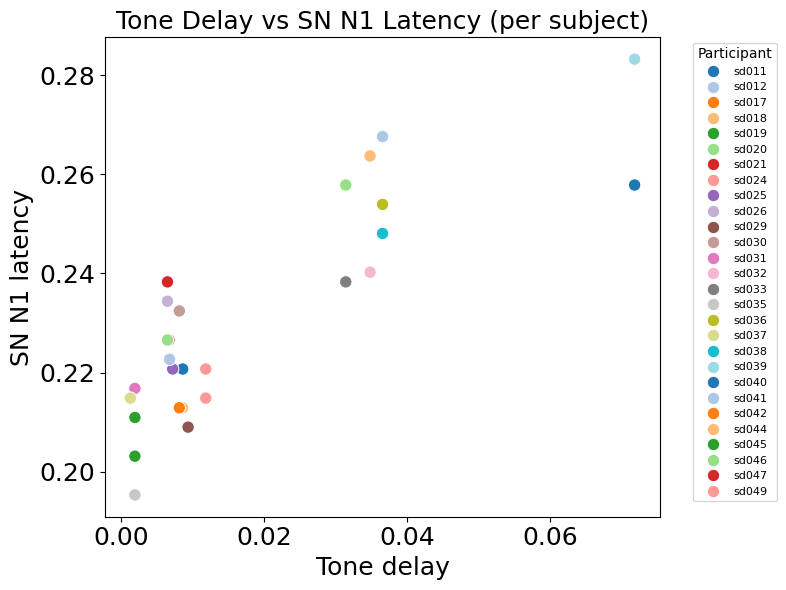

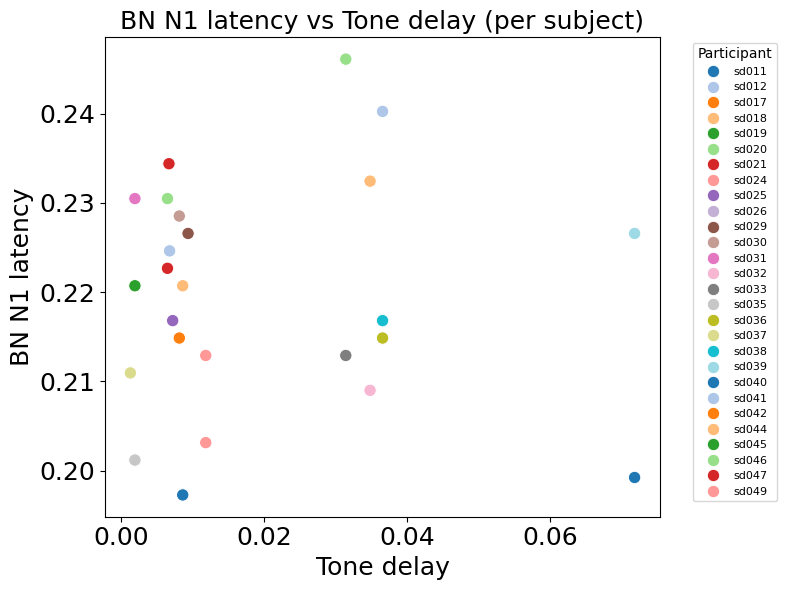

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=N1_STD_df,
    x="Tone_delay",
    y="sn_N1_latency",
    hue="participant_id",   # different color for each subject
    palette="tab20",        # up to 20 distinct colors
    s=80                   # point size
)

plt.title("Tone Delay vs SN N1 Latency (per subject)")
plt.xlabel("Tone delay")
plt.ylabel("SN N1 latency")
plt.legend(title="Participant", bbox_to_anchor=(1.05, 1), loc='upper left',fontsize = 8)
plt.tight_layout()
plt.show()


plt.figure(figsize=(8,6))
sns.scatterplot(
    data=N1_STD_df,
    x="Tone_delay",
    y="beep_N1_latency",
    hue="participant_id",   # different color for each subject
    palette="tab20",        # up to 20 distinct colors
    s=80                   # point size
)

plt.title("BN N1 latency vs Tone delay (per subject)")
plt.xlabel("Tone delay")
plt.ylabel("BN N1 latency")
plt.legend(title="Participant", bbox_to_anchor=(1.05, 1), loc='upper left',fontsize = 8)
plt.tight_layout()
plt.show()



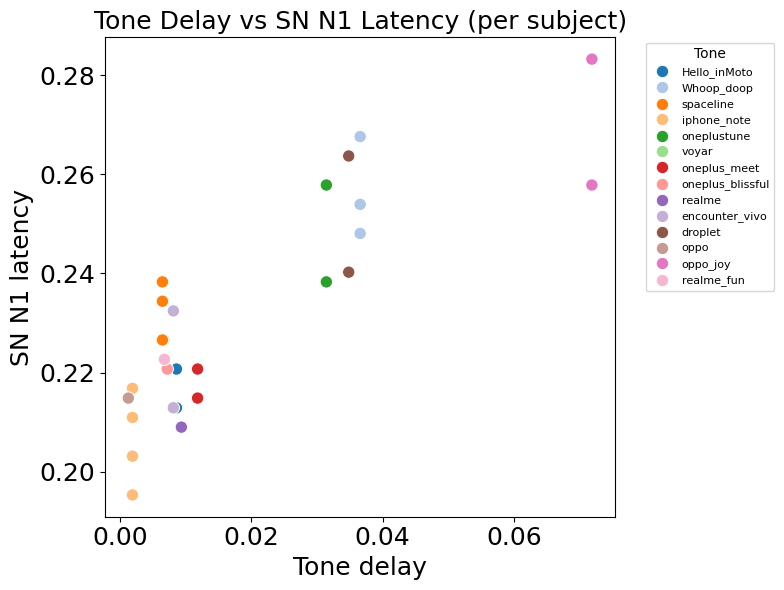

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=N1_STD_df,
    x="Tone_delay",
    y="sn_N1_latency",
    hue="SN_tone",   # different color for each subject
    palette="tab20",        # up to 20 distinct colors
    s=80                   # point size
)

plt.title("Tone Delay vs SN N1 Latency (per subject)")
plt.xlabel("Tone delay")
plt.ylabel("SN N1 latency")
plt.legend(title="Tone", bbox_to_anchor=(1.05, 1), loc='upper left',fontsize = 8)
plt.tight_layout()
plt.show()



In [28]:
tone_avg = N1_STD_df.groupby("SN_tone")["sn_N1_latency"].mean()
tone_avg

SN_tone
Hello_inMoto        0.216797
Whoop_doop          0.256510
droplet             0.251953
encounter_vivo      0.222656
iphone_note         0.206543
oneplus_blissful    0.220703
oneplus_meet        0.217773
oneplustune         0.248047
oppo                0.214844
oppo_joy            0.270508
realme              0.208984
realme_fun          0.222656
spaceline           0.231445
voyar               0.226562
Name: sn_N1_latency, dtype: float64

In [29]:
N1_STD_df

,participant_id,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,sn_N1_latency,beep_N1_latency
0,sd011,30.0,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,0.220703,0.197266
1,sd012,25.0,N,M,PG_acd,SN,BT,NaN,No bad channel,Whoop_doop,0.036576,0.267578,0.240234
6,sd017,25.0,N,M,PG_acd,SN,BT,NaN,NaN,spaceline,0.006485,0.226562,0.222656
7,sd018,28.0,N,M,PG_acd,SN,BT,NaN,NaN,Hello_inMoto,0.008617,0.212891,0.220703
8,sd019,25.0,N,M,PG_acd,SN,BT,NaN,NaN,iphone_note,0.001927,0.210938,0.201172
9,sd020,26.0,N,M,PG_acd,SN,BT,NaN,NaN,oneplustune,0.031429,0.257812,0.246094
10,sd021,25.0,N,M,PG_acd,SN,BT,NaN,NaN,voyar,0.006689,0.226562,0.234375
13,sd024,22.0,N,M,UG_acd,SN,BT,NaN,bad electrode = FT9,oneplus_meet,0.011837,0.220703,0.203125
14,sd025,19.0,N,M,UG_acd,SN,BT,NaN,,oneplus_blissful,0.007211,0.220703,0.216797
15,sd026,18.0,N,M,UG_acd,SN,BT,NaN,NaN,spaceline,0.006485,0.234375,0.222656


# Combine all subject

In [30]:
df_info["sn_tone_avg_N1_latency"] = df_info["SN_tone"].map(tone_avg)
df_info =df_info.dropna(axis=1, how="all")
df_info =df_info.dropna(axis=0, how="all")

In [31]:
df_info = df_info.merge(
    N1_STD_df[["participant_id", "beep_N1_latency","sn_N1_latency"]],
    on="participant_id",
    how="left"   # keeps all rows of df1
)

# fill NaN values in beep_N1_latency by average for each SN_tone
df_info["beep_N1_latency"] = df_info["beep_N1_latency"].fillna(
    df_info.groupby("SN_tone")["beep_N1_latency"].transform("mean")
)
df_info["sn_N1_latency"] = df_info["sn_N1_latency"].fillna(
    df_info.groupby("SN_tone")["sn_N1_latency"].transform("mean")
)

df_info.head()

,participant_id,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,Unnamed: 14,sn_tone_avg_N1_latency,beep_N1_latency,sn_N1_latency
0,sd011,30.0,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,0.216797,0.197266,0.220703
1,sd012,25.0,N,M,PG_acd,SN,BT,NaN,No bad channel,Whoop_doop,0.036576,NaN,0.256510,0.240234,0.267578
2,sd013,25.0,N,M,PG_acd,SN,BT,NaN,TP10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,0.216797,0.208984,0.216797
3,sd014,28.0,N,M,PG_acd,SN,BT,NaN,bad electrode = None Bad subject only very few...,droplet,0.034830,NaN,0.251953,0.220703,0.251953
4,sd015,31.0,N,M,PG_acd,SN,BT,NaN,bad electrode = None,realme_fun,0.006780,NaN,0.222656,0.224609,0.222656


In [32]:
N1_align_all_sub_result ={}
for _, row in df_info.iterrows():
      # check both values exist (not NaN)
    if pd.notna(row.get("beep_N1_latency")) and pd.notna(row.get("sn_tone_avg_N1_latency")):
        N1_align_all_sub_result[f"sub-{row.participant_id}"] = {
            "beep": {"time": float(round(row.beep_N1_latency, 9))},
            "sn": {"time": float(round(row.sn_tone_avg_N1_latency, 9))}
        }
    
    
N1_align_all_sub_result

{'sub-sd011': {'beep': {'time': 0.197265625}, 'sn': {'time': 0.216796875}},
 'sub-sd012': {'beep': {'time': 0.240234375}, 'sn': {'time': 0.256510417}},
 'sub-sd013': {'beep': {'time': 0.208984375}, 'sn': {'time': 0.216796875}},
 'sub-sd014': {'beep': {'time': 0.220703125}, 'sn': {'time': 0.251953125}},
 'sub-sd015': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.22265625}},
 'sub-sd016': {'beep': {'time': 0.223958333}, 'sn': {'time': 0.256510417}},
 'sub-sd017': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.231445312}},
 'sub-sd018': {'beep': {'time': 0.220703125}, 'sn': {'time': 0.216796875}},
 'sub-sd019': {'beep': {'time': 0.201171875}, 'sn': {'time': 0.206542969}},
 'sub-sd020': {'beep': {'time': 0.24609375}, 'sn': {'time': 0.248046875}},
 'sub-sd021': {'beep': {'time': 0.234375}, 'sn': {'time': 0.2265625}},
 'sub-sd022': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.22265625}},
 'sub-sd023': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.22265625}},
 'sub-sd024': {'beep':

In [33]:
import numpy as np

def snap_times_to_evoked(N1_align_all_sub_result, evoked_dicts):
    """
    Snap times in N1_align_all_sub_result to the nearest available time
    from the provided evoked_dicts.
    
    Parameters
    ----------
    N1_align_all_sub_result : dict
        Dict like {sub: {"beep": {"time": ...}, "sn": {"time": ...}}}
    evoked_dicts : dict
        Dict mapping condition name to {sub: Evoked}, 
        e.g. {"beep": beep_evoked_dict, "sn": sn_evoked_dict}
    
    Returns
    -------
    snapped_result : dict
        Same structure as N1_align_all_sub_result, but with times snapped.
    """
    snapped_result = {}

    for subj, conds in N1_align_all_sub_result.items():
        snapped_result[subj] = {}

        for cond, info in conds.items():
            raw_time = info["time"]

            # check if condition has an evoked dict
            if cond in evoked_dicts and subj in evoked_dicts[cond]:
                evoked = evoked_dicts[cond][subj]
                evoked_times = evoked.times

                # find nearest index
                idx = np.argmin(np.abs(evoked_times - raw_time))
                nearest_time = evoked_times[idx]

                snapped_result[subj][cond] = {"time": float(nearest_time)}
            else:
                # keep original
                snapped_result[subj][cond] = {"time": float(raw_time)}

    return snapped_result
evoked_dicts = {
    "beep": BN_std_eps_evoked_dict,
    "sn": SN_std_eps_evoked_dict
}

N1_snapped = snap_times_to_evoked(N1_align_all_sub_result, evoked_dicts)

print(N1_snapped["sub-sd012"])
# {'beep': {'time': 0.240234375}, 'sn': {'time': 0.256510417}} (snapped to evoked time grid)


{'beep': {'time': 0.240234375}, 'sn': {'time': 0.255859375}}


In [34]:
N1_snapped 

{'sub-sd011': {'beep': {'time': 0.197265625}, 'sn': {'time': 0.216796875}},
 'sub-sd012': {'beep': {'time': 0.240234375}, 'sn': {'time': 0.255859375}},
 'sub-sd013': {'beep': {'time': 0.208984375}, 'sn': {'time': 0.216796875}},
 'sub-sd014': {'beep': {'time': 0.220703125}, 'sn': {'time': 0.251953125}},
 'sub-sd015': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.22265625}},
 'sub-sd016': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.255859375}},
 'sub-sd017': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.23046875}},
 'sub-sd018': {'beep': {'time': 0.220703125}, 'sn': {'time': 0.216796875}},
 'sub-sd019': {'beep': {'time': 0.201171875}, 'sn': {'time': 0.20703125}},
 'sub-sd020': {'beep': {'time': 0.24609375}, 'sn': {'time': 0.248046875}},
 'sub-sd021': {'beep': {'time': 0.234375}, 'sn': {'time': 0.2265625}},
 'sub-sd022': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.22265625}},
 'sub-sd023': {'beep': {'time': 0.224609375}, 'sn': {'time': 0.22265625}},
 'sub-sd024': {'beep': {

In [35]:
print(sorted(beep_N1_aligned_STD.keys()),'\n',sorted(N1_align_all_sub_result.keys()) )
len(beep_N1_aligned_STD), len(N1_STD_combined_result) ,len(N1_align_all_sub_result),len(BN_std_eps_evoked_dict)


['sub-sd011', 'sub-sd012', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd020', 'sub-sd021', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd039', 'sub-sd040', 'sub-sd041', 'sub-sd042', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd049'] 
 ['sub-sd011', 'sub-sd012', 'sub-sd013', 'sub-sd014', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd020', 'sub-sd021', 'sub-sd022', 'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027', 'sub-sd028', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd039', 'sub-sd040', 'sub-sd041', 'sub-sd042', 'sub-sd043', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd054', 'sub-sd055', 'sub-sd056', 'sub-sd061', 'sub-sd062', 'sub-sd063', 'sub-sd064', 'sub-sd0

(28, 28, 50, 54)

In [36]:
time_array  = sn_N1_aligned_STD['sub-sd012'].times 
target_time = N1_align_all_sub_result['sub-sd012']['sn']['time']
idx = np.argmin(np.abs(time_array - target_time))

closest_time = time_array[idx]

print(f"Closest time to {target_time}s is {closest_time:.6f}s at index {idx}")

Closest time to 0.256510417s is 0.255859s at index 422


In [37]:
SN_std_eps_evoked_dict

{'sub-sd011': <Evoked | 'S24' (average, N=708), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd012': <Evoked | 'S24' (average, N=606), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd013': <Evoked | 'S24' (average, N=724), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd015': <Evoked | 'S24' (average, N=712), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd016': <Evoked | 'S24' (average, N=734), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd017': <Evoked | 'S24' (average, N=613), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd018': <Evoked | 'S24' (average, N=603), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd019': <Evoked | 'S24' (average, N=687), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd020': <Evoked | 'S24' (average, N=719), -0.30078 – 0.90039 s, baseline -0.300781 – 0 s, 

In [38]:
# Step 1: Align evoked data to threshold times
beep_N1_aligned_STD = align_and_standardize_evokeds(
    BN_std_eps_evoked_dict, 
    N1_snapped, 
    condition_key='beep'
)


sn_N1_aligned_STD = align_and_standardize_evokeds(
    SN_std_eps_evoked_dict, 
    N1_snapped, 
    condition_key='sn'
)

beep_N1_aligned_devi = align_and_standardize_evokeds(
    BN_devi_eps_evoked_dict, 
    N1_snapped,         
    condition_key='beep'
)

sn_N1_aligned_devi = align_and_standardize_evokeds(
    SN_devi_eps_evoked_dict, 
    N1_snapped, 
    condition_key='sn'
)

Successfully aligned 48 subjects: ['sub-sd032', 'sub-sd011', 'sub-sd028', 'sub-sd063', 'sub-sd037', 'sub-sd025', 'sub-sd041', 'sub-sd053', 'sub-sd036', 'sub-sd026', 'sub-sd013', 'sub-sd047', 'sub-sd029', 'sub-sd038', 'sub-sd015', 'sub-sd024', 'sub-sd012', 'sub-sd051', 'sub-sd016', 'sub-sd020', 'sub-sd030', 'sub-sd031', 'sub-sd054', 'sub-sd021', 'sub-sd033', 'sub-sd067', 'sub-sd027', 'sub-sd044', 'sub-sd056', 'sub-sd046', 'sub-sd045', 'sub-sd052', 'sub-sd048', 'sub-sd062', 'sub-sd065', 'sub-sd049', 'sub-sd017', 'sub-sd018', 'sub-sd035', 'sub-sd022', 'sub-sd055', 'sub-sd064', 'sub-sd061', 'sub-sd023', 'sub-sd019', 'sub-sd039', 'sub-sd040', 'sub-sd042']
Successfully aligned 48 subjects: ['sub-sd032', 'sub-sd011', 'sub-sd028', 'sub-sd063', 'sub-sd037', 'sub-sd025', 'sub-sd041', 'sub-sd053', 'sub-sd036', 'sub-sd026', 'sub-sd013', 'sub-sd047', 'sub-sd029', 'sub-sd038', 'sub-sd015', 'sub-sd024', 'sub-sd012', 'sub-sd051', 'sub-sd016', 'sub-sd020', 'sub-sd030', 'sub-sd031', 'sub-sd054', 'sub-sd

In [39]:
sn_STD_N1_aligned_SN_MMN_evokeds_dict

{'sub-sd032': <Evoked | 'S15 - S24' (average, N=91.40779220779221), -0.54102 – 0.66016 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd011': <Evoked | 'S15 - S24' (average, N=61.207741935483874), -0.52148 – 0.67969 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd037': <Evoked | 'S15 - S24' (average, N=121.35722543352603), -0.51562 – 0.68555 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd025': <Evoked | 'S15 - S24' (average, N=120.17709563164108), -0.52148 – 0.67969 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd041': <Evoked | 'S15 - S24' (average, N=206.95579567779959), -0.52344 – 0.67773 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd036': <Evoked | 'S15 - S24' (average, N=99.4489544895449), -0.55469 – 0.64648 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd026': <Evoked | 'S15 - S24' (average, N=102.01037613488975), -0.53516 – 0.66602 s, baseline -0.300781 – 0 s, 64 ch, ~386 kB>,
 'sub-sd047': <Evoked | 'S15 - S24' (average, N=91.43074324324324

combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:40: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
e:\ecf-exp2-notif-mmn\analysis\visualization.py:40: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


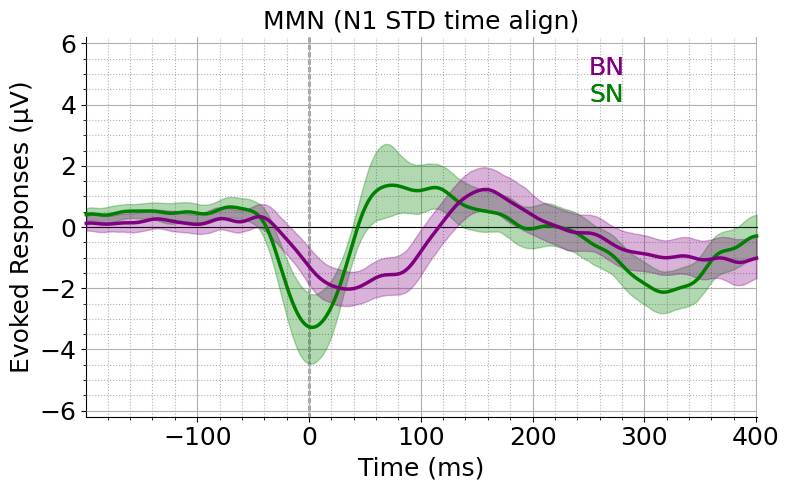

In [40]:
sn_STD_N1_aligned_SN_MMN_evokeds_dict = {sub1:mne.combine_evoked([sn_N1_aligned_devi[sub1], sn_N1_aligned_STD[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(sn_N1_aligned_devi,sn_N1_aligned_STD)}  
beep_STD_N1_aligned_BN_MMN_evokeds_dict = {sub1:mne.combine_evoked([beep_N1_aligned_devi[sub1], beep_N1_aligned_STD[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(beep_N1_aligned_devi ,beep_N1_aligned_STD)} 


time_range=(-.200,.350)
MMN_evokeds = {
           'PN':sn_N1_aligned_devi.values(),
                      }

stylesdict ={
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
fig, axs = plt.subplots(figsize=(8, 5), dpi=100)
plot_erps(MMN_evokeds, picks=['Cz'],
                                   stylesdict=stylesdict,axs =axs,
                                   text_labels=text_labels,title="MMN (N1 STD time align)",time_range=(-.200,.4))
MMN_evokeds = { 
           
           'BN':beep_STD_N1_aligned_BN_MMN_evokeds_dict.values()  ,
                      }

stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
plot_erps(MMN_evokeds, picks=['Cz'],
                                   stylesdict=stylesdict,axs =axs,
                                   text_labels=text_labels,title="MMN (N1 STD time align)",time_range=(-.200,.4))
plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"


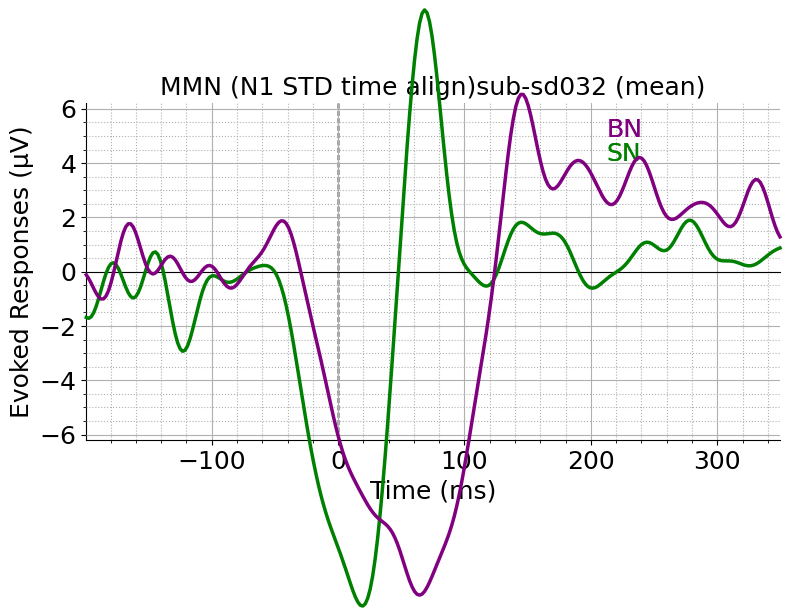

combining channels using "mean"
combining channels using "mean"


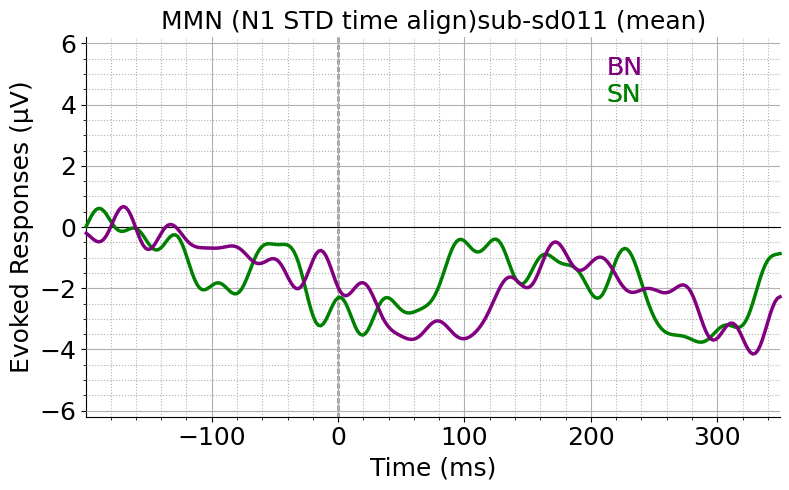

combining channels using "mean"
combining channels using "mean"


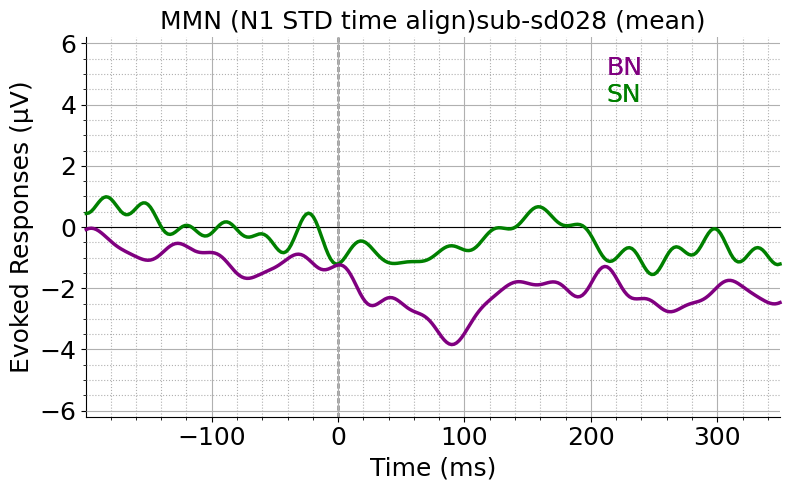

combining channels using "mean"
combining channels using "mean"


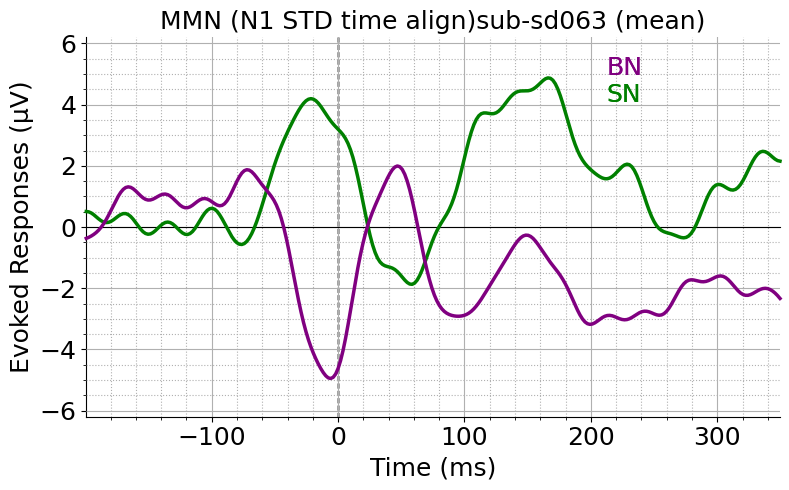

combining channels using "mean"
combining channels using "mean"


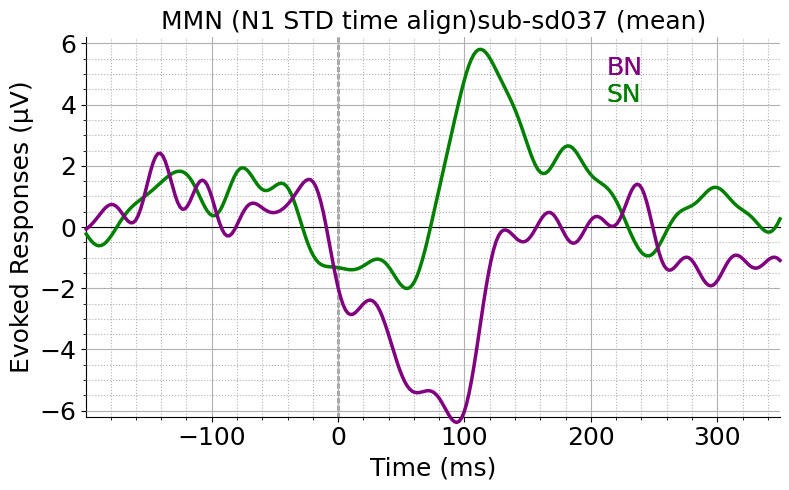

combining channels using "mean"
combining channels using "mean"


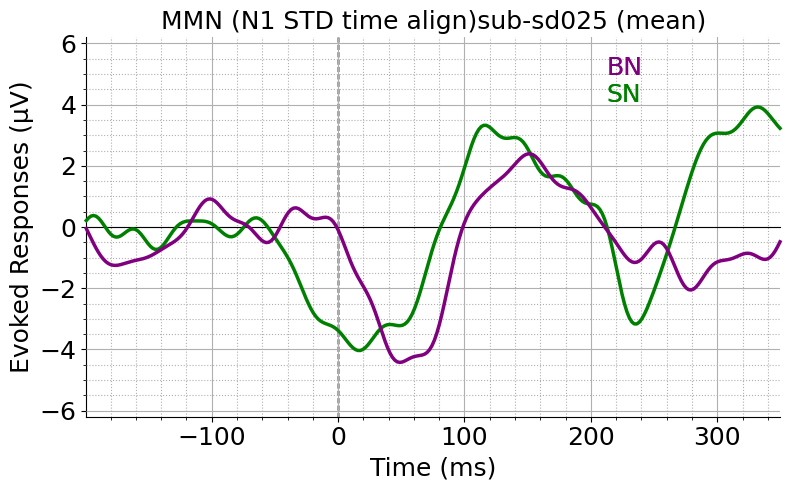

combining channels using "mean"
combining channels using "mean"


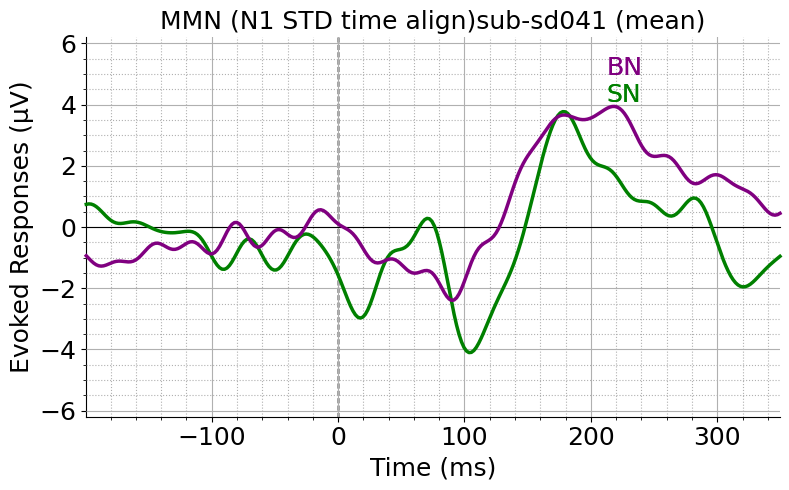

combining channels using "mean"
combining channels using "mean"


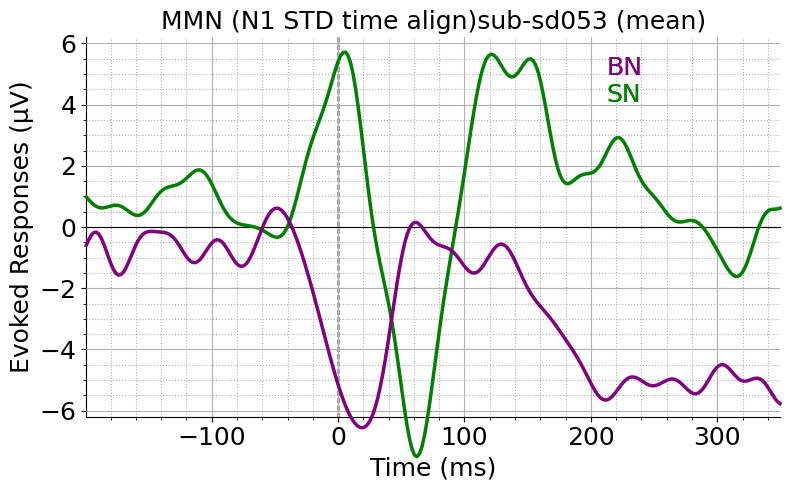

combining channels using "mean"
combining channels using "mean"


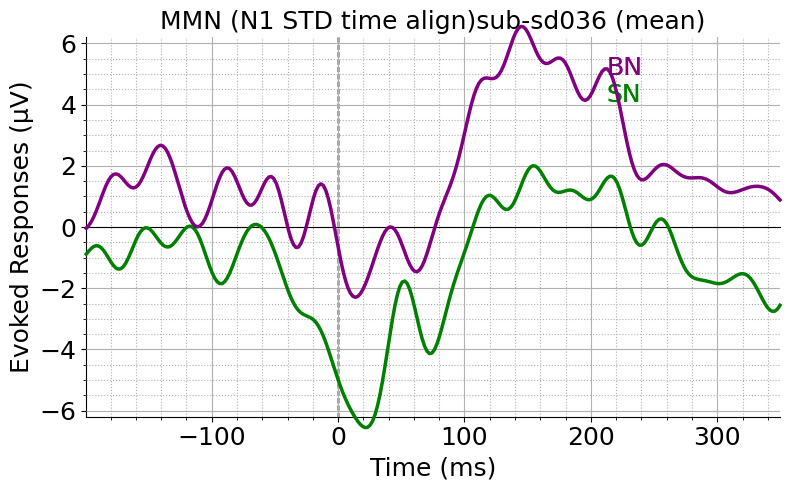

combining channels using "mean"
combining channels using "mean"


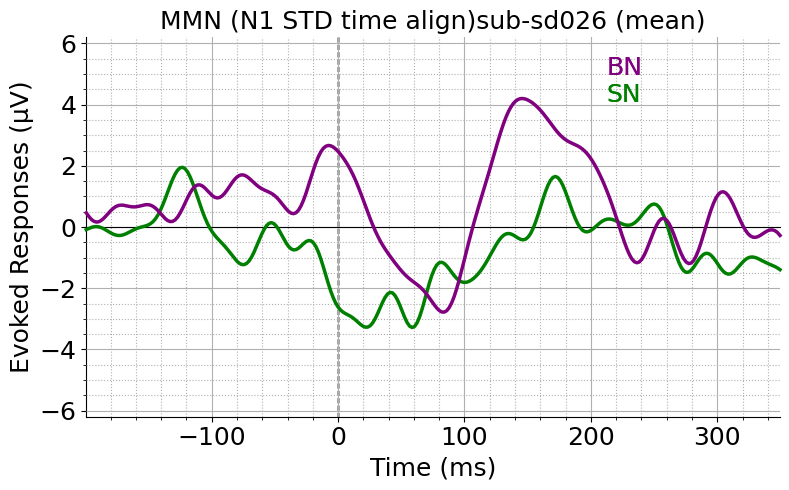

combining channels using "mean"
combining channels using "mean"


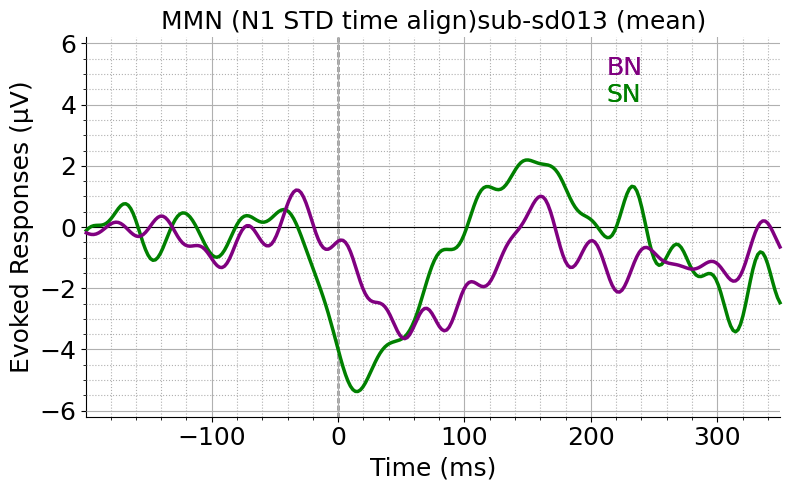

combining channels using "mean"
combining channels using "mean"


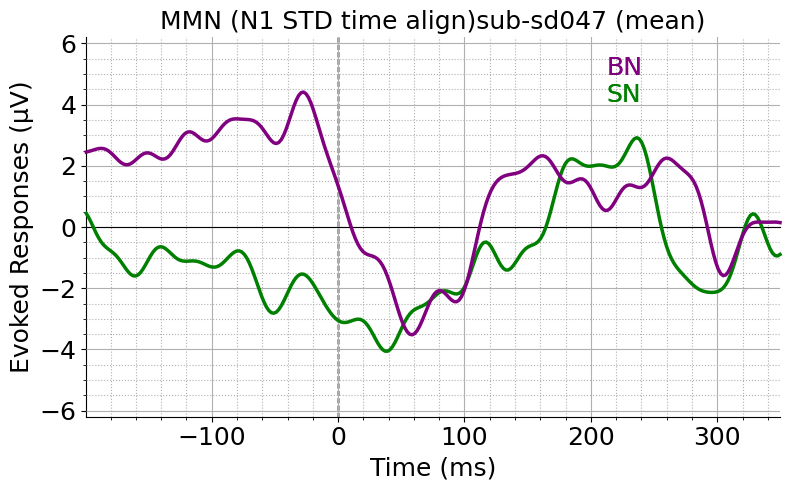

combining channels using "mean"
combining channels using "mean"


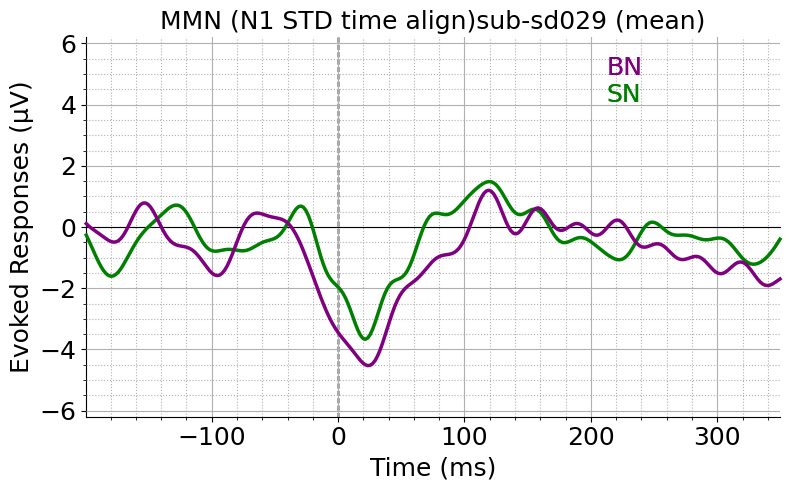

combining channels using "mean"
combining channels using "mean"


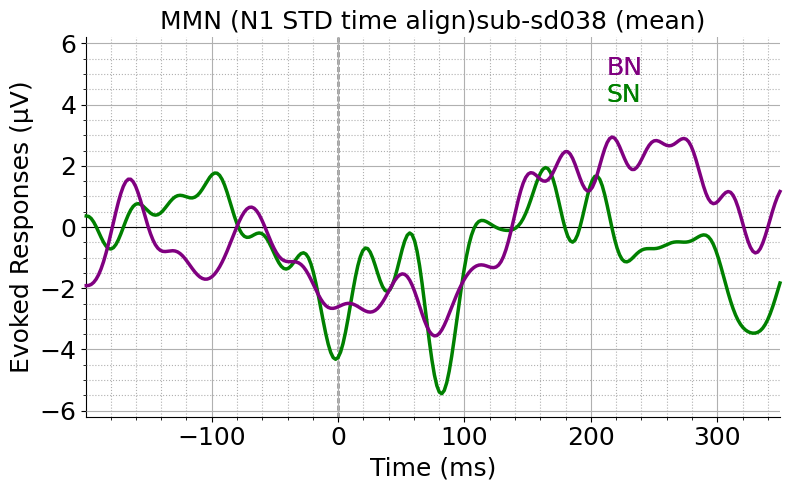

combining channels using "mean"
combining channels using "mean"


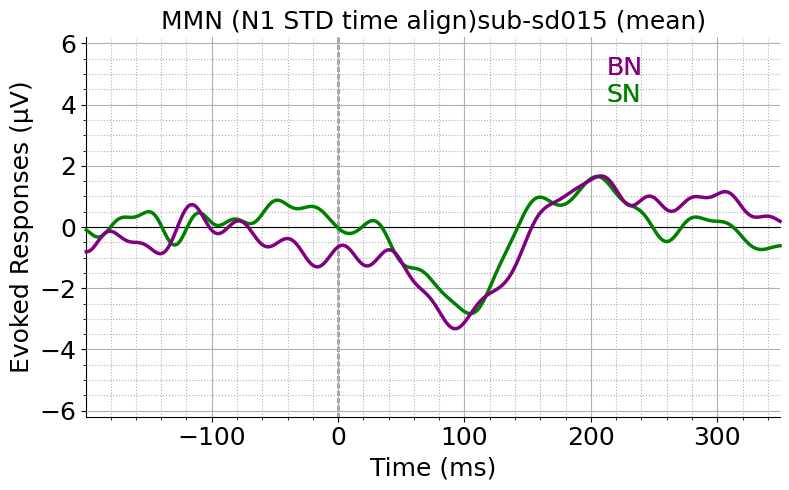

combining channels using "mean"
combining channels using "mean"


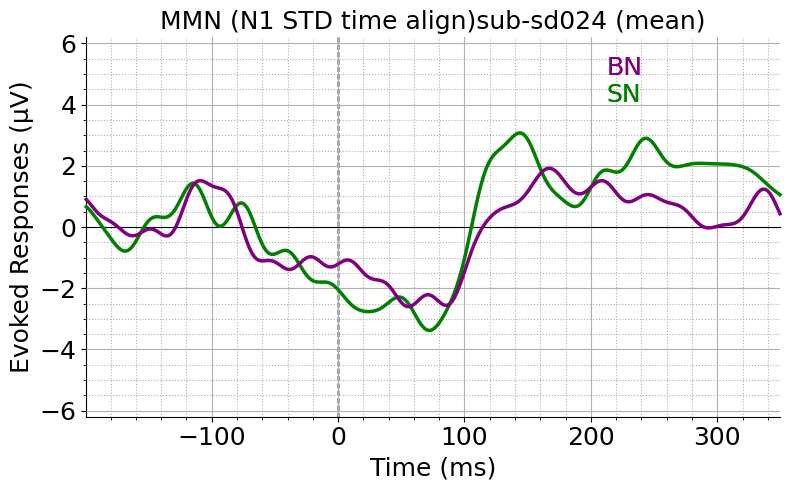

combining channels using "mean"
combining channels using "mean"


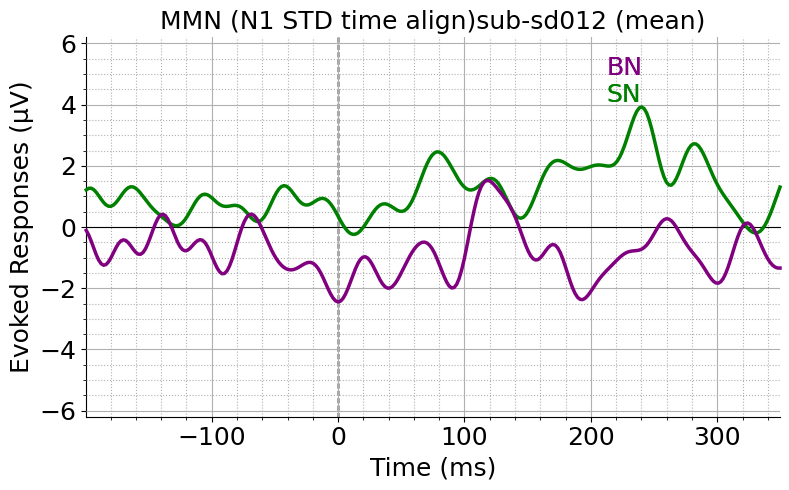

combining channels using "mean"
combining channels using "mean"


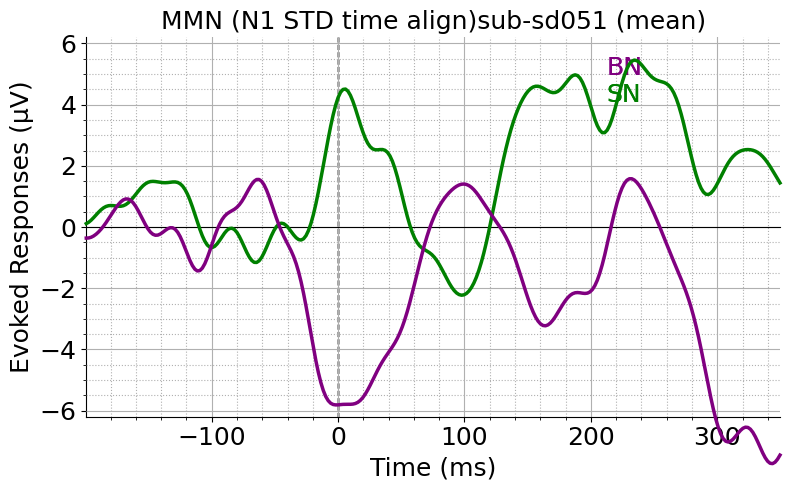

combining channels using "mean"
combining channels using "mean"


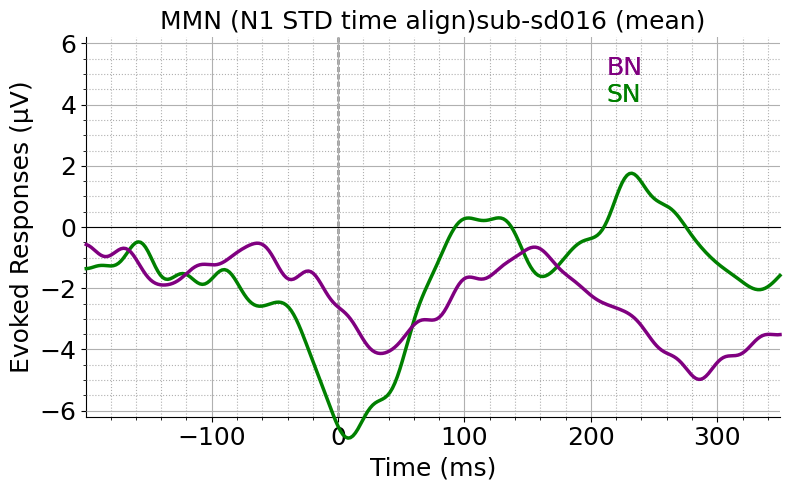

combining channels using "mean"
combining channels using "mean"


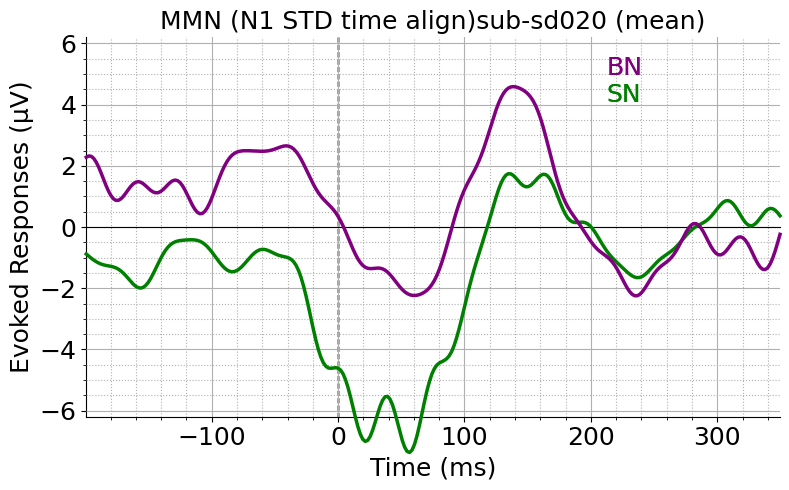

combining channels using "mean"
combining channels using "mean"


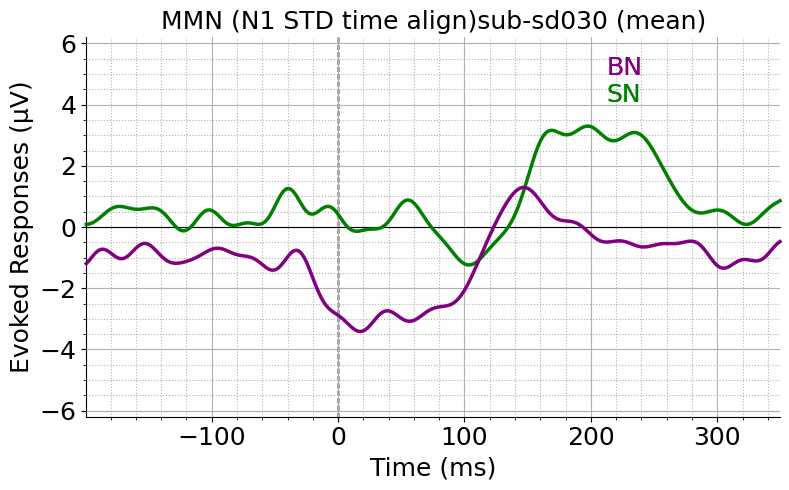

combining channels using "mean"
combining channels using "mean"


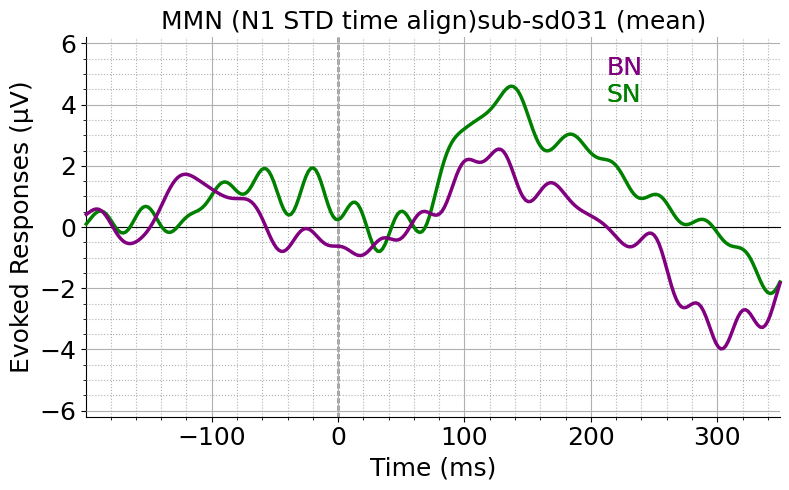

combining channels using "mean"
combining channels using "mean"


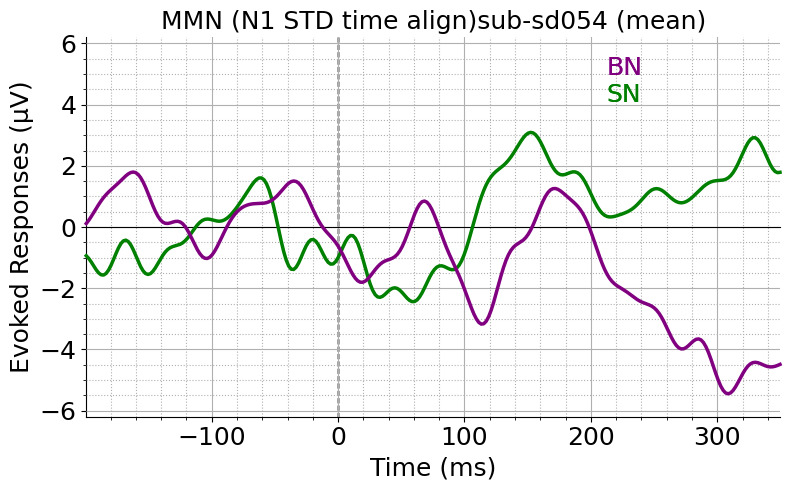

combining channels using "mean"
combining channels using "mean"


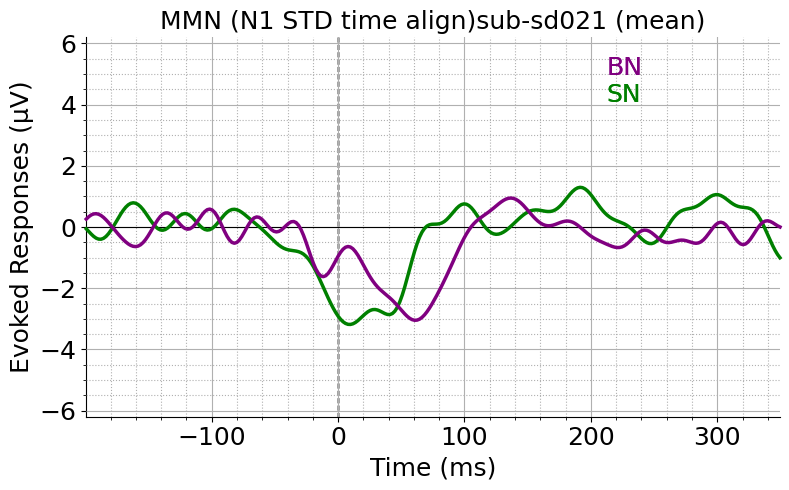

combining channels using "mean"
combining channels using "mean"


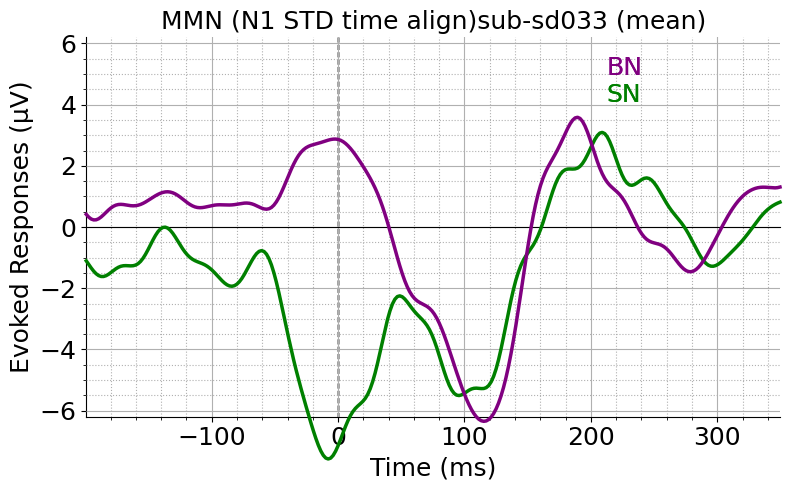

combining channels using "mean"
combining channels using "mean"


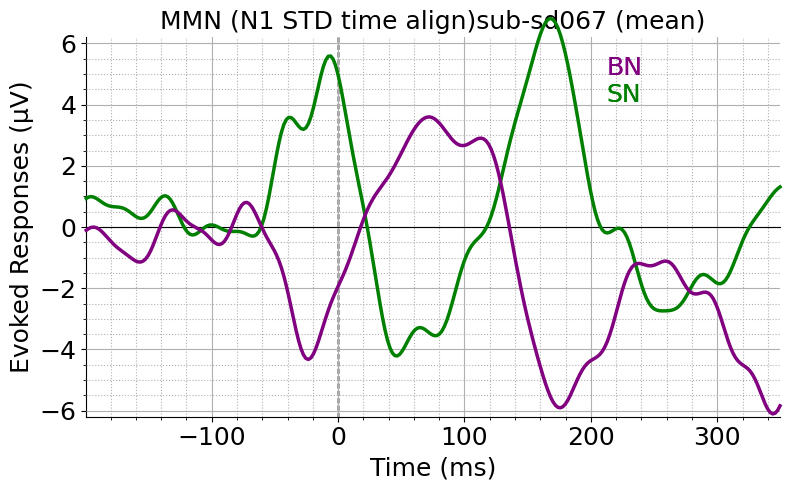

combining channels using "mean"
combining channels using "mean"


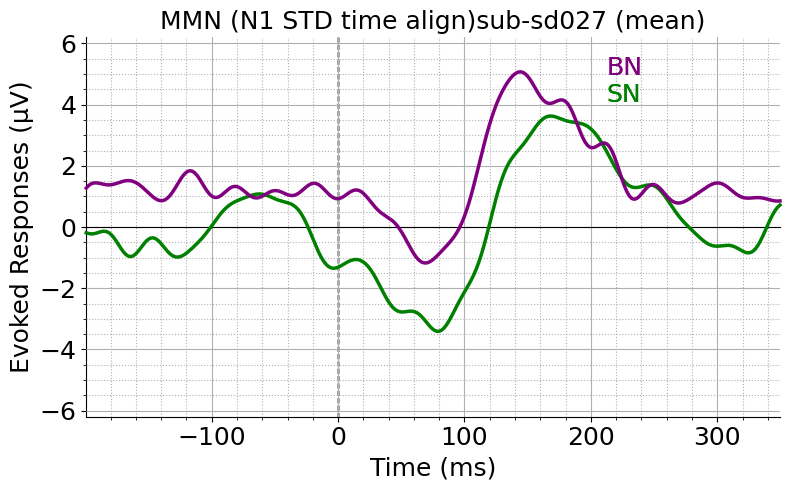

combining channels using "mean"
combining channels using "mean"


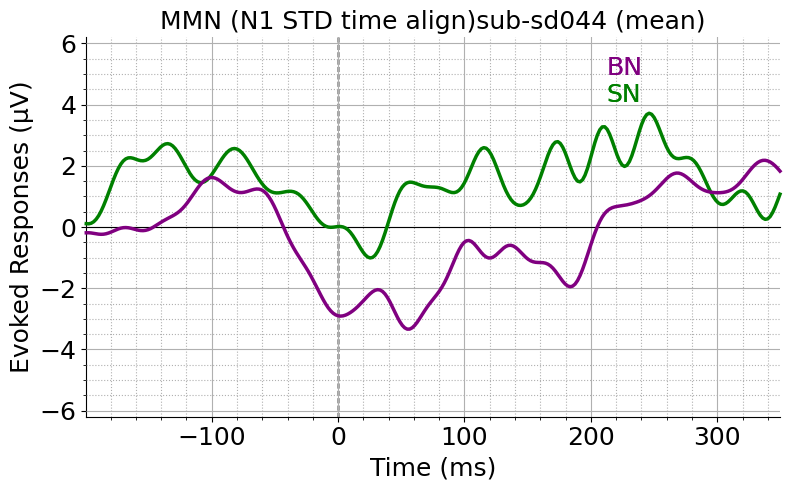

combining channels using "mean"
combining channels using "mean"


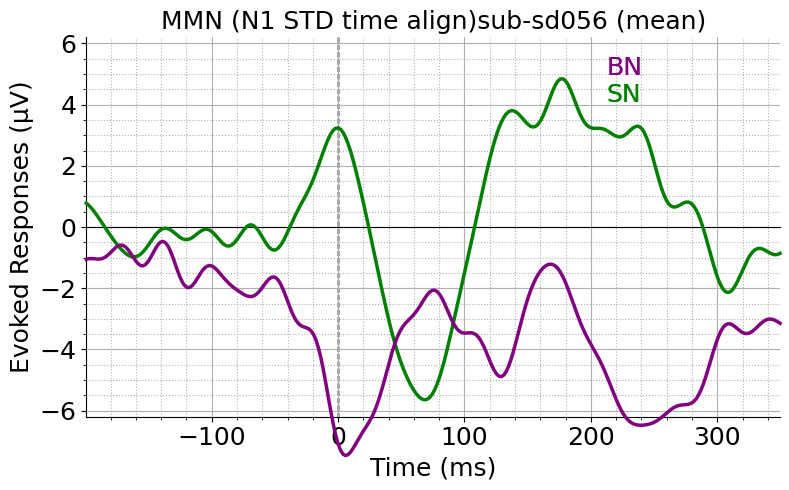

combining channels using "mean"
combining channels using "mean"


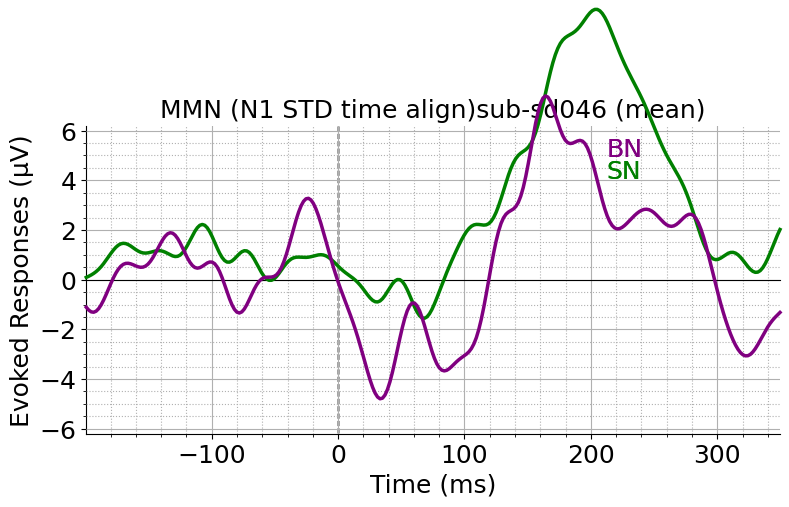

combining channels using "mean"
combining channels using "mean"


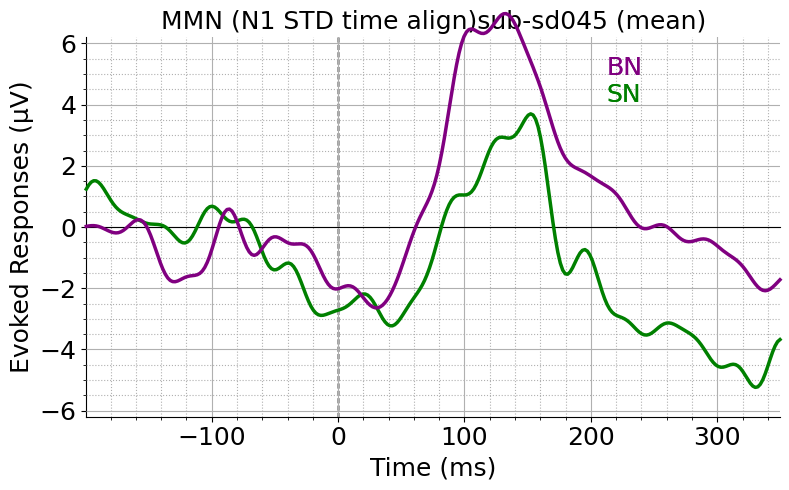

combining channels using "mean"
combining channels using "mean"


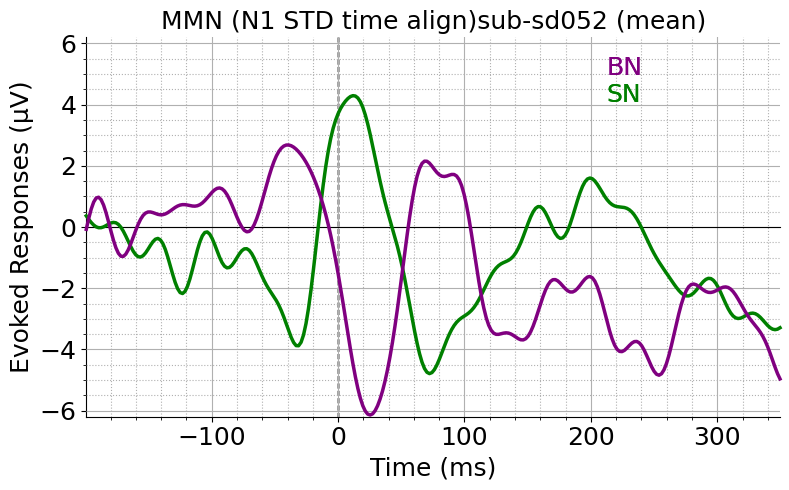

combining channels using "mean"
combining channels using "mean"


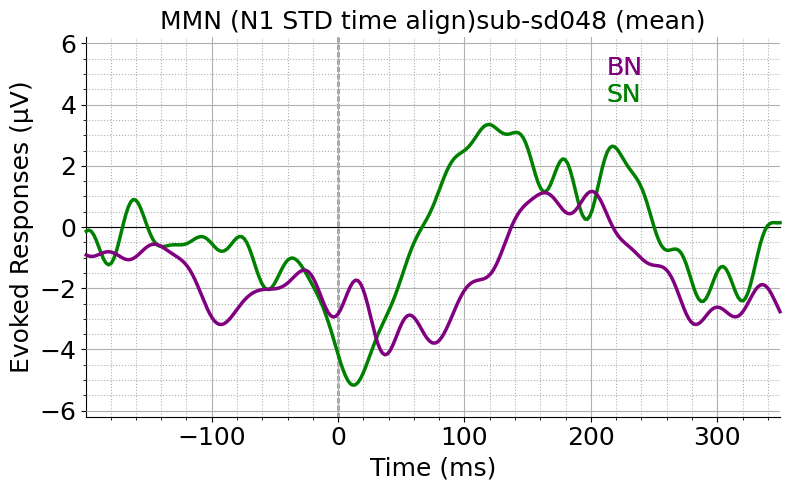

combining channels using "mean"
combining channels using "mean"


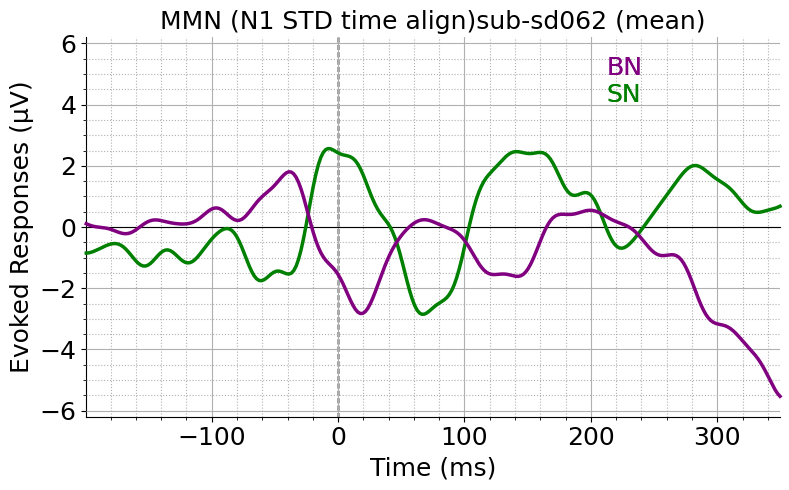

combining channels using "mean"
combining channels using "mean"


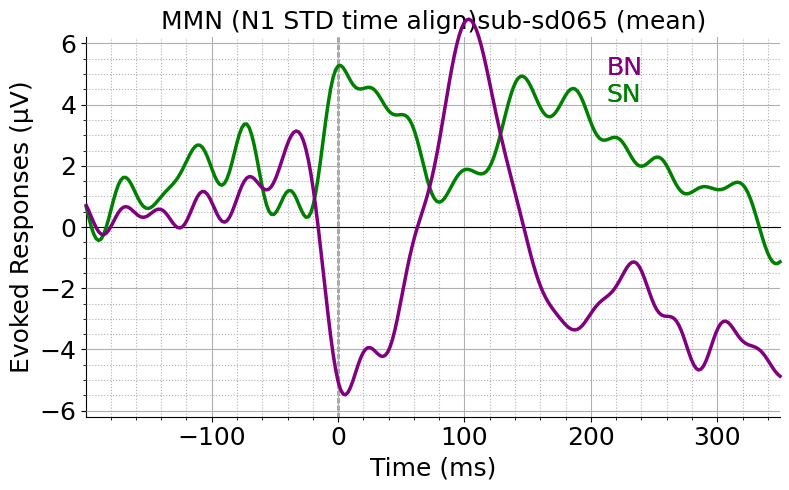

combining channels using "mean"
combining channels using "mean"


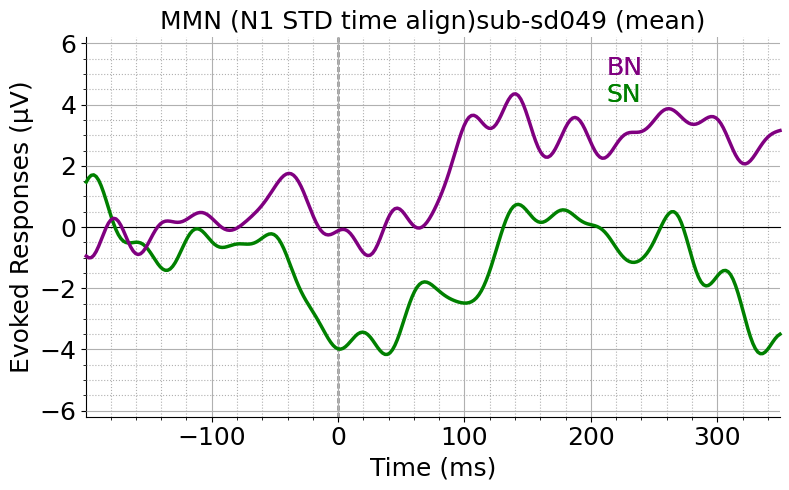

combining channels using "mean"
combining channels using "mean"


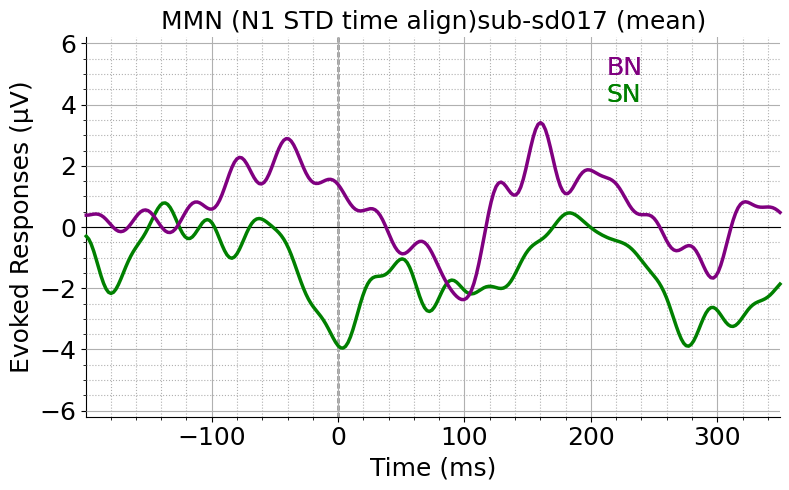

combining channels using "mean"
combining channels using "mean"


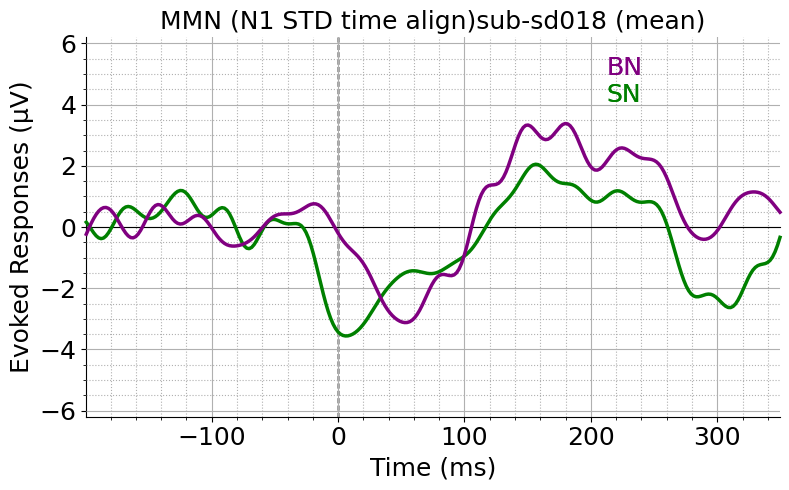

combining channels using "mean"
combining channels using "mean"


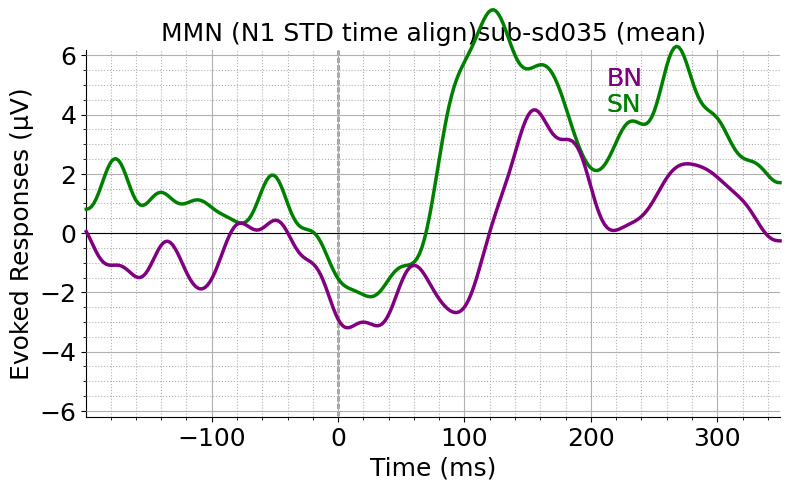

combining channels using "mean"
combining channels using "mean"


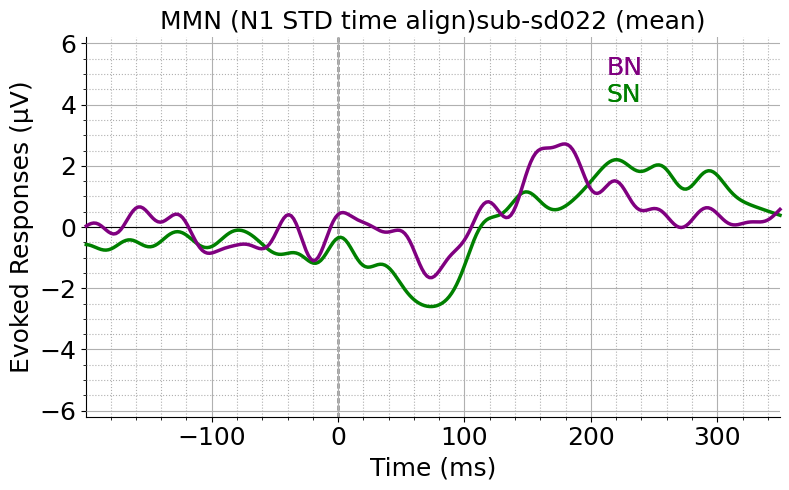

combining channels using "mean"
combining channels using "mean"


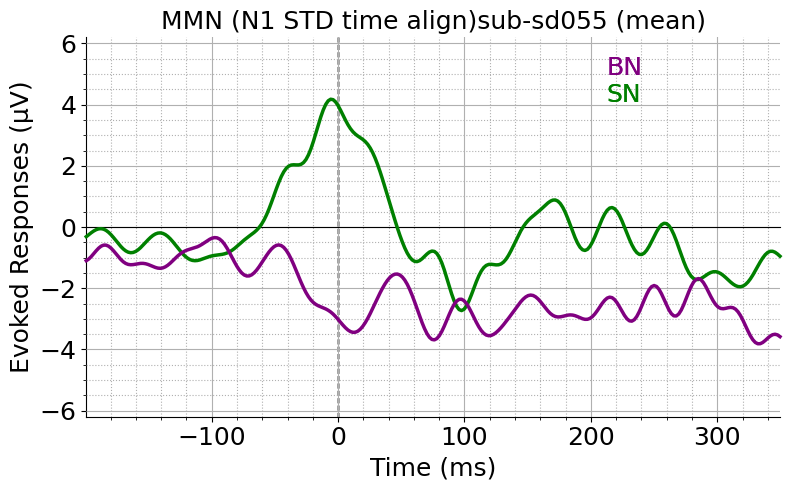

combining channels using "mean"
combining channels using "mean"


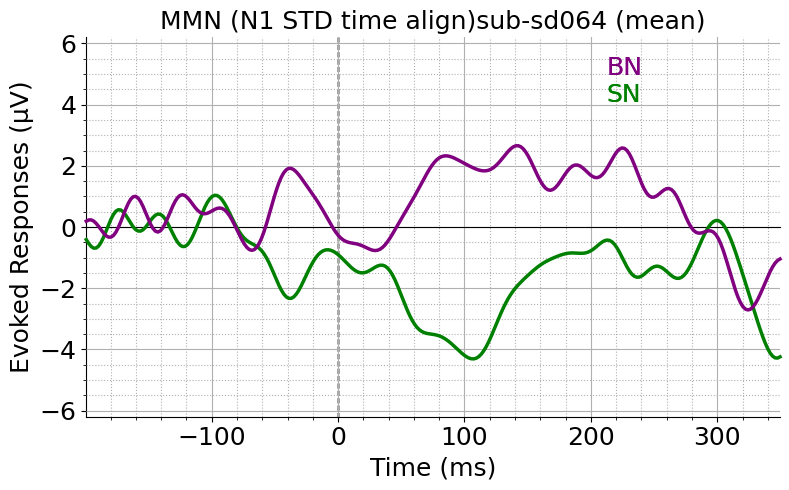

combining channels using "mean"
combining channels using "mean"


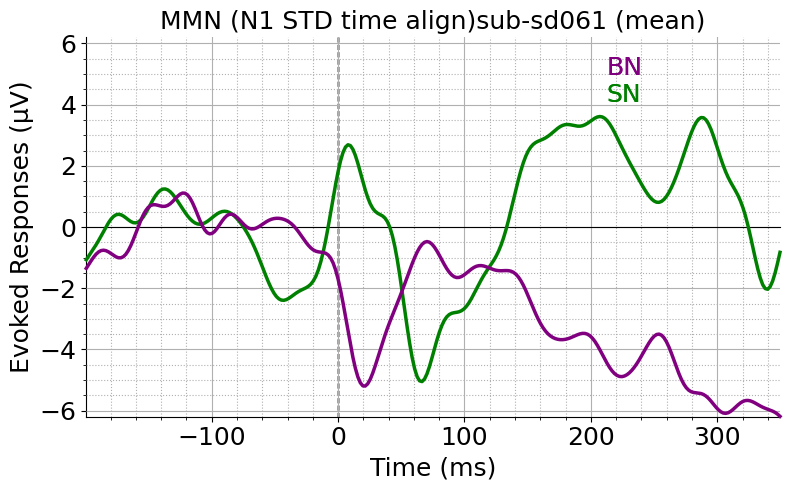

combining channels using "mean"
combining channels using "mean"


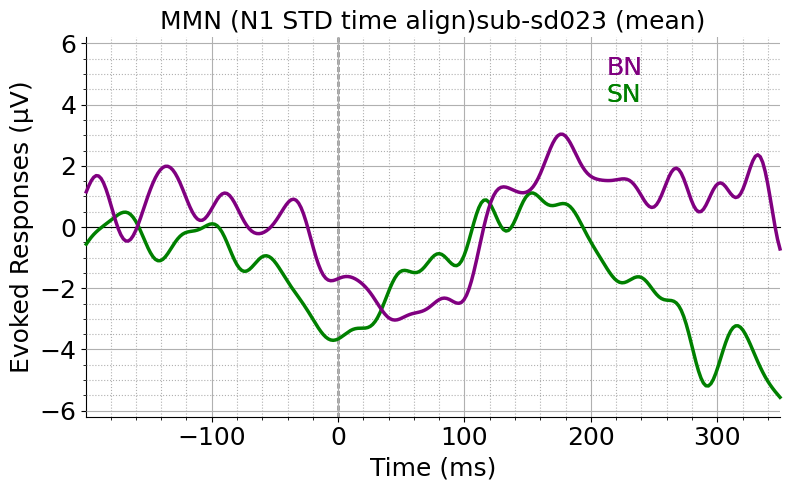

combining channels using "mean"
combining channels using "mean"


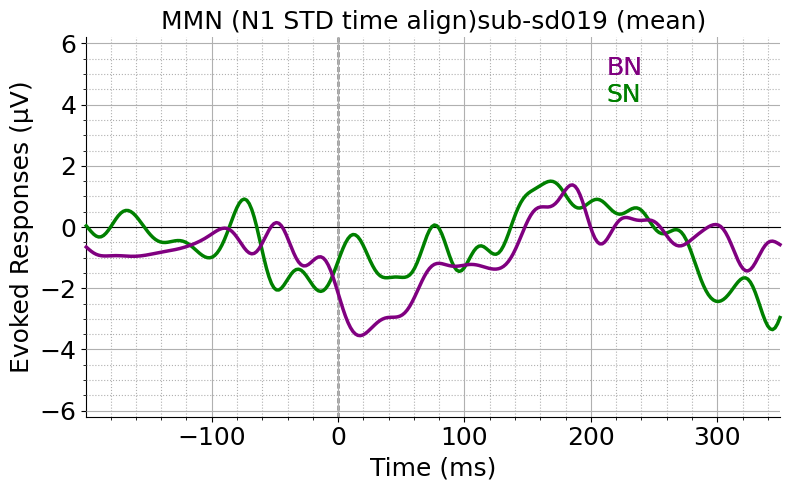

combining channels using "mean"
combining channels using "mean"


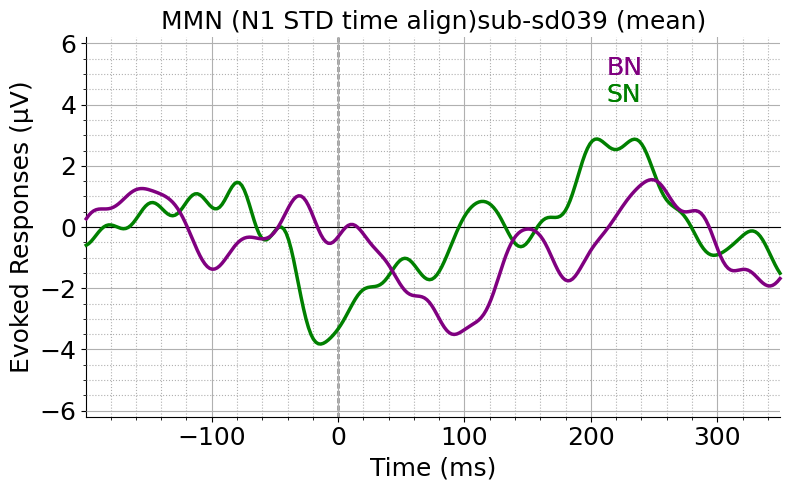

combining channels using "mean"
combining channels using "mean"


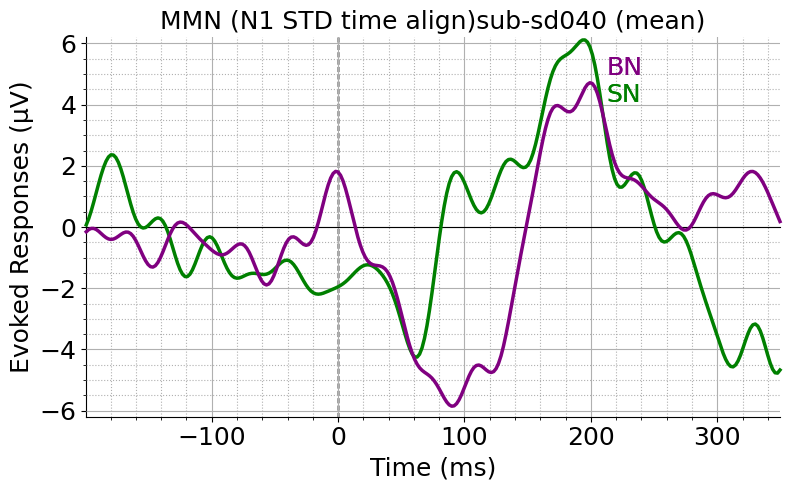

combining channels using "mean"
combining channels using "mean"


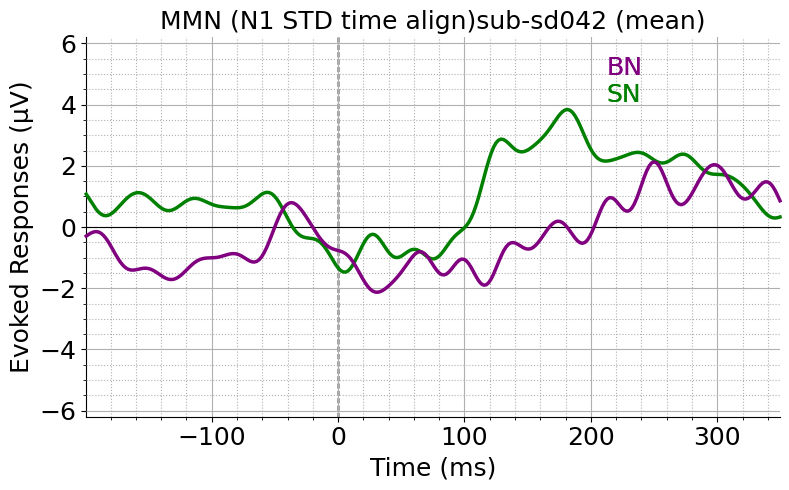

In [41]:
for sub in sn_STD_N1_aligned_SN_MMN_evokeds_dict:
    MMN_evokeds = {
           'PN': [sn_STD_N1_aligned_SN_MMN_evokeds_dict[sub] ],
                      }
    stylesdict ={
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
    text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ] 
    fig, axs = plt.subplots(figsize=(8, 5), dpi=100)
    try:
        plot_erps(MMN_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align){sub}",time_range=(-.200,.350))
        MMN_evokeds = {
           
           'BN':[beep_STD_N1_aligned_BN_MMN_evokeds_dict[sub]]  ,
                      }
        stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             
             }
        
        plot_erps(MMN_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align){sub}",time_range=(-.200,.350))
        plt.show()
    except:
        print('Error', sub)
 

In [42]:
len(sn_STD_N1_aligned_SN_MMN_evokeds_dict)

48

### Statstics : amplitude

 Mean  Amplitude : t_stat [0.76686079] with , p_value [0.44699934]
 Peak Amplitude : t_stat -0.48436011994133726 with , p_value 0.6303798774511419


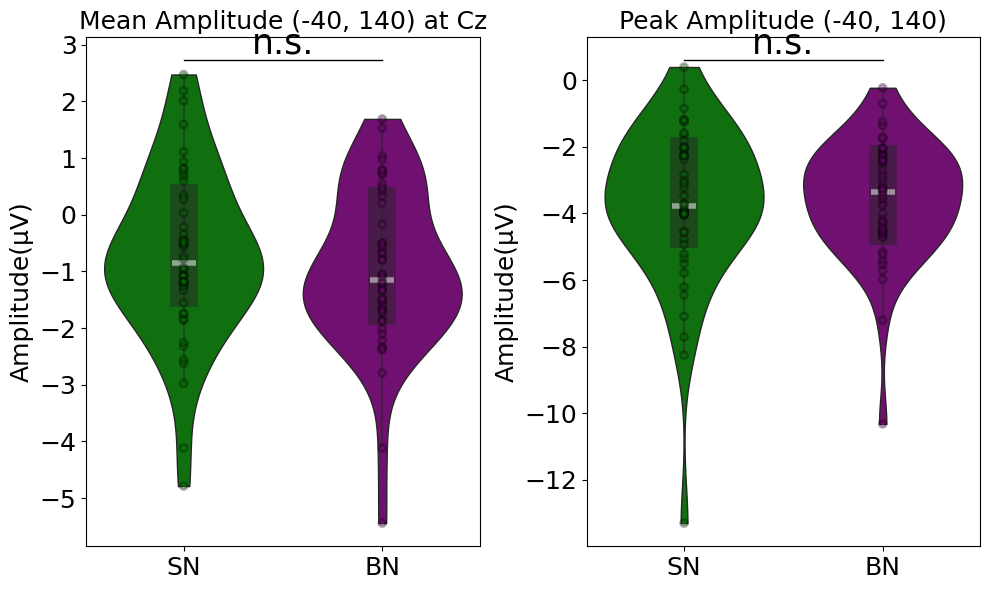

In [43]:
from scipy import stats
import seaborn as sns
df_type = "Amplitude"
label=("SN", "BN")
time_window = (-40,140)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels


# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mean_amplitudes(
    sn_STD_N1_aligned_SN_MMN_evokeds_dict ,beep_STD_N1_aligned_BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)



#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df = df_convert(PN_amps*1e+6, BN_amps*1e+6,label=("SN", "BN") ,df_type = df_type)
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)

sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(PN_amps, BN_amps)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])
 
PN_amps_peak = np.array(list(extract_peak_amplitude(sn_STD_N1_aligned_SN_MMN_evokeds_dict,time_window = (-.040, .140),channels=["Cz"]).values()))*1e+6
BN_amps_peak =np.array(list(extract_peak_amplitude(beep_STD_N1_aligned_BN_MMN_evokeds_dict ,time_window = (-.040, .140),channels=["Cz"]).values()))*1e+6


# Fraction area plot 
df=df_convert(PN_amps_peak.reshape(-1, 1), BN_amps_peak.reshape(-1, 1),label=("SN", "BN") ,df_type = df_type)

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_rel(PN_amps_peak, BN_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '*' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### Statstics : Latency 

Peak latency ;- t_stat [-1.31034328] with , p_value [0.19644747]
Fractional area (250 %) latency ;- t_stat -0.8290669277083447 with , p_value 0.40918938835309715


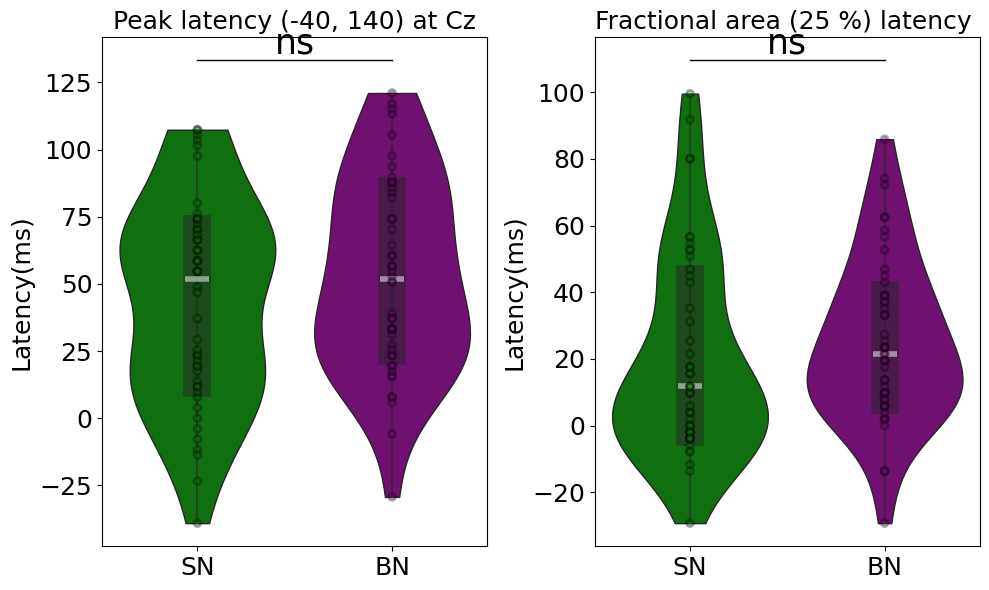

In [44]:
# Extract Latency
df_type = "Latency"
label=("SN", "BN")
time_window = (-40, 140)  # ms - typical MMN window
channels =["Cz"]
# Set up the plot
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
     sn_STD_N1_aligned_SN_MMN_evokeds_dict ,beep_STD_N1_aligned_BN_MMN_evokeds_dict , time_window=time_window, 
    channels=channels, method='peak')
df = df_convert(np.array(list(peak_lat1.values())).reshape(-1,1), np.array(list(peak_lat2.values()) ).reshape(-1,1),label=("SN", "BN"),df_type = df_type)


df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(np.array(list(peak_lat1.values())).reshape(-1,1), np.array(list(peak_lat2.values()) ).reshape(-1,1))
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


area_lat1, area_lat2, subjects = extract_mmn_latencies(
    sn_STD_N1_aligned_SN_MMN_evokeds_dict ,beep_STD_N1_aligned_BN_MMN_evokeds_dict , time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.25)
area_lat1 = np.array(list(area_lat1.values())).reshape(-1,1)
area_lat2 = np.array(list(area_lat2.values())).reshape(-1,1) 
# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df = df_convert(area_lat1 , area_lat2,label=("SN", "BN"),df_type = df_type)
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1


t_stat, p_value = stats.ttest_ind(area_lat1[~np.isnan(area_lat1)],area_lat2[~np.isnan(area_lat2)] )
print(f'Fractional area (250 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label =  '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (25 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

In [45]:
area_lat1

array([[ 15.625   ],
       [  9.765625],
       [  9.765625],
       [ 80.078125],
       [ -7.8125  ],
       [ -1.953125],
       [  3.90625 ],
       [-29.296875],
       [ 11.71875 ],
       [  0.      ],
       [ 17.578125],
       [-11.71875 ],
       [ -1.953125],
       [ -3.90625 ],
       [ 17.578125],
       [ 42.96875 ],
       [ 15.625   ],
       [  1.953125],
       [ 99.609375],
       [ 25.390625],
       [ -7.8125  ],
       [ -3.90625 ],
       [ 11.71875 ],
       [ -1.953125],
       [ -1.953125],
       [  0.      ],
       [-13.671875],
       [ -5.859375],
       [ 21.484375],
       [  3.90625 ],
       [ 11.71875 ],
       [ -3.90625 ],
       [ 35.15625 ],
       [  5.859375],
       [ -3.90625 ],
       [ -3.90625 ],
       [ 80.078125],
       [ 52.734375],
       [ 50.78125 ],
       [ 31.25    ],
       [ 91.796875],
       [ 52.734375],
       [ 56.640625],
       [ 56.640625],
       [ 44.921875],
       [ 54.6875  ],
       [       nan],
       [ 46.8

# Groups : LSU and HSU 

In [74]:
low_sub_D  = ['sd011', 'sd012', 'sd013', 'sd014', 'sd017', 'sd019', 'sd020', 'sd021', 'sd023', 'sd024', 'sd025', 'sd027', 'sd031',
               'sd032', 'sd043', 'sd044', 'sd045', 'sd046', 'sd047', 'sd048', 'sd052', 'sd053', 'sd057', 'sd060', 'sd061', 'sd063', 'sd064', 'sd065', 'sd067']
low_sub_D = ["sub-"+sub for sub in low_sub_D ]
low_sub_D = [sub for sub in low_sub_D if sub in list(N1_STD_combined_result.keys())]
high_sub_D = ['sd015', 'sd016', 'sd018', 'sd022', 'sd026', 'sd028', 'sd029', 'sd030', 'sd033', 'sd034', 'sd035', 'sd036', 'sd037',
               'sd038', 'sd039', 'sd040', 'sd041', 'sd042', 'sd049', 'sd050', 'sd051', 'sd054', 'sd055', 'sd056', 'sd058', 'sd059', 'sd062', 'sd066']
high_sub_D  = ["sub-"+sub for sub in high_sub_D  ]
high_sub_D = [sub for sub in high_sub_D  if sub in list(N1_STD_combined_result.keys())]

In [75]:
len(low_sub_D)

14

In [76]:
len([sub for sub in low_sub_D if sub in list(N1_STD_combined_result.keys())] )

14

In [77]:
usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}
usage_groups_SN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_STD_N1_aligned_SN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_SN_MMN_evokes[group_name].append(evoked)
            break 


usage_groups_BN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in beep_STD_N1_aligned_BN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_BN_MMN_evokes[group_name].append(evoked)
            break

usage_groups_SN_devi_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_N1_aligned_devi.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_SN_devi_evokes[group_name].append(evoked)
            break

usage_groups_SN_std_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_N1_aligned_STD.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
           usage_groups_SN_std_evokes[group_name].append(evoked)
           break

usage_groups_BN_devi_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in beep_N1_aligned_devi.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_BN_devi_evokes[group_name].append(evoked)
            break

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


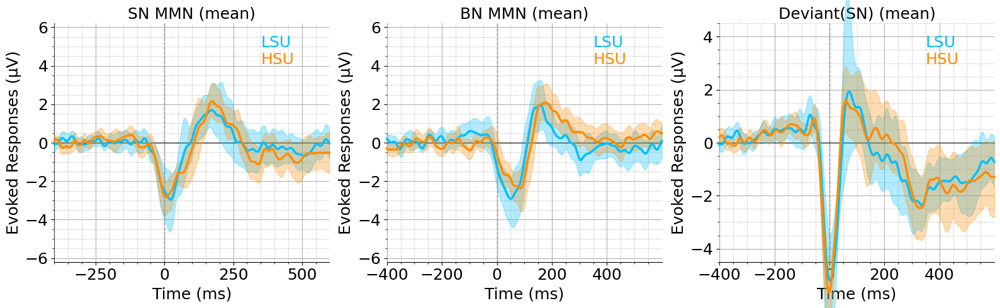

In [78]:
stylesdict ={"low sub": {"linewidth": 2.5,"linestyle":'solid','color' : 'deepskyblue'}, 
             'high sub' : {"linewidth": 2.5,"linestyle":'solid','color' : 'darkorange'},
             }


text_labels = [
    (0.90, "LSU",'deepskyblue'),
    (0.83, f"HSU",'darkorange'),
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = usage_groups_SN_MMN_evokes 
plot_erps(evokeds, picks=[ 'Fz','Cz',"FCz"],time_range=(-.400,.600),
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="SN MMN",axs=axs[0])

# Define second ERP comparison
evokeds = usage_groups_BN_MMN_evokes
plot_erps(evokeds, picks=[ 'Fz','Cz',"FCz"],
                                   stylesdict=stylesdict,time_range=(-.400,.600),
                                   text_labels=text_labels,title="BN MMN",axs=axs[1])


evokeds = usage_groups_SN_devi_evokes
plot_erps(evokeds, picks=[  'Fz','Cz',"FCz"],ylim=(-4.5,4.5),time_range=(-.400,.600),
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="Deviant(SN)",axs=axs[2])
plt.tight_layout()
plt.show()      